<a href="https://colab.research.google.com/github/kevinroccapriore/MnPS3/blob/main/MnPS3_STEM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Electron beam induced emergence of mesoscopic ordering in layered MnPS3

* Samples made by CVT method by <font color = 'crimson'>`Nan Huang`</font> & <font color = 'crimson'>`David Mandrus`</font> at University of Tennessee, Knoxville.
* STEM data collection and analysis (imaging, spectroscopy) performed by <font color = 'crimson'>`Kevin Roccapriore`</font>
* DFT calculations by <font color = 'crimson'>`Vinit Sharma`</font>
* STEM image simulations by <font color = 'crimson'>`Mark Oxley`</font>
* Band structure and dielectric property calulcations (GW + BSE) performed by <font color = 'crimson'>`Mikhail Katsnelson`</font>, <font color = 'crimson'>`Acharya Swagata`</font> and <font color = 'crimson'>`Dimitar Pashov`</font>
* Sample preparation, discussion, and experimental assistance provided by <font color = 'crimson'>`Janice Musfeldt`</font> and <font color = 'crimson'>`Timothy Taylor`</font>
* Project brainchild of and overseen by <font color = 'crimson'>`Sergei Kalinin`</font>


Last update: `09.29.2021`

A few discoveries:
* *****<font color = 'crimson'>electron beam induced mesoscopic ordering</font>*****
* edge plasmons are active in this material and can be engineered
* in general, **highly active** under the electron beam
* strong difference between in-plane and out-of-plane dielectric properties 


* Experiments have been carried out mostly @ `60 kV` on a NION monochromated aberration-corrected scanning transmission electron microscope (MACSTEM)

Load modules, functions, and color mapping for analysis

In [1]:
#@title Import modules
%%capture
from scipy.ndimage import gaussian_filter
import glob
import os
from typing import List, Tuple, Type
import numpy as np
import matplotlib.pyplot as plt
import json
import matplotlib.gridspec as gridspec
from scipy import ndimage
from scipy import signal
import operator
from scipy import interpolate
import matplotlib.patches as patches
from skimage.transform import resize
import cv2

# Basic ML modules
from sklearn.decomposition import NMF
from sklearn.decomposition import PCA
# from sklearn.cluster import KMeans
# from sklearn import mixture
# from sklearn import decomposition
# from sklearn.mixture import GaussianMixture

from scipy.signal import find_peaks

# Helps with FFT analysis
import scipy.fft
from skimage.feature import peak_local_max
from skimage import draw
from skimage.transform import resize
from scipy.spatial import cKDTree
from skimage.feature import blob_log

# Movies

# from IPython.display import Video
from IPython.core.display import Video
!pip install imageio-ffmpeg
import imageio

!pip install atomai
import atomai as aoi

from skimage.draw import circle_perimeter, circle
from skimage import draw

from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.linear_model import LinearRegression
from sklearn.mixture import GaussianMixture

Purple=150./255,50/255., 1.
Orange=1,120./255, 0
Blue=10./255,175/255., 1.
Red=200./255,20/255., 20/225.
Green=50./255,220./255, 50./255
Yellow=220./255,220./255, 90./255
Pink=255/255.,105/255., 180/255.
Gold=155/255.,205/255.,32/255.
Turquoise=72/255., 229/255., 204/255.
Brown=220/255., 142/255., 105/255.
Forest=64/255., 169/255., 64/255.
Gray=159/255., 176/255., 184/255.
Royal=95/255., 55/255., 255/255.

In [3]:
#@title Define functions
def convert_fftpixel(fft_img, calibration, pixel_value):
  freq_axis = np.fft.fftshift(np.fft.fftfreq(fft_img.shape[1], calibration))
  distance = 1/freq_axis[int((freq_axis.shape[0]/2) + pixel_value)]
  return distance
  
def remove_close_points(points, min_distance = 2):
  tree = cKDTree(points)
  close = tree.query_pairs(r = min_distance, output_type = 'ndarray')
  points = np.delete(points, close[:,0], axis = 0)
  points = points.reshape(-1,2)
  return points

def take_FFT(img, zoom, power = 1, blur = 0, center_remove = 1, blur_subtract = 1, hamming=True):
  fftimg = np.log(
    np.abs(
        np.fft.fftshift(
            np.fft.fft2(img**power)
            )
        )
    )
  c1,c2 = int(fftimg.shape[0]/2), int(fftimg.shape[1]/2)
  if center_remove > 0:
    fftimg[int(c1-center_remove):int(c1+center_remove),
           int(c2-center_remove):int(c2+center_remove)] = 0
  Z = int(fftimg.shape[0]/zoom/2)
  fftimg = fftimg[int(c1-Z):int(c1+Z),
                  int(c2-Z):int(c2+Z)]
  if blur_subtract > 0:
    fftblur = ndimage.gaussian_filter(fftimg, sigma = blur_subtract)
    fftimg = fftimg - fftblur
  if hamming:
    fftimg = ApplyHamming(fftimg,fftimg.shape[0])
  fftimg = ndimage.gaussian_filter(fftimg, blur)
  fftimg = normalize(fftimg)

  return fftimg

def OrganizeInput_TimeSpectra(numpy):
    TimeSpecRaw = np.load(numpy)
    TimeSpecj = json.load(open(numpy[:-3]+'json','r'))
    disp = TimeSpecj['spatial_calibrations'][1]['scale']
    E_offset = TimeSpecj['spatial_calibrations'][1]['offset']
    E = np.linspace(E_offset,TimeSpecRaw.shape[1]*disp+E_offset,TimeSpecRaw.shape[1])
    return TimeSpecRaw, disp, E

def OrganizeInput2(numpy):
    SIraw = np.load(numpy)
    XY = SIraw.shape[:2]
    SIj = json.load(open(numpy[:-3]+'json','r'))
    disp = SIj['spatial_calibrations'][2]['scale']
    SIraw_flat=SIraw.reshape((np.prod(XY),SIraw.shape[2]))
    E_offset = SIj['spatial_calibrations'][2]['offset']
    E = np.linspace(E_offset,SIraw.shape[2]*disp+E_offset,SIraw.shape[2])
    return SIraw, XY, disp, SIraw_flat, E

def CalibrateSI2(EAx,SI,num_spectral_px):
    m,M = np.amax(np.amin(EAx)), np.amin(np.amax(EAx))
    try:
      Eout=np.linspace(m,M,num_spectral_px)[1:]
      Eout=np.linspace(m,M,num_spectral_px,endpoint=True)
    except ValueError:
      Eout=np.linspace(m,M,5000)[1:]
      Eout=np.linspace(m,M,5000,endpoint=True)
    SIout=np.array([[interpolate.interp1d(e,s)(Eout) for e,s in zip(erow,srow)] for erow,srow in zip(EAx,SI)])
    return Eout,SIout

def CalibrateEnergyAxis2(SInc, EAx):
  '''
  For coreloss signals we don't have a "known" peak to reference (like the ZLP)
  Therefore, each (x,y) pixel will have the same energy axis as one another.
  Here we just create an array with the same shape as input SI, where every row/column
  has the same energy axis.
  '''

  EnergyAxes = np.zeros((SInc.shape[0], SInc.shape[1], EAx.shape[0]))
  for row in range(EnergyAxes.shape[0]):
    for col in range(EnergyAxes.shape[1]):
        EnergyAxes[row,col] = EAx
  return EnergyAxes

def organize_data2(filename, num_spectral_px, plot = False):
  SIraw, XY, disp, SIraw_flat, EAx = OrganizeInput2(filename) 
  SInc = CorrectNeg(SIraw, Blur = 20, Neg = -20, Pixrange = 200, plot=plot)
  EnergyAxes=CalibrateEnergyAxis2(SInc,EAx)
  E,SI=CalibrateSI2(EnergyAxes,SInc, num_spectral_px)                # calibrate energies by making all pixels start and end at same energy values
  SIflat=SI.reshape((np.prod(XY),SI.shape[2]))  

  return E, SI, XY, SIflat

def FitPowerlaw_v2(E,S,fst,fen):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    #e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    fig=plt.figure(figsize=(20,3))
    
    ax=fig.add_subplot(131)
    
    plt.plot(E,S,color='k',label='Data')
    plt.plot(E[ist:ien],S[ist:ien],marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
    plt.legend(frameon=False,fontsize=13)
    fite=np.linspace(E[ist+1],E[ien-1],1000)
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    # plt.ylim(0,0.002)
    r,A0=np.polyfit(elog,slog,1)
    
    ax=fig.add_subplot(132)
    
    plt.plot(E[ist:],S[ist:],color='k',label='Data')
    plt.plot(E[ist:],np.exp(A0)*E[ist:]**(r),'b',lw=3,label='Power Law Fit')
    plt.tick_params(labelsize=16)
    plt.legend(frameon=False,fontsize=13)
    
    ax=fig.add_subplot(133)
    
    plt.axhline(0,color='k')
    plt.plot(E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),color='b',label='Powerlaw Subtraction')
    plt.tick_params(labelsize=16)
    ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
    plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
    plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
    # plt.ylim(-0.0001,0.001)
    fit_spec = np.exp(A0)*E[ist:]**(r)
    # return fite,0.#,f(fite)-np.exp(a*fite**3+b*fite**2+c*fite+d)
    return fit_spec

########################################

def ShowUnmixed(n_comp,Eaxis,Spec,Im,rowfactor=3,cmap = 'jet'):
  rows = int(np.ceil(float(n_comp)/rowfactor))
  cols = int(np.ceil(float(n_comp)/rows))

  fig1,ax1 = plt.subplots(figsize = (10,4))

  for i in range(n_comp):
      ax1.plot(Eaxis,Spec[i], label = i+1)
      ax1.grid(True)
      ax1.tick_params(labelsize=10)
      ax1.legend()
  plt.show()

  gs2 = gridspec.GridSpec(rows, cols)
  fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

  for i in range(n_comp):
      ax2 = fig2.add_subplot(gs2[i])
      ax2.imshow(Im[i], cmap = cmap)
      ax2.set_title('Component ' + str(i+1))
      plt.setp([ax2],xticks=[], yticks=[])
      
def organize_data(filename, num_spectral_px, plot = False):
  SIraw, XY, disp, SIraw_flat = OrganizeInput(filename) 
  SInc = CorrectNeg(SIraw, Blur = 20, Neg = -20, Pixrange = 200, plot = plot)
  SIncflat = SInc.reshape((np.prod(XY),SInc.shape[2]))
  EnergyAxes=CalibrateEnergyAxis(SInc,disp)                  # align ZLP & use dispersion to go from pixel -> eV
  Eaxflat=EnergyAxes.reshape((np.prod(XY),SInc.shape[2]))    # flatten
  E,SI=CalibrateSI(EnergyAxes,SInc, num_spectral_px)                # calibrate energies by making all pixels start and end at same energy values
  SIflat=SI.reshape((np.prod(XY),SI.shape[2]))  
  return E, SI, XY, SIflat

def truncate_spectrum(ENB, cutoffenergy):
  truncate = (np.abs(ENB-cutoffenergy)).argmin()
  return truncate 

def OrganizeInput(numpy):
    SIraw = np.load(numpy)
    XY = SIraw.shape[:2]
    SIj = json.load(open(numpy[:-3]+'json','r'))
    disp = SIj['spatial_calibrations'][2]['scale']
    SIraw_flat=SIraw.reshape((np.prod(XY),SIraw.shape[2]))
    return SIraw, XY, disp, SIraw_flat
    
def LoadADF(filename):
    ADF1    = np.load(filename)
    ADF1j = json.load(open(filename[:-3]+'json','r'))
    ADF1_scale = ADF1j['spatial_calibrations'][0]['scale']
    return ADF1, ADF1_scale

def LoadMovie(filename):
    mov    = np.load(filename)
    movj = json.load(open(filename[:-3]+'json','r'))
    mov_scale = movj['spatial_calibrations'][1]['scale']
    return mov, mov_scale

def BlurSpectra_single(SIraw, sigma = 10):
    SIraw_blur_single = ndimage.filters.gaussian_filter(SIraw, sigma = sigma)
    return SIraw_blur_single

def BlurSpectra(SIraw, sigma = 10):
    SIraw_blur = np.zeros((SIraw.shape[0],SIraw.shape[1],SIraw.shape[2]))
    for i in range(SIraw.shape[0]):
        for j in range(SIraw.shape[1]):
            SIraw_blur[i,j] = ndimage.filters.gaussian_filter(SIraw[i,j,:], sigma = sigma)
    return SIraw_blur

def BlurSpectra_flat(SI, sigma = 10):
    SI_blur = np.zeros_like(SI)
    for ii in range(SI_blur.shape[0]):
        SI_blur[ii] = ndimage.filters.gaussian_filter(SI[i,:], sigma = sigma)
    return SI_blur

def CorrectNeg(SIraw, Blur = 10, Neg = -20, Pixrange = 250, plot = True):
    """
    Args:
       SI = Accepts any 3-dim SI as the operated-on SI, normally raw
       Blur =   gaussian blur sigma value. Should be set 10-30
                range to avoid false peaks due to noise
       Neg =    value which is considered to be negative. 
                Generally shouldn't be set to exactly 0 (or very close,
                like -1), due to noise effects
                **this also prevents spectra which are not negative at
                all from being artificially offset**
       Pixrange = number of pixels to average (centered around most 
                negative pixel located after blurring) over for sub-
                tracting from raw data
    Returns:
       - Original SI with offset
       - Blurred SI with offset
       - Plot of original + blurred offset 
    """  
    # blurs each pixels' spectrum
    SIraw_blur = np.zeros((SIraw.shape[0],SIraw.shape[1],SIraw.shape[2]))
    for i in range(SIraw.shape[0]):
        for j in range(SIraw.shape[1]):
            SIraw_blur[i,j] = ndimage.filters.gaussian_filter(SIraw[i,j,:], sigma = Blur)
    
    # local min peak search:
    # performs scipy findpeaks function (inverts signal to find MIN), then picks out most negative
    # again, should be OK due to the blurring previously
    # Derp, I think this could've been done much easier with np.min() and np.argmin()...
    # Actually maybe not, because I set a height parameter with findpeaks.
    
    MN = np.zeros((SIraw.shape[0],SIraw.shape[1]))
    posmaxpixel = np.zeros((SIraw.shape[0],SIraw.shape[1]))     
    for i in range(SIraw_blur.shape[0]):
        for j in range(SIraw_blur.shape[1]):
            if np.amax(SIraw[i,j])<5000:
                MN[i,j] = np.nan
            else:
                posmaxpixel[i,j]= np.argmax(SIraw_blur[i,j,:])
        
                peaks,props = signal.find_peaks(-1*SIraw_blur[i,j,int(posmaxpixel[i,j]):],height = -20)
                keys = peaks.tolist()
                values = props['peak_heights'].tolist()
                peakdict = dict(zip(keys, values))     
                sorted_peakdict = sorted(peakdict.items(), key=operator.itemgetter(1))
                mostneg = np.array(sorted_peakdict[-1:])
                mostnegT = mostneg.T
                try:
                    MN[i,j] = posmaxpixel[i,j]+mostnegT[0][0] # this is the most negative pixel, value that we need   
                except IndexError:
                    MN[i,j] = np.nan # if sample TOO THICK, spectrum is noise, so will produce index error; 
                                     # this just gives that the bird by setting to NaN.

      
            
    SInc =  np.zeros_like(SIraw)      
    SInegmean = np.zeros((SIraw.shape[0],SIraw.shape[1]))        
    for i in range(SIraw_blur.shape[0]):
         for j in range(SIraw_blur.shape[1]):
            if np.isnan(MN[i,j]) == True:     # handling if sample too thick
                SInc[i,j] = SIraw[i,j]
            elif np.isnan(MN[i,j]) == False:
                SInegmean[i,j] = np.mean(SIraw_blur[i,j,int(MN[i,j]-Pixrange/2):int(MN[i,j]+Pixrange/2)])
                SInc[i,j] = SIraw[i,j] - SInegmean[i,j]
            
                
            
    # for plotting (finding scatter XY coordinates)
    if plot == True:

      x_pos, y_pos = np.zeros_like(MN), np.zeros_like(MN)
      for i in range(SIraw_blur.shape[0]):
          for j in range(SIraw_blur.shape[1]):
              if np.isnan(MN[i,j]) == True:
                  x_pos[i,j] = 0
                  y_pos[i,j] = 0
              else:
                  x_pos[i,j] = int(MN[i,j])
                  y_pos[i,j] = SIraw_blur[i,j,int(x_pos[i,j])]
      
      i,j = np.random.randint(SIraw.shape[0]), np.random.randint(SIraw.shape[1])
                                                                            
      fig = plt.figure(figsize=(16,4))
      gs = gridspec.GridSpec(1,2)
      ax1 = plt.subplot(gs[0,0])
      ax2 = plt.subplot(gs[0,1])
      
      ax1.plot(SIraw_blur[i,j,:])
      ax1.plot(SIraw[i,j], alpha = 0.5)
      ax1.set_ylim(-100,1000)
      ax1.axhline(0,color='k',ls='--',lw=1.5)
      
      if x_pos[i,j] == 0:
          ax1.annotate('No offset performed: \nCould not find negative enough value', xy = (0.5,0.7), xycoords = 'axes fraction')
      else:
          ax1.scatter(x_pos[i,j], y_pos[i,j], color = 'r')
          patch1 = patches.Rectangle((x_pos[i,j]-Pixrange/2, y_pos[i,j]-30), Pixrange, 60, linewidth = 1, edgecolor = 'red', facecolor = 'red', fill = False)
          ax1.add_patch(patch1)
      
      
      ax2.plot(SInc[i,j])
      ax2.set_ylim(-100,1000)
      ax2.axhline(0,color='k',ls='--',lw=1.5);
    
    # r'$\bf{fixed \ data}$
    
      ax1.set_title(r'$\bf{XY} = $' + r'$\bf[{},{}]$: Raw SI, blurred SI, region of averaging'.format(i,j))
      ax2.set_title(r'$\bf{XY} = $' + r'$\bf[{},{}]$: Corrected SI'.format(i,j))
    
    else:
      pass
    
    return SInc


def CalibrateEnergyAxis(SI,disp,style='fwhm',subfitwidth=8):
    Einit=np.arange(0,SI.shape[2])*disp
    if style=='pixel': ZLPC=np.array([[Einit[np.argmax(s)] for s in row] for row in SI])
    if style=='fwhm':
        lh,uh=[],[]
        avspec=np.average(SI,axis=(0,1))
        for row in SI:
            lh.append([]);uh.append([])
            for s in row:
                if np.amax(s)<1000: # This line is for thick samples when ZLP drops to noise levels
                    s=avspec
                lh[-1].append(Einit[np.argmin(np.abs(s[:np.argmax(s)]/np.amax(s)-0.5))])
                uh[-1].append(Einit[np.argmin(np.abs(s[np.argmax(s):]/np.amax(s)-0.5))+np.argmax(s)])
        lh=np.asarray(lh)        
        uh=np.asarray(uh)
        ZLPC=np.average([uh,lh],axis=0)
    if style=='subpixel':
        def gauss(x,a,x0,s): return a*np.exp(-(x-x0)**2/s**2)
        from scipy.optimize import curve_fit
        ZLPC=np.array([[curve_fit(gauss,Einit[np.argmax(s)-W:np.argmax(s)+W],
                               s[np.argmax(s)-W:np.argmax(s)+W]/np.amax(s))[0][1] for s in row] for row in SI])
    return np.array([[Einit-c for c in row] for row in ZLPC])
    
def CalibrateSI(EAx,SI,num_spectral_px):
    m,M = np.amax(np.amin(EAx,axis=(2))), np.amin(np.amax(EAx,axis=(2)))
    try:
      Eout=np.linspace(m,M,num_spectral_px)[1:]
      Eout=np.linspace(m,M,num_spectral_px,endpoint=True)
    except ValueError:
      Eout=np.linspace(m,M,5000)[1:]
      Eout=np.linspace(m,M,5000,endpoint=True)
    SIout=np.array([[interpolate.interp1d(e,s)(Eout) for e,s in zip(erow,srow)] for erow,srow in zip(EAx,SI)])
    return Eout,SIout

def FitPowerlaw(E,S,fst,fen):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    #e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    fig=plt.figure(figsize=(20,3))
    
    ax=fig.add_subplot(131)
    
    plt.plot(E,S,color='k',label='Data')
    plt.plot(E[ist:ien],S[ist:ien],marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
    plt.legend(frameon=False,fontsize=13)
    fite=np.linspace(E[ist+1],E[ien-1],1000)
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    plt.ylim(0,0.002)
    r,A0=np.polyfit(elog,slog,1)
    
    ax=fig.add_subplot(132)
    
    plt.plot(E[ist:],S[ist:],color='k',label='Data')
    plt.plot(E[ist:],np.exp(A0)*E[ist:]**(r),'b',lw=3,label='Power Law Fit')
    plt.tick_params(labelsize=16)
    plt.legend(frameon=False,fontsize=13)
    
    ax=fig.add_subplot(133)
    
    plt.axhline(0,color='k')
    plt.plot(E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),color='b',label='Powerlaw Subtraction')
    plt.tick_params(labelsize=16)
    ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
    plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
    plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
    plt.ylim(-0.0001,0.001)
    return fite,0.#,f(fite)-np.exp(a*fite**3+b*fite**2+c*fite+d)
  
def FitPowerlaw2R(E,S,fs1,fe1,fs2,fe2):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    fig=plt.figure(figsize=(20,3))
    
    ax=fig.add_subplot(131)
    
    plt.plot(E*1000,S,color='k',label='Data')
    plt.plot(e*1000,s,marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
    plt.legend(frameon=False,fontsize=13)
    fite=np.linspace(E[is1+1],E[ie2-1],300)
    f=interpolate.interp1d(E[is1:ie2],S[is1:ie2],kind='linear')
    nozeros=s[np.where(s>0)]
    nozeroe=e[np.where(s>0)]
    elog=np.log(nozeroe)
    slog=np.log(nozeros)
    plt.ylim(0,0.02)
    r,A0=np.polyfit(elog,slog,1)
    
    ax=fig.add_subplot(132)
    
    plt.plot(E[is1:]*1000,S[is1:],color='k',label='Data')
    plt.plot(E[is1:]*1000,np.exp(A0)*E[is1:]**(r),'b',label='Power Law Fit')
    plt.tick_params(labelsize=16)
    plt.legend(frameon=False,fontsize=13)
    
    ax=fig.add_subplot(133)
    
   # plt.plot(fite,f(fite)-np.exp(a*fite**3+b*fite**2+c*fite+d),color='r',label='Exponential Subtraction')
    plt.plot(E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r),color='b',label='Powerlaw Subtraction')
    plt.tick_params(labelsize=16)
    ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
    plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
    plt.axhline(0,color='k')
    plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
    
    plt.ylim(-0.0001,0.001)
    
    return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)


## background subtraction using either 1 region or 2 regions:

def RemoveBackgroundSI(E,S,fst,fen):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    if len(np.where(S[ist:ien]>0)[0]) == 0.: 
        plt.plot(E[ist:],S[ist:])
        return E[ist:],np.zeros(E[ist:].shape)
    r,A0=np.polyfit(elog,slog,1)
    return E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),

def RemoveBackgroundSI_THICK(E,S,fst,fen, threshold = 5000):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
    elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
    slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
    if len(np.where(S[ist:ien]>0)[0]) == 0.: 
        plt.plot(E[ist:],S[ist:])
        return E[ist:],np.zeros(E[ist:].shape)
    if np.max(S) > threshold:
      r,A0=np.polyfit(elog,slog,1)
      return E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),
    else:
      print("Too thick sir or ma'am")
      return E[ist:],S[ist:]
  
def RemoveBackgroundSI2R(E,S,fs1,fe1,fs2,fe2):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    elog=np.log(e[np.where(s>0)])
    slog=np.log(s[np.where(s>0)])
    r,A0=np.polyfit(elog,slog,1)
    return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)

def RemoveBackgroundSI2R_THICK(E,S,fs1,fe1,fs2,fe2, threshold = 5000):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
    if np.max(S)>threshold:
      elog=np.log(e[np.where(s>0)])
      slog=np.log(s[np.where(s>0)])
      r,A0=np.polyfit(elog,slog,1)
      return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)
    else:
      print('too thick? Consider adjusting threshold')
      return E[is1:], S[is1:]

def FitPowerlaw_THICK(E,S,fst,fen, threshold = 5000):
    ist=np.argmin(np.abs(E-fst));ien=np.argmin(np.abs(E-fen))
    #e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])

    if np.max(S) > threshold:
      fig=plt.figure(figsize=(20,3))
      
      ax=fig.add_subplot(131)
      
      plt.plot(E,S,color='k',label='Data')
      plt.plot(E[ist:ien],S[ist:ien],marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
      plt.legend(frameon=False,fontsize=13)
      fite=np.linspace(E[ist+1],E[ien-1],1000)
      f=interpolate.interp1d(E[ist:ien],S[ist:ien],kind='linear')
      elog=np.log(E[ist:ien][np.where(S[ist:ien]>0)])
      slog=np.log(S[ist:ien][np.where(S[ist:ien]>0)])
      # plt.ylim(0,0.002)
      r,A0=np.polyfit(elog,slog,1)
      
      ax=fig.add_subplot(132)
      
      plt.plot(E[ist:],S[ist:],color='k',label='Data')
      plt.plot(E[ist:],np.exp(A0)*E[ist:]**(r),'b',lw=3,label='Power Law Fit')
      plt.tick_params(labelsize=16)
      plt.legend(frameon=False,fontsize=13)
      
      ax=fig.add_subplot(133)
      
      plt.axhline(0,color='k')
      plt.plot(E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r),color='b',label='Powerlaw Subtraction')
      plt.tick_params(labelsize=16)
      ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
      plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
      plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
      # plt.ylim(-0.0001,0.001)

      return E[ist:],S[ist:]-np.exp(A0)*E[ist:]**(r)

    else: # if max signal is <5000 counts, too thick for fitting
      S = S # Then don't perform any fitting, leave pixel as-is
      fig=plt.figure(figsize=(8,5))
      ax=fig.add_subplot(131)
      plt.plot(E*1000,S,color='k',label='Data')
      plt.title("Too thick for fitting")

      return E[ist:],S[ist:]

def FitPowerlaw2R_THICK(E,S,fs1,fe1,fs2,fe2, threshold = 5000):
    is1=np.argmin(np.abs(E-fs1));ie1=np.argmin(np.abs(E-fe1))
    is2=np.argmin(np.abs(E-fs2));ie2=np.argmin(np.abs(E-fe2))
    
    if np.max(S) > threshold: 
      S = S/np.amax(S)
      e,s=np.append(E[is1:ie1],E[is2:ie2]),np.append(S[is1:ie1],S[is2:ie2])
      fig=plt.figure(figsize=(20,3))
      
      ax=fig.add_subplot(131)
      
      plt.plot(E*1000,S,color='k',label='Data')
      plt.plot(e*1000,s,marker='o',ms=7,markerfacecolor='none',markeredgecolor='r',lw=0,label='Fit Region')
      plt.legend(frameon=False,fontsize=13)
      fite=np.linspace(E[is1+1],E[ie2-1],300)
      f=interpolate.interp1d(E[is1:ie2],S[is1:ie2],kind='linear')
      nozeros=s[np.where(s>0)]
      nozeroe=e[np.where(s>0)]
      elog=np.log(nozeroe)
      slog=np.log(nozeros)
      # plt.ylim(0,0.02)
      r,A0=np.polyfit(elog,slog,1)
      
      ax=fig.add_subplot(132)
      
      plt.plot(E[is1:]*1000,S[is1:],color='k',label='Data')
      plt.plot(E[is1:]*1000,np.exp(A0)*E[is1:]**(r),'b',label='Power Law Fit')
      plt.tick_params(labelsize=16)
      plt.legend(frameon=False,fontsize=13)
      
      ax=fig.add_subplot(133)
      
    # plt.plot(fite,f(fite)-np.exp(a*fite**3+b*fite**2+c*fite+d),color='r',label='Exponential Subtraction')
      plt.plot(E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r),color='b',label='Powerlaw Subtraction')
      plt.tick_params(labelsize=16)
      ax.set_xlabel(r'Energy Loss ($eV$)',fontsize=16)
      plt.subplots_adjust(top=1,bottom=0.06,right=1,left=0.15)
      plt.axhline(0,color='k')
      plt.legend(frameon=False,fontsize=10,labelspacing=0.3,handlelength=1,handletextpad=0.2)
      
      # plt.ylim(-0.001,0.001)

      return E[is1:],S[is1:]-np.exp(A0)*E[is1:]**(r)

    else: # if max signal is <5000 counts, too thick for fitting
      S = S # Then don't perform any fitting, leave pixel as-is
      fig=plt.figure(figsize=(20,3))
      ax=fig.add_subplot(131)
      plt.plot(E*1000,S,color='k',label='Data')
      plt.title("Too thick for fitting")

      return E[is1:],S[is1:]  # Still return with the truncated energy and spectra, to align with the rest
    

def normalize(image):
  return (image - np.min(image))/(np.ptp(image))

def MakeCompositeImage(ims,colors):
    """
    Adds and averages different maps to form a composite map
    
    Input:  ims    - list of images of same dimension (numpy array)
            colors - a list of colors in rgb format (triple of fractional values)
            labels - labels for the different images (tuple of strings)
    Output: out_im - Composite image (RGB image)
    """
    ims=np.asarray(ims)
    dims=ims.shape
    print(dims)
    out_im=np.zeros(dims[1:]+(3,))
    for i in range(dims[1]):
      for j in range(dims[2]):
        out_im[i,j]=np.sum([v*np.asarray(c) for v,c in zip(ims[:,i,j],colors)],axis=0)/np.sum(ims[:,i,j])
    return out_im

def SlidingFFT(image, winsize, stepsize, zoom, interpolate, ham = True):
  # Get coords for slicing
  x_positions = np.arange(0, image.shape[0] - winsize, stepsize)
  y_positions = np.arange(0, image.shape[0] - winsize, stepsize)
  x_pos = np.tile(x_positions, len(x_positions)).reshape(len(x_positions)**2,1)
  y_pos = np.repeat(y_positions, len(y_positions)).reshape(len(y_positions)**2,1)
  positions = np.concatenate((x_pos, y_pos),axis = 1)

  # Do slicing
  FFTstack = np.zeros((len(positions), int(winsize*upscale/zoom), int(winsize*upscale/zoom)))
  for ii in range(len(positions)):
    crop = image[int(positions[ii,0]) : int(positions[ii,0]+winsize),
                int(positions[ii,1]) : int(positions[ii,1]+winsize)]
    if ham == True:
      crop_clean = ApplyHamming(np.copy(crop),winsize)
    else:
      crop_clean = np.copy(crop)
    
    # FFT on each slice
    FFT_ = scipy.fft.fft2(crop_clean)
    FFT = np.abs(scipy.fft.fftshift(FFT_))

    # Zoom the FFT by cropping around center and upscaling the image
    zoom_in = winsize/2/zoom
    FFT_zoom_ = FFT[int(winsize/2 - zoom_in) : int(winsize/2 + zoom_in),
                    int(winsize/2 - zoom_in) : int(winsize/2 + zoom_in)]
    FFT_zoom = ndimage.zoom(FFT_zoom_, upscale)
    FFTstack[ii] = FFT_zoom

  # Reshape the image stack such that it coincides with 2 spatial dimensions (becomes a 2D image!)
  FFTdeconvolve = np.reshape(FFTstack, (
                            int(np.sqrt(FFTstack.shape[0])),
                            int(np.sqrt(FFTstack.shape[0])),
                            int(winsize*upscale/zoom),
                            int(winsize*upscale/zoom))
                            )
  return FFTdeconvolve

def LoadCCD(filename, angle_correction = 1E3, return_metric = True):
    img = np.load(filename)
    img_j = json.load(open(filename[:-3]+'json','r'))
    try:
      defocus = img_j['metadata']['hardware_source']['autostem']['defocus_m']
    except KeyError:
      try:
        defocus = img_j['metadata']['instrument']['defocus']  # New MACSTEM location
      except KeyError:
        print('figure this json out...')
    mrad_scale = img_j['spatial_calibrations'][0]['scale']*angle_correction  # angle correction is just for whatever reason, swift has all angles in mrad off by 1000
    # deg_scale = mrad_scale*180/(1000*np.pi)
    metric_scale = defocus*np.tan(mrad_scale/1000)  # divide by 1000 to get to RADIANS now
    if return_metric:
      return img, metric_scale
    else:
      return img, mrad_scale

def ApplyHamming(imgsrc, winsize):
    #Applies a Hamming window to the input imgsec, returns the window after filter applied.
    bw2d = np.outer(np.hamming(winsize), np.ones(winsize))
    bw2d = np.sqrt(bw2d * bw2d.T) 
    imgsrc *= bw2d
    return imgsrc

def ADF_mask(nxpix,nypix,du,dv,rout,rin):
    ixcent = int(nxpix/2)
    iycent = int(nypix/2)
    mask = np.zeros((nypix,nxpix))
    for i in range(nypix):
        for j in range(nxpix):
            ry = abs(iycent-i)*dv
            rx = abs(ixcent-j)*du
            r2 =rx*rx+ry*ry
            if r2 <rout**2 and r2> rin**2:
                mask[i,j] = 1.0
    return mask

def COM(nysamp, nxsamp, nypix, nxpix, duin, dvin,CBED_in):
    from scipy import ndimage
    import math
    
    com_mag = np.zeros((nysamp, nxsamp))
    com_y = np.zeros((nysamp, nxsamp))
    com_x = np.zeros((nysamp, nxsamp))
    angle = np.zeros((nysamp, nxsamp))
    xyzero = np.zeros(2)
    xyzero = ndimage.measurements.center_of_mass(np.mean(CBED_in, axis=(0,1)) )   
#    xyzero[0] = nypix/2
#    xyzero[1] = nxpix/2
    
    for y in range(nysamp):
        for x in range(nxsamp):
            xycbed = ndimage.measurements.center_of_mass(CBED_in[y,x,:,:])
            com_x[y,x] = (xycbed[1]-xyzero[1])*duin
            com_y[y,x] = (xycbed[0]-xyzero[0])*dvin
            com_mag[y,x] = math.sqrt(com_y[y,x]*com_y[y,x]+com_x[y,x]*com_x[y,x])  
            
    angle = np.arctan2(com_y,com_x)  
    
    return com_y, com_x, angle, com_mag

def Load4D(filename):

  file4D = np.load(filename)
  json4D = json.load(open(filename[:-3]+'json','r'))
  mradpx = json4D['spatial_calibrations'][2]['scale']*1000

  return file4D, mradpx

def COM_full(nysamp, nxsamp, nypix, nxpix, duin, dvin,CBED_in):
    from scipy import ndimage
    import math
    
    com_mag = np.zeros((nysamp, nxsamp))
    com_y = np.zeros((nysamp, nxsamp))
    com_x = np.zeros((nysamp, nxsamp))
    angle = np.zeros((nysamp, nxsamp))
    xyzero = np.zeros(2)
    xyzero = ndimage.measurements.center_of_mass(np.mean(CBED_in, axis=(0,1)) )   
#    xyzero[0] = nypix/2
#    xyzero[1] = nxpix/2
    
    for y in range(nysamp):
        for x in range(nxsamp):
            xycbed = ndimage.measurements.center_of_mass(CBED_in[y,x,:,:])
            com_x[y,x] = (xycbed[1]-xyzero[1])*duin
            com_y[y,x] = (xycbed[0]-xyzero[0])*dvin
            com_mag[y,x] = math.sqrt(com_y[y,x]*com_y[y,x]+com_x[y,x]*com_x[y,x])  
            
    angle = np.arctan2(com_y,com_x)  
    
    return com_y, com_x, angle, com_mag


# To stop warning logs during movie creation

import imageio.core.util

def silence_imageio_warning(*args, **kwargs):
    pass

imageio.core.util._precision_warn = silence_imageio_warning

In [2]:
#@title Color Mapping
from matplotlib.colors import LinearSegmentedColormap

Purple=130./255,53/255., 1.
Orange=1,120./255, 0
Blue=10./255,100/255., 1.
Red=200./255,20/255., 20/225.
Green=10./255,150./255, 80./255
Pink=255/255.,105/255., 180/255.
Gold=155/255.,205/255.,32/255.
Gray=159/255., 176/255., 184/255

# Turquoise=72/255., 229/255., 204/255.
# Brown=220/255., 142/255., 105/255.
# Forest=64/255., 169/255., 64/255.
# Royal=95/255., 55/255., 255/255.

colorlist = [Purple, Orange, Blue, Red, Green, Pink, Gold, Gray]

data1 = np.linspace(0, 1, 2500).reshape((50, 50)) # test space used to visualize colormaps below


Cmap_Purple = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Purple),(1,1,1)], N=100)
Cmap_Orange = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Orange),(1,1,1)], N=100)
Cmap_Blue = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Blue),(1,1,1)], N=100)
Cmap_Red = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Red),(1,1,1)], N=100)
Cmap_Green = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Green),(1,1,1)], N=100)
Cmap_Pink = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Pink),(1,1,1)], N=100)
Cmap_Gold = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Gold),(1,1,1)], N=100)
Cmap_Gray = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Gray),(1,1,1)], N=100)

Cmap_list = [Cmap_Purple, Cmap_Orange, Cmap_Blue, Cmap_Red, Cmap_Green, Cmap_Pink, Cmap_Gold, Cmap_Gray]

Cmap_Blackbody = LinearSegmentedColormap.from_list('list', [(0, 0, 0.0), (0, 0.1, 0.75),(0.75,0,0.75),(1,0.75,0), (1,1,1)], N=100)

# Images

In [4]:
cd "/content"

/content


In [5]:
!mkdir Images

In [6]:
cd "Images"

/content/Images


In [7]:
%%capture
!wget https://www.dropbox.com/s/y52yng0heoyyo55/Images_Set5.zip
!wget https://www.dropbox.com/s/0kcqx6puvg107jw/MnPS3_patterns.zip
!wget https://www.dropbox.com/s/xigi7xandfunnr6/PatterningMnPS3_examples.zip
!wget https://www.dropbox.com/s/m57o3ndslc2mmmt/ImageSims.zip

!unzip PatterningMnPS3_examples.zip
!unzip Images_Set5.zip
!unzip MnPS3_patterns.zip
!unzip ImageSims.zip

!rm Images_Set5.zip
!rm MnPS3_patterns.zip
!rm PatterningMnPS3_examples.zip
!rm ImageSims.zip

## Image Simulations [103]

In [8]:
Sim_files = sorted(glob.glob('*.txt'))
Sim_files = np.roll(np.asarray(Sim_files),1).tolist()  # Reorder properly
Sim_files

['MnPS3_orth_df=0.00_temporal_S=0.75.txt',
 'MnPS3_2layers_df=0.00_temporal_S=0.75.txt',
 'MnPS3_3layers_df=0.00_temporal_S=0.75.txt',
 'MnPS3_4layers_df=0.00_temporal_S=0.75.txt',
 'MnPS3_5layers_df=0.00_temporal_S=0.75.txt',
 'MnPS3_6layers_df=0.00_temporal_S=0.75.txt']

In [9]:
Sim_images = []
for im in Sim_files:
  Sim_images.append(np.loadtxt(im))
Sim_images = np.asarray(Sim_images)
Sim_images.shape

(6, 200, 173)

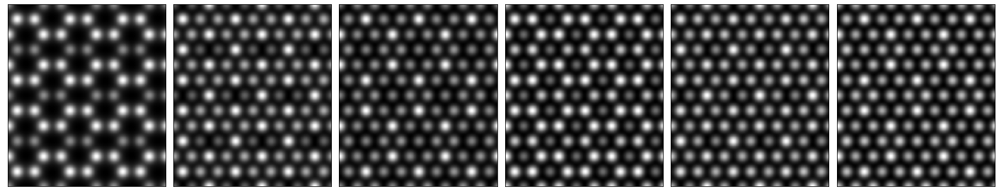

In [10]:
images = Sim_images

num_im = int(len(images))

rows = int(np.ceil(float(num_im)/6))
cols = int(np.ceil(float(num_im)/rows))

gs = gridspec.GridSpec(rows, cols, wspace=0.05)
fig = plt.figure(figsize = (25,5))   
for kk in range(int(num_im)):
    ax = fig.add_subplot(gs[kk])
    ax.imshow(images[kk], cmap = 'gray')
    # ax.set_title("{} layer(s)".format(kk+1), fontsize = 16)
    plt.setp([ax],xticks=[], yticks=[])

In [11]:
## Tile them, we will FFT these later.

Sim_image_1 = np.tile(Sim_images[0], (6,6))[:1024,:1024]
Sim_image_2 = np.tile(Sim_images[1], (6,6))[:1024,:1024]
Sim_image_3 = np.tile(Sim_images[2], (6,6))[:1024,:1024]
Sim_image_4 = np.tile(Sim_images[3], (6,6))[:1024,:1024]
Sim_image_5 = np.tile(Sim_images[4], (6,6))[:1024,:1024]
Sim_image_6 = np.tile(Sim_images[5], (6,6))[:1024,:1024]
Sim_tiled = np.asarray([Sim_image_1, Sim_image_2, Sim_image_3, Sim_image_4, Sim_image_5, Sim_image_6])

In [ ]:
images = Sim_images

num_im = int(len(images)*2)

rows = int(np.ceil(float(num_im)/6))
cols = int(np.ceil(float(num_im)/rows))

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (25,10))   
for kk in range(int(num_im/2)):
    ax = fig.add_subplot(gs[kk])
    ax.imshow(images[kk], cmap = 'gray')
    ax.set_title("{} layer(s)".format(kk+1), fontsize = 16)
    plt.setp([ax],xticks=[], yticks=[])
for i,kk in enumerate(range(int(num_im/2), num_im)):
    ax = fig.add_subplot(gs[kk])
    ax.imshow(Sim_tiled[i], cmap = 'gray')
    ax.set_title("{} layer(s)".format(i+1), fontsize = 16)
    plt.setp([ax],xticks=[], yticks=[])

In [13]:
HAADF_files = sorted(glob.glob('*.npy'))
HAADFs, HAADF_scales = [], []

for k in HAADF_files:
  img, scale = LoadADF(k)
  HAADFs.append(img), HAADF_scales.append(scale)

len(HAADFs)

15

In [ ]:
HAADF_files

## Experimental HAADF-STEM images

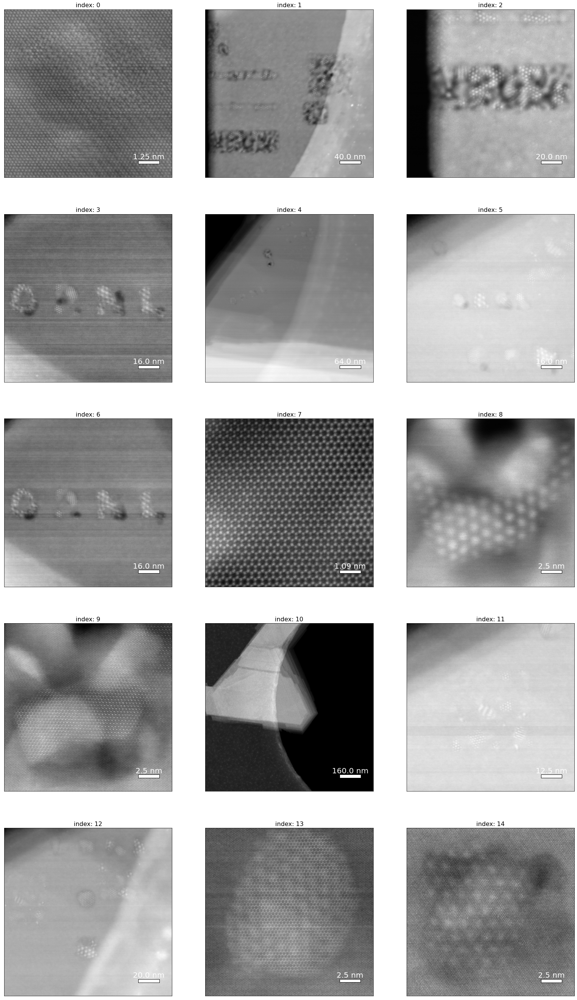

In [15]:
images, scales = HAADFs, HAADF_scales
scalebar_ = 0.125  # fraction of the FOV. 0.125 is 1/8 of the image length, for example, so that it is more generalizable to a wide range of FOVs

num_im = len(images)

rows = int(np.ceil(float(num_im)/3))
cols = int(np.ceil(float(num_im)/rows))

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (9*cols, 8*(1+rows)))   
for kk in range(num_im):
    ax = fig.add_subplot(gs[kk])
    ax.imshow(images[kk], cmap = 'gray')
    ax.set_title("index: {}".format(kk), fontsize = 16)
    plt.setp([ax],xticks=[], yticks=[])

    length = scalebar_*images[kk].shape[0]
    height = 0.15*length

    scalebar = round(length * scales[kk],2)
    xx,yy = images[kk].shape[0], images[kk].shape[1]
    xfrac, yfrac = 0.8, 0.9
    p1,p2 = xfrac*xx, yfrac*yy
    ax.add_patch(patches.Rectangle((p1,p2), length, height, color = 'white', ec='k', lw=1, fill = True))

    midpointx = int(p1+length/2)
    midpointy = int(p2-height/2)
    ax.annotate("{} nm".format(scalebar), (midpointx,midpointy), color = 'w', fontsize = 20 ,ha = 'center') 

In [ ]:
kk = 7
scalebar = 0.5 # nm

img1 = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
# img1 = normalize(ndimage.gaussian_filter(img1, sigma = blur))
fig, ax = plt.subplots(1,2,figsize=(18,9))

ax[0].imshow(img1, cmap = 'gray', vmax = 1)
ax[1].imshow(img1, cmap = 'gnuplot2', vmax = 0.5)
length = scalebar/scale  
height = length/8
origin = 0.8*img1.shape[1], 0.9*img1.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))
ax[1].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

ax[0].axis('off'), ax[1].axis('off');

In [ ]:
kk = 3
blur = 20
scalebar = 20 # nm
win1, win2 = 256, 512

img1 = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
fig, ax = plt.subplots(1,2,figsize=(18,9))

c1,c2 = img1.shape[0]/2, img1.shape[1]/2
img1_crop = normalize(img1[int(c1-win1):int(c1+win1),
                          int(c2-win2):int(c2+win2)])

ax[0].imshow(img1, cmap = 'gray', vmax = 1)
ax[1].imshow(img1_crop, cmap = 'gray', vmax = 1)

length = scalebar/scale  
height = length/8
origin1 = 0.8*img1.shape[1], 0.94*img1.shape[0]
origin2 = 0.8*img1_crop.shape[1], 0.9*img1_crop.shape[0]

ax[0].add_patch(patches.Rectangle((origin1), length, height, fill = True, ec = 'k', color = 'w'))
ax[1].add_patch(patches.Rectangle((origin2), length, height, fill = True, ec = 'k', color = 'w'))

axes = [ax[0],ax[1]]

for ax in axes:
  for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
plt.setp(axes,xticks=[],yticks=[])
# ax[0].axis('off'), ax[1].axis('off');


In [ ]:
kk = 1
scalebar = 50 # nm
win1, win2 = 256, 512

img1 = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
fig, ax = plt.subplots(1,2,figsize=(18,9))

c1,c2 = img1.shape[0]/2, img1.shape[1]/2

img1_crop = normalize(img1[int(c1-win1):int(c1+win1),
                          int(c2-win2):int(c2+win2)])

x1,x2 = 0, 512
y1,y2 = 300,700
img1_crop = normalize(img1[y1:y2,
                           x1:x2])


ax[0].imshow(img1, cmap = 'gray', vmax = 1)
ax[1].imshow(img1_crop, cmap = 'gray', vmax = 1)

length = scalebar/scale  
height = length/8
origin1 = 0.8*img1.shape[1], 0.94*img1.shape[0]
origin2 = 0.8*img1_crop.shape[1], 0.9*img1_crop.shape[0]

ax[0].add_patch(patches.Rectangle((origin1), length, height, fill = True, ec = 'k', color = 'w'))
ax[1].add_patch(patches.Rectangle((origin2), length, height, fill = True, ec = 'k', color = 'w'))

ax[0].axis('off'), ax[1].axis('off');

[]

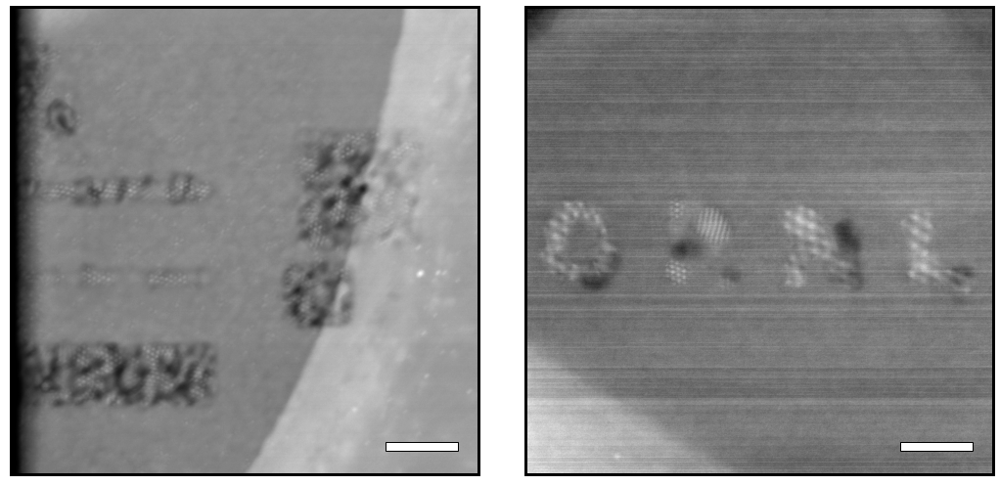

In [ ]:
k1,k2 = 1, 3
blur = 20
scalebar1 = 50 # nm
scalebar2 = 20 # nm
win1, win2 = 256, 512

img1 = normalize(HAADFs[k1])
img2 = normalize(HAADFs[k2])

scale1 = HAADF_scales[k1]
scale2 = HAADF_scales[k2]
fig = plt.figure(figsize=(18,9))
gs = gridspec.GridSpec(1,2, wspace = 0.1)
ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1])

# c1,c2 = img1.shape[0]/2, img1.shape[1]/2
# img1_crop = normalize(img1[int(c1-win1):int(c1+win1),
#                           int(c2-win2):int(c2+win2)])

ax1.imshow(img1, cmap = 'gray', vmax = 1)
ax2.imshow(img2, cmap = 'gray', vmax = 1)

length1, length2 = scalebar1/scale1, scalebar2/scale2
height1, height2 = length1/8, length2/8
origin1 = 0.8*img1.shape[1], 0.93*img1.shape[0]
origin2 = 0.8*img2.shape[1], 0.93*img2.shape[0]

ax1.add_patch(patches.Rectangle((origin1), length1, height1, fill = True, ec = 'k', color = 'w'))
ax2.add_patch(patches.Rectangle((origin2), length2, height2, fill = True, ec = 'k', color = 'w'))

axes = [ax1,ax2]

for ax in axes:
  for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
plt.setp(axes,xticks=[],yticks=[])
# ax0.axis('off'), ax1.axis('off');


(-0.5, 2047.5, 2047.5, -0.5)

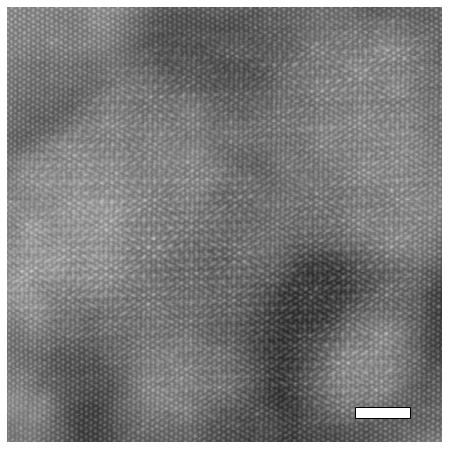

In [ ]:
kk = 0

img, scale = HAADFs[kk], HAADF_scales[kk]
fft01 = take_FFT(img, 8, power = 2, blur = 1, blur_subtract = 10, hamming = True)
fig,ax = plt.subplots(1,figsize=(8,8))
ax.imshow(img, cmap = 'gray')

xx,yy = img.shape[0], img.shape[1]
xfrac, yfrac = 0.8, 0.92
p1,p2 = xfrac*xx, yfrac*yy

scalebar = 2 # nm
length = scalebar/scale

ax.add_patch(patches.Rectangle((p1,p2), length, length/5, color = 'w', ec = 'k', lw = 1))
ax.axis('off')

(-0.5, 749.5, 499.5, -0.5)

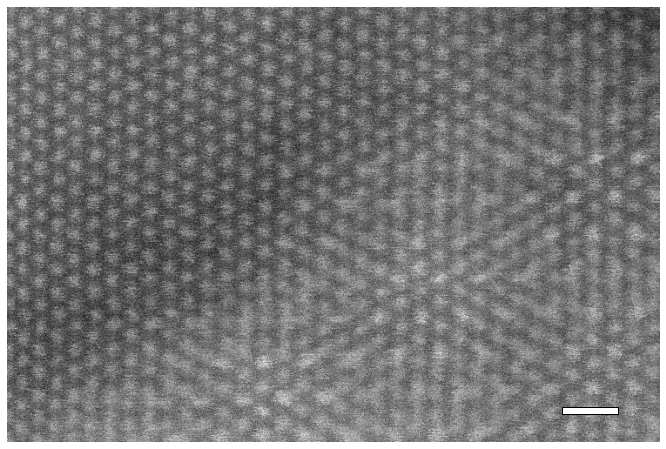

In [ ]:
kk = 0

img, scale = HAADFs[kk], HAADF_scales[kk]
# fft01 = take_FFT(img, 8, power = 2, blur = 1, blur_subtract = 10, hamming = True)
fig,ax = plt.subplots(1,figsize=(16,8))
img_c = img[250:750, 0:750]
ax.imshow(img_c, cmap = 'gray')

xx,yy = img_c.shape[1], img_c.shape[0]
xfrac, yfrac = 0.85, 0.92
p1,p2 = xfrac*xx, yfrac*yy

scalebar = 0.5 # nm
length = scalebar/scale

ax.add_patch(patches.Rectangle((p1,p2), length, length/9, color = 'w', ec = 'k', lw = 1))
ax.axis('off')

# Image overlay (plus Fourier peak finder) widget

In [ ]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
from skimage.transform import warp, AffineTransform, rotate

In [ ]:
@interact
def Explore_overlay(Compress = (0.75, 1.25, 0.01), 
                    Translate_x = (-100, 100, 5),
                    Translate_y = (-100, 100, 5),
                    Rotation = (-30, 30, 0.1),
                    Power = (1,4,1),
                    FFT_zoom = (1,10,1),
                    Blur = (0, 10, 1),
                    Smooth = (0,5,0.1),
                    MIN_SIG = (0.3,1.0,0.01),
                    MAX_SIG = (1.0,2.0,0.1),
                    THRESH = (0.05, 0.15, 0.01)):
  
    # Real Space image
    tform = AffineTransform(scale = [Compress, Compress],
                            translation = [Translate_x, Translate_y],
                            )
    final_ = normalize(rotate(warp(img1, tform.inverse), angle = Rotation))
    final = img1*0.5 + final_*0.5

    # FFT image
    FT = np.abs(np.log(np.fft.fftshift(np.fft.fft2(final))))
    c1,c2 = int(FT.shape[0]/2), int(FT.shape[1]/2)
    Z = int(FT.shape[0]/FFT_zoom/2)
    FT_crop = FT[int(c1-Z):int(c1+Z),
                 int(c2-Z):int(c2+Z)]
    FT_blur = ndimage.gaussian_filter(FT_crop, sigma = Blur)
    FT_ = FT_crop - FT_blur
    FT = ApplyHamming(FT_, FT_.shape[0])
    FT = FT**Power
    FT = normalize(ndimage.gaussian_filter(FT, sigma = Smooth))
    fig,ax = plt.subplots(1,2,figsize=(16,8))
    ax[0].imshow(final, cmap = 'gray')
    ax[1].imshow(FT, cmap = 'gray',vmax = 0.5)
    
    min_distance = 2
   ## don't forget this ADDITIONAL power term here (to the 3rd power right now) - can better help to visualize/find peaks

    blobs = blob_log(FT, min_sigma = MIN_SIG, max_sigma = MAX_SIG, threshold = THRESH)[:,:2]
    blobs = remove_close_points(blobs, min_distance = min_distance)  # contains the kd_tree search
    ax[1].scatter(blobs[:,1], blobs[:,0], c='r', s=30)
    ax[1].set_title('{}'.format(blobs))



# FFTs

[0.09411765 0.18823529        inf 0.18823529 0.09467456]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in true_divide


(-0.5, 1023.5, 1023.5, -0.5)

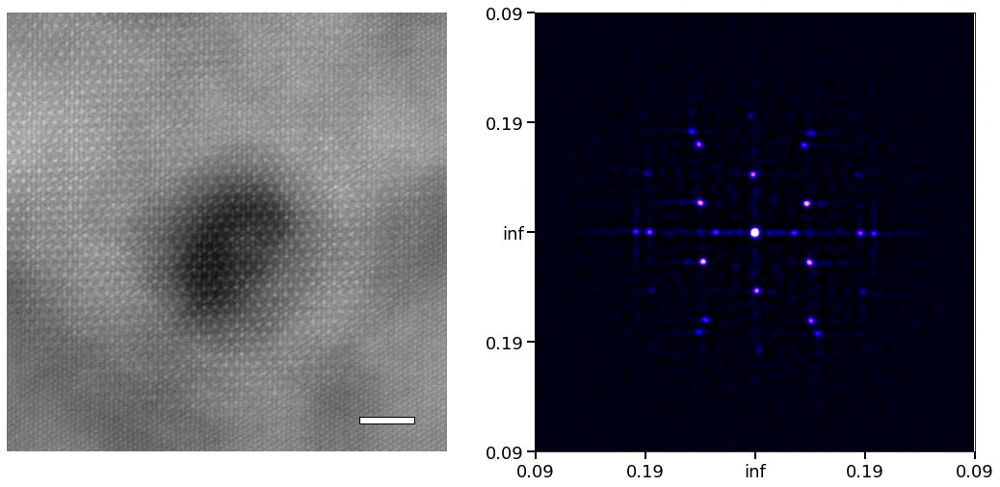

In [ ]:
kk = 4
zoom = 3
img = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
fft = take_FFT(img, zoom, power=2, blur = 2, center_remove=0, blur_subtract = 3, hamming = True)

fig, ax = plt.subplots(1,2,figsize=(18,9))

scalebar = 2
ax[0].imshow(img, cmap = 'gray', vmax = 1)
length = scalebar/scale  
height = length/8
origin = 0.8*img.shape[1], 0.92*img.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))



ax[1].imshow(normalize(fft**3), cmap = 'gnuplot2', vmax =0.35)


# All this is to get the correct AXIS for the FFT image.
freq_axis = np.fft.fftshift(np.fft.fftfreq(img.shape[0], scale))
fft_axis = np.abs(1/freq_axis)
delta = int((fft.shape[0])/2)
fft_lim_L, fft_lim_H = int(fft_axis.shape[0]/2 - delta),  int(fft_axis.shape[0]/2 + delta)
fft_axis_scaled = fft_axis[fft_lim_L:fft_lim_H]

sizes = fft.shape[0]
five_ticks = int(sizes/4)

ticks = np.linspace(0,sizes,int(sizes+1))
ticks = ticks[::five_ticks]
labels_ = fft_axis_scaled[::five_ticks]
if len(labels_) !=5:
  labels_ = np.append(labels_, fft_axis_scaled[-1])
print(labels_)
labels = np.round(labels_, 2)
labels[int(len(labels)/2)] = np.inf

ax[1].set_xticks(ticks)
ax[1].set_yticks(ticks)
ax[1].set_xticklabels(labels);
ax[1].set_yticklabels(labels);
ax[1].tick_params(labelsize = 18, length = 8, width = 2)

ax[0].axis('off')

In [ ]:
kk = 0
zoom = 7
img = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
fft = take_FFT(img, zoom, power=2, blur = 2, center_remove=0, blur_subtract = 3, hamming = True)

fig, ax = plt.subplots(1,2,figsize=(18,9))

scalebar = 2
ax[0].imshow(img, cmap = 'gray', vmax = 1)
length = scalebar/scale  
height = length/8
origin = 0.8*img.shape[1], 0.92*img.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))



ax[1].imshow(normalize(fft**3), cmap = 'gnuplot2', vmax = 0.35)


# All this is to get the correct AXIS for the FFT image.
freq_axis = np.fft.fftshift(np.fft.fftfreq(img.shape[0], scale))
fft_axis = np.abs(1/freq_axis)
delta = int((fft.shape[0])/2)
fft_lim_L, fft_lim_H = int(fft_axis.shape[0]/2 - delta),  int(fft_axis.shape[0]/2 + delta)
fft_axis_scaled = fft_axis[fft_lim_L:fft_lim_H]

sizes = fft.shape[0]
five_ticks = int(sizes/4)

ticks = np.linspace(0,sizes,int(sizes+1))
ticks = ticks[::five_ticks]
labels_ = fft_axis_scaled[::five_ticks]
if len(labels_) !=5:
  labels_ = np.append(labels_, fft_axis_scaled[-1])
print(labels_)
labels = np.round(labels_, 2)
labels[int(len(labels)/2)] = np.inf

ax[1].set_xticks(ticks)
ax[1].set_yticks(ticks)
ax[1].set_xticklabels(labels);
ax[1].set_yticklabels(labels);
ax[1].tick_params(labelsize = 18, length = 8, width = 2)

ax[0].axis('off')

In [ ]:
kk = 2
zoom = 7
img = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
fft = take_FFT(img, zoom, power=2, blur = 2, center_remove=0, blur_subtract = 3, hamming = True)

fig, ax = plt.subplots(1,2,figsize=(18,9))

scalebar = 5
ax[0].imshow(img, cmap = 'gray', vmax = 1)
length = scalebar/scale  
height = length/8
origin = 0.8*img.shape[1], 0.92*img.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))



ax[1].imshow(normalize(fft**3), cmap = 'gnuplot2', vmax = 0.35)


# All this is to get the correct AXIS for the FFT image.
freq_axis = np.fft.fftshift(np.fft.fftfreq(img.shape[0], scale))
fft_axis = np.abs(1/freq_axis)
delta = int((fft.shape[0])/2)
fft_lim_L, fft_lim_H = int(fft_axis.shape[0]/2 - delta),  int(fft_axis.shape[0]/2 + delta)
fft_axis_scaled = fft_axis[fft_lim_L:fft_lim_H]

sizes = fft.shape[0]
five_ticks = int(sizes/4)

ticks = np.linspace(0,sizes,int(sizes+1))
ticks = ticks[::five_ticks]
labels_ = fft_axis_scaled[::five_ticks]
if len(labels_) !=5:
  labels_ = np.append(labels_, fft_axis_scaled[-1])
print(labels_)
labels = np.round(labels_, 2)
labels[int(len(labels)/2)] = np.inf

ax[1].set_xticks(ticks)
ax[1].set_yticks(ticks)
ax[1].set_xticklabels(labels);
ax[1].set_yticklabels(labels);
ax[1].tick_params(labelsize = 18, length = 8, width = 2)

ax[0].axis('off')

In [ ]:
kk = 10
zoom = 3
img = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
fft = take_FFT(img, zoom, power=2, blur = 2, center_remove=0, blur_subtract = 3, hamming = True)

fig, ax = plt.subplots(1,2,figsize=(18,9))

scalebar = 5
ax[0].imshow(img, cmap = 'gray', vmax = 1)
length = scalebar/scale  
height = length/8
origin = 0.8*img.shape[1], 0.92*img.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))



ax[1].imshow(normalize(fft**3), cmap = 'gnuplot2', vmax = 0.35)


# All this is to get the correct AXIS for the FFT image.
freq_axis = np.fft.fftshift(np.fft.fftfreq(img.shape[0], scale))
fft_axis = np.abs(1/freq_axis)
delta = int((fft.shape[0])/2)
fft_lim_L, fft_lim_H = int(fft_axis.shape[0]/2 - delta),  int(fft_axis.shape[0]/2 + delta)
fft_axis_scaled = fft_axis[fft_lim_L:fft_lim_H]

sizes = fft.shape[0]
five_ticks = int(sizes/4)

ticks = np.linspace(0,sizes,int(sizes+1))
ticks = ticks[::five_ticks]
labels_ = fft_axis_scaled[::five_ticks]
if len(labels_) !=5:
  labels_ = np.append(labels_, fft_axis_scaled[-1])
print(labels_)
labels = np.round(labels_, 2)
labels[int(len(labels)/2)] = np.inf

ax[1].set_xticks(ticks)
ax[1].set_yticks(ticks)
ax[1].set_xticklabels(labels);
ax[1].set_yticklabels(labels);
ax[1].tick_params(labelsize = 18, length = 8, width = 2)

ax[0].axis('off')

In [ ]:
kk = 23
zoom = 5
img = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
fft = take_FFT(img, zoom, power=2, blur = 1, center_remove=0, blur_subtract = 3, hamming = True)

fig, ax = plt.subplots(1,2,figsize=(18,9))

scalebar = 1
ax[0].imshow(img, cmap = 'gray', vmax = 1)
length = scalebar/scale  
height = length/8
origin = 0.8*img.shape[1], 0.92*img.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))



ax[1].imshow(normalize(fft**3), cmap = 'gnuplot2', vmax = 0.35)


# All this is to get the correct AXIS for the FFT image.
freq_axis = np.fft.fftshift(np.fft.fftfreq(img.shape[0], scale))
fft_axis = np.abs(1/freq_axis)
delta = int((fft.shape[0])/2)
fft_lim_L, fft_lim_H = int(fft_axis.shape[0]/2 - delta),  int(fft_axis.shape[0]/2 + delta)
fft_axis_scaled = fft_axis[fft_lim_L:fft_lim_H]

sizes = fft.shape[0]
five_ticks = int(sizes/4)

ticks = np.linspace(0,sizes,int(sizes+1))
ticks = ticks[::five_ticks]
labels_ = fft_axis_scaled[::five_ticks]
if len(labels_) !=5:
  labels_ = np.append(labels_, fft_axis_scaled[-1])
print(labels_)
labels = np.round(labels_, 2)
labels[int(len(labels)/2)] = np.inf

ax[1].set_xticks(ticks)
ax[1].set_yticks(ticks)
ax[1].set_xticklabels(labels);
ax[1].set_yticklabels(labels);
ax[1].tick_params(labelsize = 18, length = 8, width = 2)

ax[0].axis('off')


In [ ]:
kk = 24
zoom = 3
img = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
fft = take_FFT(img, zoom, power=2, blur = 2, center_remove=0, blur_subtract = 3, hamming = True)

fig, ax = plt.subplots(1,2,figsize=(18,9))

scalebar = 2
ax[0].imshow(img, cmap = 'gray', vmax = 1)
length = scalebar/scale  
height = length/8
origin = 0.8*img.shape[1], 0.92*img.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))



ax[1].imshow(normalize(fft**3), cmap = 'gnuplot2', vmax = 0.35)


# All this is to get the correct AXIS for the FFT image.
freq_axis = np.fft.fftshift(np.fft.fftfreq(img.shape[0], scale))
fft_axis = np.abs(1/freq_axis)
delta = int((fft.shape[0])/2)
fft_lim_L, fft_lim_H = int(fft_axis.shape[0]/2 - delta),  int(fft_axis.shape[0]/2 + delta)
fft_axis_scaled = fft_axis[fft_lim_L:fft_lim_H]

sizes = fft.shape[0]
five_ticks = int(sizes/4)

ticks = np.linspace(0,sizes,int(sizes+1))
ticks = ticks[::five_ticks]
labels_ = fft_axis_scaled[::five_ticks]
if len(labels_) !=5:
  labels_ = np.append(labels_, fft_axis_scaled[-1])
print(labels_)
labels = np.round(labels_, 2)
labels[int(len(labels)/2)] = np.inf

ax[1].set_xticks(ticks)
ax[1].set_yticks(ticks)
ax[1].set_xticklabels(labels);
ax[1].set_yticklabels(labels);
ax[1].tick_params(labelsize = 18, length = 8, width = 2)

ax[0].axis('off')


In [ ]:
kk = 27
zoom = 5
img = normalize(HAADFs[kk])
scale = HAADF_scales[kk]
fft = take_FFT(img, zoom, power=2, blur = 1.5, center_remove=0, blur_subtract = 10, hamming = True)

fig, ax = plt.subplots(1,2,figsize=(18,9))

scalebar = 2
ax[0].imshow(img, cmap = 'gray', vmax = 1)
length = scalebar/scale  
height = length/8
origin = 0.8*img.shape[1], 0.92*img.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))



ax[1].imshow(normalize(fft**3), cmap = 'gnuplot2', vmax = 0.35)


# All this is to get the correct AXIS for the FFT image.
freq_axis = np.fft.fftshift(np.fft.fftfreq(img.shape[0], scale))
fft_axis = np.abs(1/freq_axis)
delta = int((fft.shape[0])/2)
fft_lim_L, fft_lim_H = int(fft_axis.shape[0]/2 - delta),  int(fft_axis.shape[0]/2 + delta)
fft_axis_scaled = fft_axis[fft_lim_L:fft_lim_H]

sizes = fft.shape[0]
five_ticks = int(sizes/4)

ticks = np.linspace(0,sizes,int(sizes+1))
ticks = ticks[::five_ticks]
labels_ = fft_axis_scaled[::five_ticks]
if len(labels_) !=5:
  labels_ = np.append(labels_, fft_axis_scaled[-1])
print(labels_)
labels = np.round(labels_, 2)
labels[int(len(labels)/2)] = np.inf

ax[1].set_xticks(ticks)
ax[1].set_yticks(ticks)
ax[1].set_xticklabels(labels);
ax[1].set_yticklabels(labels);
ax[1].tick_params(labelsize = 18, length = 8, width = 2)

ax[0].axis('off')


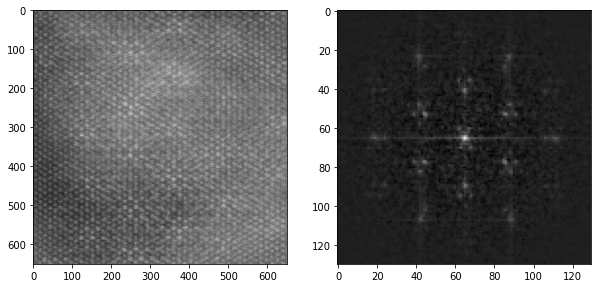

In [ ]:
movie = 0
f = 45

zoom = 5
power = 5
blur = 0.5

img = Movies_forFFT[movie][f]
fft = take_FFT(img, zoom = zoom, 
               power = power,
               center_remove = 0,
               blur = blur,
               blur_subtract = 5,
               hamming = True)

fig,ax = plt.subplots(1,2,figsize=(10,5))
ax[0].imshow(Movies_forFFT[movie][f], cmap = 'gray')
ax[1].imshow(fft**2, cmap = 'gray')

# Time dynamics:

In [ ]:
cd '/content'

/content


In [ ]:
!mkdir TimeDynamics

In [ ]:
cd 'TimeDynamics'

/content/Movies


In [ ]:
!wget https://www.dropbox.com/s/028r9kcp1cohapp/Movie_set5.zip
!unzip Movie_set5.zip
!rm Movie_set5.zip

--2021-08-17 04:03:00--  https://www.dropbox.com/s/028r9kcp1cohapp/Movie_set5.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6027:18::a27d:4812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/028r9kcp1cohapp/Movie_set5.zip [following]
--2021-08-17 04:03:00--  https://www.dropbox.com/s/raw/028r9kcp1cohapp/Movie_set5.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucca5957afe61b17a16d2be736b5.dl.dropboxusercontent.com/cd/0/inline/BUb3XkPSGmtv-caHm9Nb-Sg_nMihy3PHpv-xkEaUo3dtX6ofiLydcIbLb_221SR_xNOMKIfbeIzvq2b1E7aZ-ZRHenMPpn_xbYfHJgzxJhxwudabnIB0vZe_shPBaIcRAsLH_hh1dhXQ1a5w6Khotf-a/file# [following]
--2021-08-17 04:03:01--  https://ucca5957afe61b17a16d2be736b5.dl.dropboxusercontent.com/cd/0/inline/BUb3XkPSGmtv-caHm9Nb-Sg_nMihy3PHpv-xkEaUo3dtX6ofiLydcIbLb_221SR_xNOMKIfbeIzvq2b1E

In [ ]:
# collect HAADF movies

Movie_files = sorted(glob.glob('Mov*.npy'))

In [ ]:
# Place movies into lists

Movie_, Movie_fov = [], []
for k in Movie_files:
  mov,fov = LoadMovie(k)
  Movie_.append(mov), Movie_fov.append(fov)

len(Movie_)

2

In [ ]:
# Reorganize movie frames so they go in correct chronological order; also normalize them
# (Swift outputs them in reverse for some reason)

In [ ]:
Movies = []
for kk in range(len(Movie_)):
  Mov_ = np.flip(np.flip(Movie_[kk],axis=(0,1,2)), axis = (1,2))
  Mov = np.zeros_like(Mov_)
  for ii in range(len(Mov_)):
    Mov[ii] = normalize(Mov_[ii])

  Movies.append(Mov)

* Tweak the parameters: `zoom`, `power`, and `blur` in the next two cells to optimize image quality and peak finding

In [ ]:
movie = 0

zoom = 5
power = 10 # 15
blur = 1  # 1.2
blur_subtract = 5

fft_mov1 = np.zeros((len(Movies[movie]), 
                         int(Movies[movie][0].shape[0]/zoom), 
                         int(Movies[movie][0].shape[1]/zoom) ))
for frame in range(len(Movies[movie])):
  fft = take_FFT(Movies[movie][frame], zoom = zoom, power = power, blur = blur, hamming = True, center_remove=0, blur_subtract = blur_subtract)
  fft_mov1[frame] = fft

In [ ]:
kk = -1

fftimg = fft_mov1[kk]**3

# fft_blur = ApplyHamming(ndimage.gaussian_filter(fftimg, sigma = 5), fftimg.shape[0])
# fftimg_new = normalize((fftimg - fft_blur)**2) 

blobs = blob_log(fftimg, min_sigma = 0.45, max_sigma =1, threshold = 0.1)[:,:2]
blobs = remove_close_points(blobs, min_distance = 2)

fig, ax = plt.subplots(1,2,figsize=(15,7))
ax[0].imshow(fftimg, cmap = 'magma')
ax[1].imshow(fftimg, cmap = 'gray')
ax[1].scatter(blobs[:,1], blobs[:,0], color = 'r', s=3)
len(blobs)

* Get rid of points that are too close together: `kd_Tree`
* Basically adding a min_distance term to the blob_log method
* Adjust contrast on final images

In [ ]:
kk = -1

min_distance = 2
fftimg = normalize(fft_mov1[kk]**3)   ## don't forget this ADDITIONAL power term here (to the 3rd power right now) - can better help to visualize/find peaks

blobs = blob_log(fftimg, min_sigma = 0.4, max_sigma = 1, threshold = 0.09)[:,:2]
blobs = remove_close_points(blobs, min_distance = min_distance)  # contains the kd_tree search

fig, ax = plt.subplots(1,2,figsize=(15,7))
ax[0].imshow(fftimg, cmap = 'magma', vmax = 0.5)
ax[1].imshow(fftimg, cmap = 'gray', vmax = 0.5)
ax[1].scatter(blobs[:,1], blobs[:,0], color = 'r', s=20)

len(blobs)

ax[0].axis('off')
ax[1].axis('off')

* Repeat for all frames
* There are some frames that have WACKY FFTs, so skip them (eh, just include for now, its obvious which are outliers)


In [ ]:
fft_mov1_new = np.empty((0,fft_mov1.shape[1], fft_mov1.shape[2]))
fourier_peaks_1 = {}

for frame in range(len(fft_mov1)):
  fftimg = normalize(fft_mov1[frame]**3)  # Raise to power from 1-4 or so, to get best contrast.
  blobs = blob_log(fftimg, min_sigma = 0.4, max_sigma = 1, threshold = 0.09)[:,:2]  # Tweak the parameters to find blobs
  blobs = remove_close_points(blobs, min_distance = min_distance)  # contains the kd_tree search

  # cap it at half contrast for better VIEWING only
  fftimg[np.where(fftimg>0.5)] = 0.5
  fftimg = normalize(fftimg)

  fft_mov1_new = np.append(fft_mov1_new, [fftimg], axis = 0)
  fourier_peaks_1['{}'.format(frame)] = blobs

In [ ]:
k = 49
fig,ax = plt.subplots(1,2,figsize=(12,6))
ax[0].imshow(fft_mov1_new[k], cmap = 'magma')
ax[1].imshow(fft_mov1_new[k], cmap = 'gray')
ax[0].scatter(fourier_peaks_1['{}'.format(k)][:,1], fourier_peaks_1['{}'.format(k)][:,0], marker = 's', color = 'r', s=75, facecolors= 'none',)

In [ ]:
fft_mov1_new_up = resize(fft_mov1_new, (fft_mov1_new.shape[0], int(fft_mov1_new.shape[1]*zoom),  int(fft_mov1_new.shape[2]*zoom)))
FFTMovie1_tracked_BW = np.concatenate((Movies[0], fft_mov1_new_up), axis=2)

In [ ]:
imageio.mimwrite("FFTMovie1_BW_01.mp4", FFTMovie1_tracked_BW, fps = 5.0)
Video("FFTMovie1_BW_01.mp4", embed = True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in true_divide


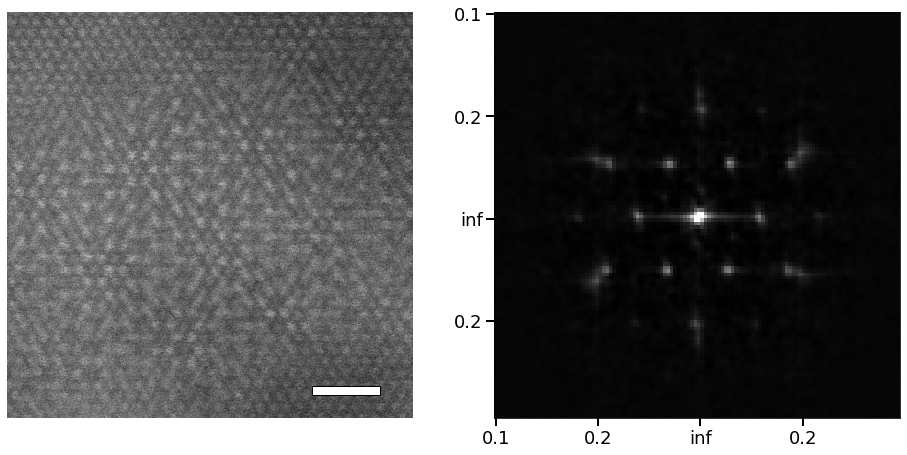

In [ ]:
kk = 49


img, scale = Movies[movie][kk],  Movie_fov[movie]
fft01 = take_FFT(img, 5, power = 2, blur = 0.75, blur_subtract = 10, center_remove = 0, hamming = True)
fig,ax = plt.subplots(1,2,figsize=(16,8))
freq_axis = np.fft.fftshift(np.fft.fftfreq(img.shape[0], scale))
ax[0].imshow(img, cmap = 'gray')
ax[1].imshow(normalize(fft01**3), cmap = 'gray', vmax = 0.4)
# ax[1].imshow(normalize(fft01**3), extent = [-1/freq_axis[0], 1/freq_axis[-1], -1/freq_axis[0], 1/freq_axis[-1]], cmap = 'gray', vmax = 0.4)
# ax[1].imshow(normalize(fft01**3), cmap = 'gray', vmax = 0.4)

xx,yy = img.shape[0], img.shape[1]
xfrac, yfrac = 0.75, 0.92
p1,p2 = xfrac*xx, yfrac*yy

scalebar = 1 # nm
length = scalebar/scale

ax[0].add_patch(patches.Rectangle((p1,p2), length, length/8, color = 'w', ec = 'k', lw = 1))


# All this is to get the correct AXIS for the FFT image.
freq_axis = np.fft.fftshift(np.fft.fftfreq(img.shape[0], scale))
fft_axis = np.abs(1/freq_axis)
delta = int((fft01.shape[0])/2)
fft_lim_L, fft_lim_H = int(fft_axis.shape[0]/2 - delta),  int(fft_axis.shape[0]/2 + delta)
fft_axis_scaled = fft_axis[fft_lim_L:fft_lim_H]

sizes = fft01.shape[0]
five_ticks = int(sizes/4)

ticks = np.linspace(0,sizes,int(sizes))
ticks = ticks[::five_ticks]
labels_ = fft_axis_scaled[::five_ticks]
if len(labels_) != 5:
  labels_ = np.append(labels_, fft_axis_scaled[-1])
labels = np.round(labels_, 2)
labels[int(len(labels)/2)] = np.inf

ax[1].set_xticks(ticks)
ax[1].set_yticks(ticks)
ax[1].set_xticklabels(labels);
ax[1].set_yticklabels(labels);
ax[1].tick_params(labelsize = 18, length = 8, width = 2)

ax[0].axis('off');

### Peak positions/intensities in time

* Get the positions relative to **center of image**:

In [ ]:
from copy import deepcopy

In [ ]:
Fourier_peak_data1 = deepcopy(fourier_peaks_1)

scale =  Movie_fov[movie]
orig_img = Movies[movie][0]

center = [fft_mov1_new[0].shape[0]/2, fft_mov1_new[1].shape[0]/2] 
for k in range(len(fourier_peaks_1)):
  pts = fourier_peaks_1['{}'.format(k)]
  tree = cKDTree(pts)
  que = tree.query(center, len(pts))
  que = que[0][que[1].argsort()]
  fft_array = []
  for m in range(len(pts)):
    intensity = fft_mov1_new[k][int(pts[m][0]), int(pts[m][1])]
    distance_pix = que[m]  ## NEED TO CONVERT FROM PIXELS TO REAL SPACE (nm) UNITS
    distance = convert_fftpixel(orig_img, scale, distance_pix)
    fft_array.append([pts[m][0], pts[m][1], distance, intensity])
  fft_array = np.asarray(fft_array)
  Fourier_peak_data1['{}'.format(k)] = fft_array

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


In [ ]:
Fourier_peak_data1['0']

array([[96.        , 60.        ,  0.16666667,  0.38341723],
       [91.        , 60.        ,  0.19354839,  0.22535783],
       [79.        , 29.        ,  0.16666667,  0.42717574],
       [77.        , 91.        ,  0.17142857,  0.46713105],
       [77.        , 50.        ,  0.31578947,  0.20007645],
       [60.        , 60.        ,         inf,  1.        ],
       [43.        , 70.        ,  0.31578947,  0.20144019],
       [43.        , 29.        ,  0.17142857,  0.49679705],
       [41.        , 91.        ,  0.16666667,  0.41941224],
       [29.        , 60.        ,  0.19354839,  0.23299631],
       [24.        , 60.        ,  0.16666667,  0.4025324 ]])

* collected all peak positions and distances from center
* each array is N X 4:
  * (x, y, d, i)
  * x,y coords, distance to center, intensity

[1.5, 0.34, 0.18]


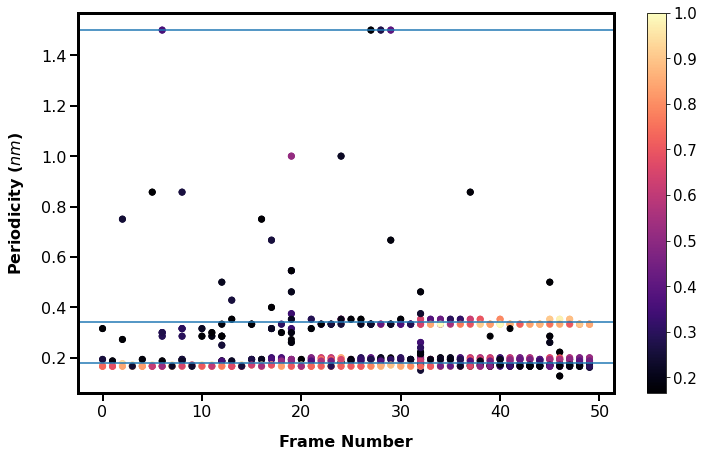

In [ ]:
plt.figure(figsize=(12,7))
ax = plt.gca()

for k in range(len(Fourier_peak_data1)):
  peaks = Fourier_peak_data1['{}'.format(k)]
  frame = np.zeros((len(peaks)))
  frame.fill(k)
  im1 = ax.scatter(frame, peaks[:,2], c = peaks[:,3], cmap = 'magma')

cbar = plt.colorbar(im1, ax=ax)
cbar.ax.tick_params(labelsize = 15)

ax.set_xlabel("Frame Number", fontsize = 16, labelpad = 15, weight = 'bold')
ax.set_ylabel("Periodicity ($nm$)", fontsize = 16, labelpad = 15, weight = 'bold')
ax.tick_params(labelsize = 16, length = 8, width = 2)

# leg=ax.legend(fontsize = 12)
# for line in leg.get_lines():
#   line.set_linewidth(10)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

# ax.set_ylim(0,2.5)
Periods = [1.5, 0.34, 0.18]
for P in Periods:
  ax.axhline(P)
print(Periods)

In [ ]:
plt.figure(figsize=(12,7))
ax = plt.gca()

for k in range(len(Fourier_peak_data1)):
  peaks = Fourier_peak_data1['{}'.format(k)]
  frame = np.zeros((len(peaks)))
  frame.fill(k)
  im1 = ax.scatter(frame, peaks[:,2], c = peaks[:,3], cmap = 'magma')

cbar = plt.colorbar(im1, ax=ax)
cbar.ax.tick_params(labelsize = 15)

ax.set_xlabel("Frame Number", fontsize = 16, labelpad = 15, weight = 'bold')
ax.set_ylabel("Periodicity ($nm$)", fontsize = 16, labelpad = 15, weight = 'bold')
ax.tick_params(labelsize = 16, length = 8, width = 2)

# leg=ax.legend(fontsize = 12)
# for line in leg.get_lines():
#   line.set_linewidth(10)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

ax.set_ylim(0.1,0.4)
Periods = [0.3525, 0.3325, 0.194, 0.167]
for P in Periods:
  ax.axhline(P)
print(Periods)

In [ ]:
movie = 1

zoom = 3.2
power = 5 # 15
blur = 3  # 1.2
blur_subtract = 5

fft_mov2 = np.zeros((len(Movies[movie]), 
                         int(Movies[movie][0].shape[0]/zoom), 
                         int(Movies[movie][0].shape[1]/zoom) ))
for frame in range(len(Movies[movie])):
  fft = take_FFT(Movies[movie][frame], zoom = zoom, power = power, blur = blur, hamming = True, center_remove=0, blur_subtract = blur_subtract)
  fft_mov2[frame] = fft

* Get rid of points that are too close together: `kd_Tree`
* Basically adding a min_distance term to the blob_log method

In [ ]:
kk = 25

min_distance = 3
fftimg = normalize(fft_mov2[kk]**2)   ## don't forget this ADDITIONAL power term here (to the 3rd power right now) - can better help to visualize/find peaks

blobs = blob_log(fftimg, min_sigma = 0.5, max_sigma = 1, threshold = 0.06)[:,:2]
blobs = remove_close_points(blobs, min_distance = min_distance)  # contains the kd_tree search

fig, ax = plt.subplots(1,2,figsize=(15,7))
ax[0].imshow(fftimg, cmap = 'magma', vmax = 0.4)
ax[1].imshow(fftimg, cmap = 'gray', vmax = 0.4)
ax[1].scatter(blobs[:,1], blobs[:,0], color = 'r', s=20)

ax[0].axis('off')
ax[1].axis('off')

len(blobs)

* Repeat for all frames
* There are some frames that have WACKY FFTs, so skip them (eh, just include for now, its obvious which are outliers)


In [ ]:
# fft_mov2_new = np.empty((0,fft_mov2.shape[1], fft_mov2.shape[2]))
# fourier_peaks_2 = {}

# for frame in range(len(fft_mov0)):
#   fftimg = normalize(fft_mov2[frame]**3)  # Raise to power from 1-4 or so, to get best contrast.
#   blobs = blob_log(fftimg, min_sigma = 0.5, max_sigma = 1, threshold = 0.06)[:,:2]  # Tweak the parameters to find blobs
#   blobs = remove_close_points(blobs, min_distance = min_distance)  # contains the kd_tree search

#   # cap it at half contrast for better VIEWING only
#   fftimg[np.where(fftimg>0.5)] = 0.5
#   fftimg = normalize(fftimg)

#   fft_mov2_new = np.append(fft_mov2_new, [fftimg], axis = 0)
#   fourier_peaks_2['{}'.format(frame)] = blobs

/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:125: RuntimeWarning: invalid value encountered in double_scalars
  r1 = blob1[-1] / blob2[-1]
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:126: RuntimeWarning: divide by zero encountered in true_divide
  pos1 = blob1[:ndim] / (max_sigma * root_ndim)
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:127: RuntimeWarning: divide by zero encountered in true_divide
  pos2 = blob2[:ndim] / (max_sigma * root_ndim)
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:129: RuntimeWarning: invalid value encountered in subtract
  d = np.sqrt(np.sum((pos2 - pos1)**2))


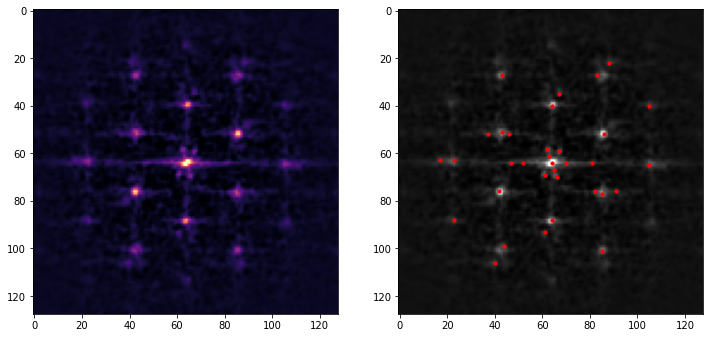

In [ ]:
# k = 45
# fig,ax = plt.subplots(1,2,figsize=(12,6))
# ax[0].imshow(fft_mov2_new[k], cmap = 'magma')
# ax[1].imshow(fft_mov2_new[k], cmap = 'gray')
# ax[1].scatter(fourier_peaks_2['{}'.format(k)][:,1], fourier_peaks_2['{}'.format(k)][:,0], color = 'r', s=10)

In [ ]:
# fft_mov2_new_up = resize(fft_mov2_new, (fft_mov2_new.shape[0], int(fft_mov2_new.shape[1]*zoom),  int(fft_mov2_new.shape[2]*zoom)))
# FFTMovie2_tracked_BW = np.concatenate((Movies_forFFT[1], fft_mov2_new_up), axis=2)

In [ ]:
# imageio.mimwrite("FFTMovie2_BW_01.mp4", FFTMovie2_tracked_BW, fps = 5.0)
# Video("FFTMovie2_BW_01.mp4", embed = True)

## Mesoscopic ordering

In [ ]:
!mkdir Movies1
!mkdir Movies2
!mkdir Movies3

In [ ]:
cd "Movies1"

/content/Movies1


In [ ]:
%%capture
!wget https://www.dropbox.com/s/ajbu6gtpf3fp4v9/Movies1.zip
!unzip Movies1.zip

In [ ]:
# collect HAADF movies

Movie_files = sorted(glob.glob('Mov*.npy'))

# Place movies into lists

Movie_, Movie_fov = [], []
for k in Movie_files:
  mov,fov = LoadMovie(k)
  Movie_.append(mov), Movie_fov.append(fov)

len(Movie_)

In [ ]:
# Reorganize movie frames so they go in correct chronological order; also normalize them
# (Swift outputs them in reverse for some reason)

In [ ]:
Movies = []
for kk in range(len(Movie_)):
  Mov_ = np.flip(np.flip(Movie_[kk],axis=(0,1,2)), axis = (1,2))
  Mov = np.zeros_like(Mov_)
  for ii in range(len(Mov_)):
    Mov[ii] = normalize(Mov_[ii])

  Movies.append(Mov)

# Combine movies (if some were taken back-to-back, which a few were)

Movie_R2 = np.concatenate((Movies[1], Movies[2],Movies[3], Movies[4], Movies[5]), axis = 0)

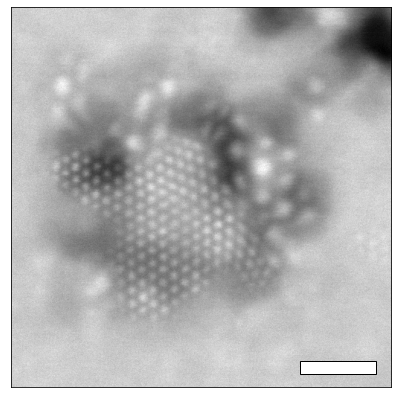

In [ ]:
m = 0


scalebar = 10 # nm

im, scale = Movies[m][0], Movie_fov[m]

fig,ax = plt.subplots(1,figsize=(7,7))

ax.imshow(im, cmap = 'gray')
plt.setp(ax, xticks=[], yticks =[]);

length = scalebar/scale  
height = length/6 
origin = 0.76*im.shape[0], 0.93*im.shape[1]

ax.add_patch(patches.Rectangle(origin, length, height, color = 'w', ec = 'k', lw = 1))

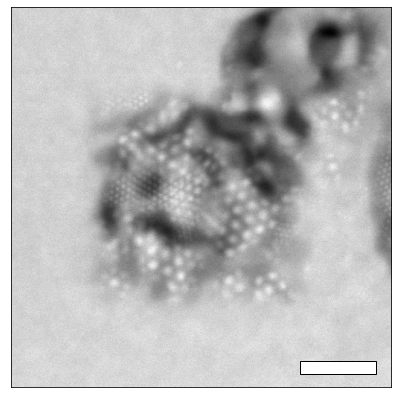

In [ ]:
m = 1


scalebar = 20 # nm

im, scale = Movies[m][0], Movie_fov[m]

fig,ax = plt.subplots(1,figsize=(7,7))

ax.imshow(im, cmap = 'gray')
plt.setp(ax, xticks=[], yticks =[]);

length = scalebar/scale  
height = length/6 
origin = 0.76*im.shape[0], 0.93*im.shape[1]

ax.add_patch(patches.Rectangle(origin, length, height, color = 'w', ec = 'k', lw = 1))

In [ ]:
imageio.mimwrite('Mov01.mp4', Movies[0] , fps = 6.0)

In [ ]:
imageio.mimwrite('Mov02.mp4', Movie_R2 , fps = 10.0)

In [ ]:
Video('Mov01.mp4', embed = True)

In [ ]:
Video('Mov02.mp4', embed = True)

In [ ]:
print(Movie_R2.shape)
print(Movies[0].shape)

(250, 512, 512)
(99, 512, 512)


In [ ]:
fig = plt.figure(figsize=(20,8))
gs = gridspec.GridSpec(2,5,wspace = 0.02, hspace = 0.05)
ax00,ax01,ax02,ax03,ax04 = plt.subplot(gs[0,0]),plt.subplot(gs[0,1]),plt.subplot(gs[0,2]),plt.subplot(gs[0,3]),plt.subplot(gs[0,4])
ax10,ax11,ax12,ax13,ax14 = plt.subplot(gs[1,0]),plt.subplot(gs[1,1]),plt.subplot(gs[1,2]),plt.subplot(gs[1,3]),plt.subplot(gs[1,4])

ax00.imshow(Movie_R2[0], cmap = 'gray')
ax01.imshow(Movie_R2[25], cmap = 'gray')
ax02.imshow(Movie_R2[50], cmap = 'gray')
ax03.imshow(Movie_R2[75], cmap = 'gray')
ax04.imshow(Movie_R2[100], cmap = 'gray')

ax10.imshow(Movie_R2[125], cmap = 'gray')
ax11.imshow(Movie_R2[150], cmap = 'gray')
ax12.imshow(Movie_R2[175], cmap = 'gray')
ax13.imshow(Movie_R2[200], cmap = 'gray')
ax14.imshow(Movie_R2[249], cmap = 'gray')

axes = [ax00,ax01,ax02,ax03,ax04,ax10,ax11,ax12,ax13,ax14]
plt.setp(axes,xticks=[],yticks=[]);

In [ ]:
crop_to = 300

fig = plt.figure(figsize=(20,8))
gs = gridspec.GridSpec(2,5,wspace = 0.02, hspace = 0.05)
ax00,ax01,ax02,ax03,ax04 = plt.subplot(gs[0,0]),plt.subplot(gs[0,1]),plt.subplot(gs[0,2]),plt.subplot(gs[0,3]),plt.subplot(gs[0,4])
ax10,ax11,ax12,ax13,ax14 = plt.subplot(gs[1,0]),plt.subplot(gs[1,1]),plt.subplot(gs[1,2]),plt.subplot(gs[1,3]),plt.subplot(gs[1,4])

c1,c2 = Movie_R2[0].shape[0]/2, Movie_R2[0].shape[1]/2

ax00.imshow(Movie_R2[0][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax01.imshow(Movie_R2[25][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax02.imshow(Movie_R2[50][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax03.imshow(Movie_R2[75][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax04.imshow(Movie_R2[100][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')

ax10.imshow(Movie_R2[125][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax11.imshow(Movie_R2[150][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax12.imshow(Movie_R2[175][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax13.imshow(Movie_R2[200][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax14.imshow(Movie_R2[249][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')

axes = [ax00,ax01,ax02,ax03,ax04,ax10,ax11,ax12,ax13,ax14]
plt.setp(axes,xticks=[],yticks=[]);

In [ ]:
fig = plt.figure(figsize=(20,8))
gs = gridspec.GridSpec(2,5,wspace = 0.02, hspace = 0.05)
ax00,ax01,ax02,ax03,ax04 = plt.subplot(gs[0,0]),plt.subplot(gs[0,1]),plt.subplot(gs[0,2]),plt.subplot(gs[0,3]),plt.subplot(gs[0,4])
ax10,ax11,ax12,ax13,ax14 = plt.subplot(gs[1,0]),plt.subplot(gs[1,1]),plt.subplot(gs[1,2]),plt.subplot(gs[1,3]),plt.subplot(gs[1,4])

ax00.imshow(Movies[0][0], cmap = 'gray')
ax01.imshow(Movies[0][11], cmap = 'gray')
ax02.imshow(Movies[0][22], cmap = 'gray')
ax03.imshow(Movies[0][33], cmap = 'gray')
ax04.imshow(Movies[0][44], cmap = 'gray')

ax10.imshow(Movies[0][55], cmap = 'gray')
ax11.imshow(Movies[0][66], cmap = 'gray')
ax12.imshow(Movies[0][77], cmap = 'gray')
ax13.imshow(Movies[0][88], cmap = 'gray')
ax14.imshow(Movies[0][98], cmap = 'gray')

axes = [ax00,ax01,ax02,ax03,ax04,ax10,ax11,ax12,ax13,ax14]
plt.setp(axes,xticks=[],yticks=[]);

* Combine both Movies: top row one movie, bottom row other movie

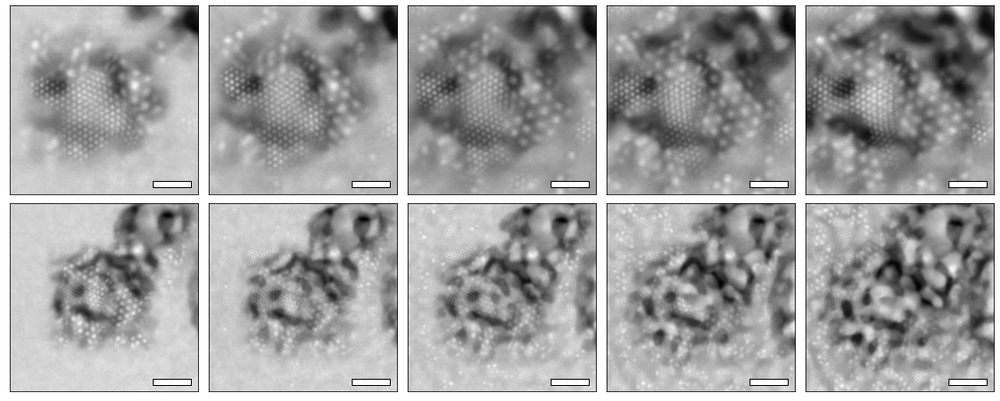

In [ ]:
fig = plt.figure(figsize=(20,8))
gs = gridspec.GridSpec(2,5,wspace = 0.02, hspace = 0.05)
ax00,ax01,ax02,ax03,ax04 = plt.subplot(gs[0,0]),plt.subplot(gs[0,1]),plt.subplot(gs[0,2]),plt.subplot(gs[0,3]),plt.subplot(gs[0,4])
ax10,ax11,ax12,ax13,ax14 = plt.subplot(gs[1,0]),plt.subplot(gs[1,1]),plt.subplot(gs[1,2]),plt.subplot(gs[1,3]),plt.subplot(gs[1,4])

ax00.imshow(Movies[0][0], cmap = 'gray')
ax01.imshow(Movies[0][25], cmap = 'gray')
ax02.imshow(Movies[0][50], cmap = 'gray')
ax03.imshow(Movies[0][75], cmap = 'gray')
ax04.imshow(Movies[0][98], cmap = 'gray')
crop_to = 512
ax10.imshow(Movie_R2[0][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax11.imshow(Movie_R2[60][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax12.imshow(Movie_R2[120][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax13.imshow(Movie_R2[180][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')
ax14.imshow(Movie_R2[249][int(c1-crop_to/2):int(c1+crop_to/2), int(c2-crop_to/2):int(c2+crop_to/2)], cmap = 'gray')

im, scale = Movies[0][0], Movie_fov[0]
scalebar1 =10
length1 = scalebar1/scale  
height1 = length1/6 
origin1 = 0.76*im.shape[0], 0.93*im.shape[1]

im, scale = Movies[1][0], Movie_fov[1]
scalebar2 = 20
length2 = scalebar2/scale  
height2 = length2/6 
origin2 = 0.76*im.shape[0], 0.93*im.shape[1]



axes_top, axes_bot = [ax00,ax01,ax02,ax03,ax04], [ax10,ax11,ax12,ax13,ax14]
for ax in axes_top:
  ax.add_patch(patches.Rectangle(origin1, length1, height1, color = 'w', ec = 'k', lw = 1))
for ax in axes_bot:
  ax.add_patch(patches.Rectangle(origin2, length2, height2, color = 'w', ec = 'k', lw = 1)) 
plt.setp([axes_top, axes_bot],xticks=[],yticks=[]);

### Tracking

In [ ]:
## run blob finder:

In [ ]:
from skimage.feature import blob_log

In [ ]:
kk = 0
image = Movies[0][kk]

# filtered = ndimage.filters.median_filter(image, size = (5,5))

plt.figure(figsize=(8,8))
plt.imshow(image, cmap = 'gray')

(21, 3)

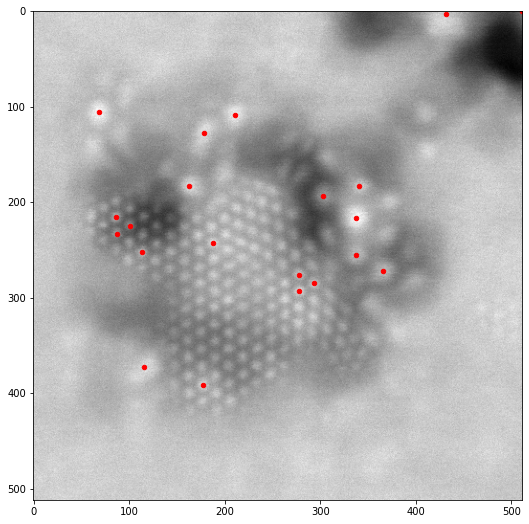

In [ ]:
kk = 0
image = Movies[0][kk]

testblob = blob_log(image, max_sigma = 15, threshold = 0.1)

plt.figure(figsize=(9,9))
plt.imshow(image, cmap = 'gray')
plt.scatter(testblob[:,1], testblob[:,0] , c='r', s=20)
testblob.shape

* Blob detection doesn't work well here because the contrast is too bright where there are no blobs.
* We need to "filter" the image:

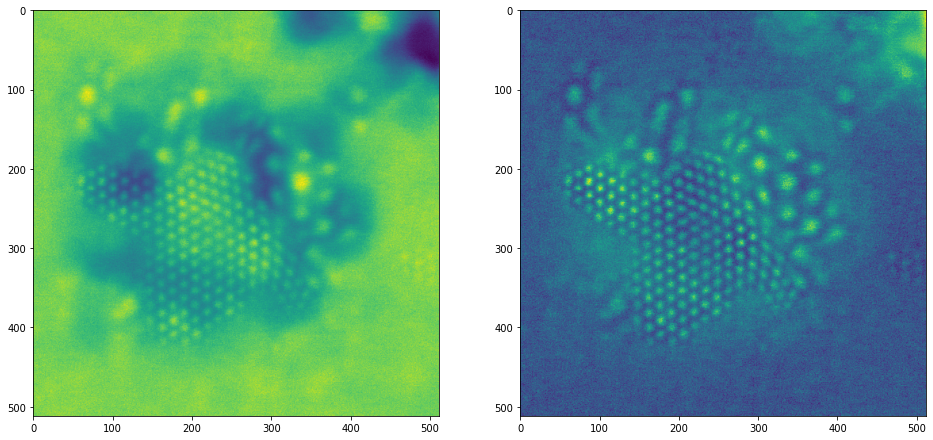

In [ ]:
blurred = normalize(ndimage.gaussian_filter(image, sigma = 10))
filtered = normalize(image-blurred)

fig,ax=plt.subplots(1,2,figsize=(16,8))
ax[0].imshow(image)
ax[1].imshow(filtered)

(215, 3)

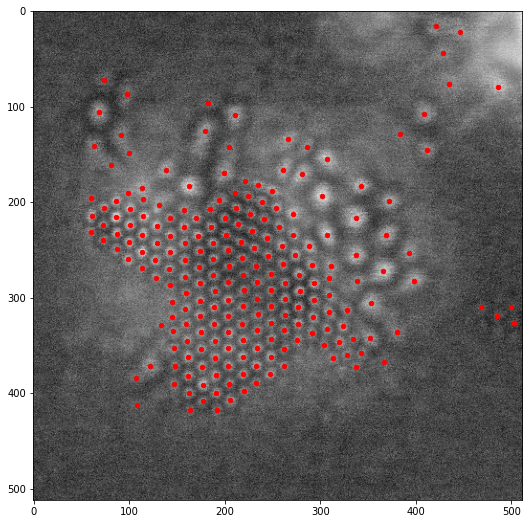

In [ ]:
testblob = blob_log(filtered, min_sigma = 1, max_sigma = 20, threshold = 0.05, exclude_border = True)
# testblob

plt.figure(figsize=(9,9))
plt.imshow(filtered, cmap = 'gray')
plt.scatter(testblob[:,1], testblob[:,0] , c='r', s=20)
testblob.shape

In [ ]:
# And for movie #2:

In [ ]:
kk = 0
image = Movie_R2[kk]

blurred = normalize(ndimage.gaussian_filter(image, sigma = 10))
filtered = normalize(image-blurred)

fig,ax=plt.subplots(1,2,figsize=(16,8))
ax[0].imshow(image)
ax[1].imshow(filtered)

In [ ]:
testblob = blob_log(filtered, min_sigma = 1, max_sigma = 5, threshold = 0.05, exclude_border = True)
# testblob

plt.figure(figsize=(9,9))
plt.imshow(filtered, cmap = 'gray')
plt.scatter(testblob[:,1], testblob[:,0] , c='r', s=20)
testblob.shape

* optimize parameters on the first frame, then go from there.

In [ ]:
Filtered_Movie1 = np.copy(Movies[0])
for k in range(len(Filtered_Movie1)):
  image = Filtered_Movie1[k]
  blurred = normalize(ndimage.gaussian_filter(image, sigma = 10))
  filtered = normalize(image-blurred)
  Filtered_Movie1[k] = filtered

Filtered_Movie2 = np.copy(Movie_R2)
for k in range(len(Filtered_Movie2)):
  image = Filtered_Movie2[k]
  blurred = normalize(ndimage.gaussian_filter(image, sigma = 10))
  filtered = normalize(image-blurred)
  Filtered_Movie2[k] = filtered

In [ ]:
Blobs_dict1 = {}
for k in range(len(Filtered_Movie1)):
  blobs = blob_log(Filtered_Movie1[k], min_sigma = 1, max_sigma = 20, threshold = 0.05, exclude_border = True)
  Blobs_dict1['{}'.format(k)]=blobs

/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:125: RuntimeWarning: invalid value encountered in double_scalars
  r1 = blob1[-1] / blob2[-1]
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:126: RuntimeWarning: divide by zero encountered in true_divide
  pos1 = blob1[:ndim] / (max_sigma * root_ndim)
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:127: RuntimeWarning: divide by zero encountered in true_divide
  pos2 = blob2[:ndim] / (max_sigma * root_ndim)
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:129: RuntimeWarning: invalid value encountered in subtract
  d = np.sqrt(np.sum((pos2 - pos1)**2))


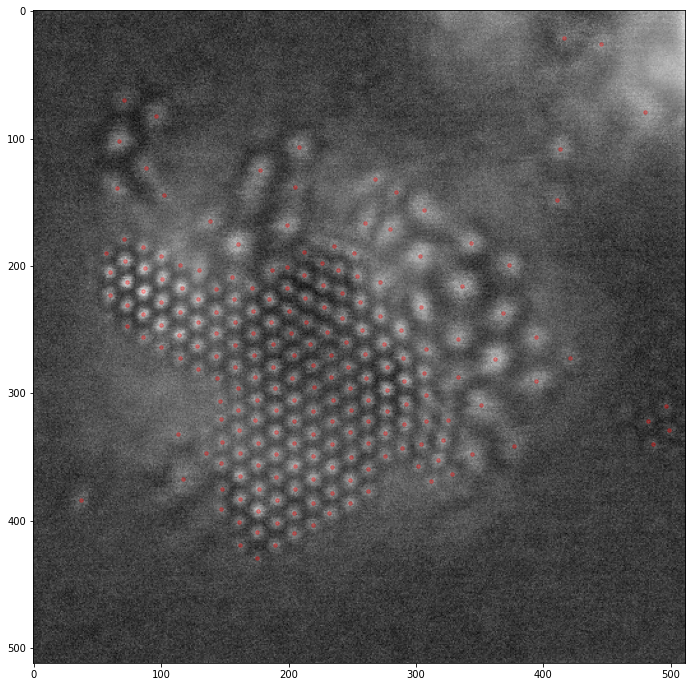

In [ ]:
kk = 5
# Stack = Movies[0]
Stack = Filtered_Movie1
plt.figure(figsize=(12,12))
plt.imshow(Stack[kk],cmap = 'gray')
plt.scatter(Blobs_dict1['{}'.format(kk)][:,1], 
            Blobs_dict1['{}'.format(kk)][:,0], c='r', marker='.',s=50, alpha = 0.3)

/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:125: RuntimeWarning: invalid value encountered in double_scalars
  r1 = blob1[-1] / blob2[-1]
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:126: RuntimeWarning: divide by zero encountered in true_divide
  pos1 = blob1[:ndim] / (max_sigma * root_ndim)
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:127: RuntimeWarning: divide by zero encountered in true_divide
  pos2 = blob2[:ndim] / (max_sigma * root_ndim)
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:129: RuntimeWarning: invalid value encountered in subtract
  d = np.sqrt(np.sum((pos2 - pos1)**2))


(370, 3)

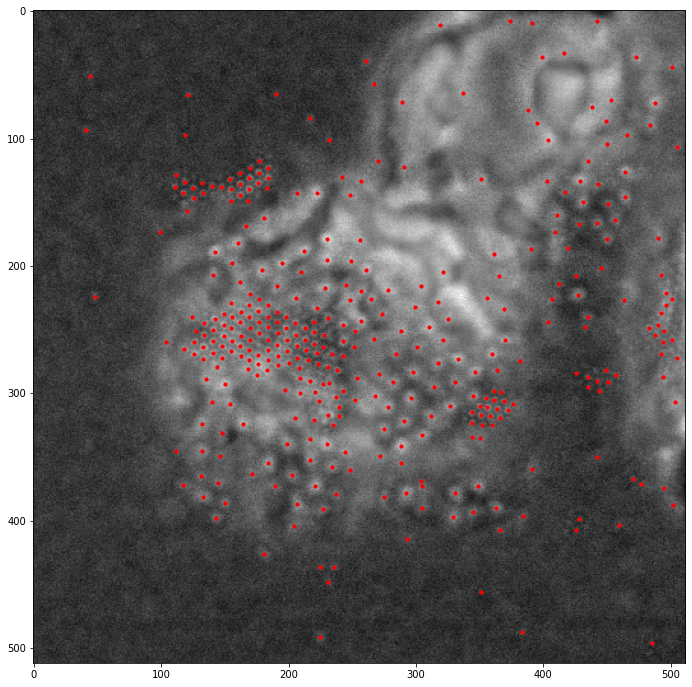

In [ ]:
kk = 40
image = Movie_R2[kk]

blurred = normalize(ndimage.gaussian_filter(image, sigma = 10))
filtered = normalize(image-blurred)

testblob = blob_log(filtered, min_sigma = 1, max_sigma = 6, threshold = 0.04, exclude_border = True)
# testblob

plt.figure(figsize=(12,12))
plt.imshow(filtered, cmap = 'gray')
plt.scatter(testblob[:,1], testblob[:,0] , c='r', s=10)
testblob.shape

In [ ]:
Blobs_dict2 = {}
for k in range(len(Filtered_Movie2)):
  blobs = blob_log(Filtered_Movie2[k], min_sigma = 1, max_sigma = 6, threshold = 0.04, exclude_border = True)
  Blobs_dict2['{}'.format(k)]=blobs

/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:125: RuntimeWarning: invalid value encountered in double_scalars
  r1 = blob1[-1] / blob2[-1]
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:126: RuntimeWarning: divide by zero encountered in true_divide
  pos1 = blob1[:ndim] / (max_sigma * root_ndim)
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:127: RuntimeWarning: divide by zero encountered in true_divide
  pos2 = blob2[:ndim] / (max_sigma * root_ndim)
/usr/local/lib/python3.7/dist-packages/skimage/feature/blob.py:129: RuntimeWarning: invalid value encountered in subtract
  d = np.sqrt(np.sum((pos2 - pos1)**2))


In [ ]:
kk = 49
# Stack = Movies[0]
Stack = Filtered_Movie2
plt.figure(figsize=(12,12))
plt.imshow(Stack[kk],cmap = 'gray')
plt.scatter(Blobs_dict2['{}'.format(kk)][:,1], 
            Blobs_dict2['{}'.format(kk)][:,0], c='r', marker='.',s=50, alpha = 0.3)

In [ ]:
kk = 0
# Stack = Movies[0]
Stack = Filtered_Movie1
plt.figure(figsize=(12,12))
plt.imshow(Stack[kk],cmap = 'gray')
plt.scatter(Blobs_dict1['{}'.format(kk)][:,1], Blobs_dict1['{}'.format(kk)][:,0], facecolors='none', edgecolors='r',  s=50)

In [ ]:
radius = 3

Movie1_blobs = np.zeros((Filtered_Movie1.shape[0], Filtered_Movie1.shape[1], Filtered_Movie1.shape[2], 3))
Movie1_blobs_only = np.zeros((Filtered_Movie1.shape[0], Filtered_Movie1.shape[1], Filtered_Movie1.shape[2]))

for ii in range(len(Filtered_Movie1)):
  for channel in range(3):
    Movie1_blobs[ii][:,:,channel] = Filtered_Movie1[ii]
  for bb in range(len(Blobs_dict1['{}'.format(ii)])):
    rr, cc = circle(int(Blobs_dict1['{}'.format(ii)][bb][0]), 
                    int(Blobs_dict1['{}'.format(ii)][bb][1]), 
                    radius)
    draw.set_color(Movie1_blobs[ii], (rr, cc), [1, 0, 0], alpha=0.3)
    draw.set_color(Movie1_blobs_only[ii], (rr, cc), 1)

In [ ]:
radius = 3

Movie2_blobs = np.zeros((Filtered_Movie2.shape[0], Filtered_Movie2.shape[1], Filtered_Movie2.shape[2], 3))
Movie2_blobs_only = np.zeros((Filtered_Movie2.shape[0], Filtered_Movie2.shape[1], Filtered_Movie2.shape[2]))

for ii in range(len(Filtered_Movie2)):
  for channel in range(3):
    Movie2_blobs[ii][:,:,channel] = Filtered_Movie2[ii]
  for bb in range(len(Blobs_dict2['{}'.format(ii)])):
    rr, cc = circle(int(Blobs_dict2['{}'.format(ii)][bb][0]), 
                    int(Blobs_dict2['{}'.format(ii)][bb][1]), 
                    radius)
    draw.set_color(Movie2_blobs[ii], (rr, cc), [1, 0, 0], alpha=0.3)
    draw.set_color(Movie2_blobs_only[ii], (rr, cc), 1)

In [ ]:
imageio.mimwrite('Mov1_blobs.mp4', Movie1_blobs , fps = 6.0)
imageio.mimwrite('Mov2_blobs.mp4', Movie2_blobs , fps = 10.0)

In [ ]:
Video('Mov1_blobs.mp4', embed = True)

In [ ]:
Video('Mov2_blobs.mp4', embed = True)

In [ ]:
imageio.mimwrite('Mov1_blobs_only.mp4', Movie1_blobs_only , fps = 6.0)
imageio.mimwrite('Mov2_blobs_only.mp4', Movie2_blobs_only , fps = 10.0)

In [ ]:
Video('Mov1_blobs_only.mp4', embed = True)

In [ ]:
Video('Mov2_blobs_only.mp4', embed = True)

In [1]:
# separate blobs by sizes.

In [ ]:
k = 1
Blobs_dict1['{}'.format(k)][:,2].min(), Blobs_dict1['{}'.format(k)][:,2].max()

(3.111111111111111, 9.444444444444445)

In [ ]:
threshold = 4

Blobs1_a, Blobs1_b = {}, {}
for k in range(len(Blobs_dict1)):
  Blobarray_a = np.empty((0,2))
  Blobarray_b = np.empty((0,2))
  Blobarray_full = Blobs_dict1['{}'.format(k)]
  for blob in Blobarray_full:
    if blob[2] > threshold:
      Blobarray_a = np.append(Blobarray_a, blob[:2])
    else:
      Blobarray_b = np.append(Blobarray_b, blob[:2])
    Blobarray_a = Blobarray_a.reshape((-1,2))  
    Blobarray_b = Blobarray_b.reshape((-1,2)) 
    Blobs1_a['{}'.format(k)] = Blobarray_a
    Blobs1_b['{}'.format(k)] = Blobarray_b

In [ ]:
radius = 3

Movie1_blobs_2class = np.zeros((Filtered_Movie1.shape[0], Filtered_Movie1.shape[1], Filtered_Movie1.shape[2], 3))
Movie1_blobs_only_2class = np.zeros((Filtered_Movie1.shape[0], Filtered_Movie1.shape[1], Filtered_Movie1.shape[2] , 3))

for ii in range(len(Filtered_Movie1)):
  for channel in range(3):
    Movie1_blobs_2class[ii][:,:,channel] = Filtered_Movie1[ii]
  for bb in range(len(Blobs1_a['{}'.format(ii)])):
    rr, cc = circle(int(Blobs1_a['{}'.format(ii)][bb][0]), 
                    int(Blobs1_a['{}'.format(ii)][bb][1]), 
                    radius)
    draw.set_color(Movie1_blobs_2class[ii], (rr, cc), [1, 0, 0], alpha=0.3)
    draw.set_color(Movie1_blobs_only_2class[ii], (rr, cc), [1, 0, 0])
  for bb in range(len(Blobs1_b['{}'.format(ii)])):
    rr, cc = circle(int(Blobs1_b['{}'.format(ii)][bb][0]), 
                    int(Blobs1_b['{}'.format(ii)][bb][1]), 
                    radius)
    draw.set_color(Movie1_blobs_2class[ii], (rr, cc), [0, 0, 1], alpha=0.3)
    draw.set_color(Movie1_blobs_only_2class[ii], (rr, cc), [0, 0, 1])

In [ ]:
imageio.mimwrite('Mov1_blobs_2class.mp4', Movie1_blobs_2class , fps = 6.0)
Video('Mov1_blobs_2class.mp4', embed = True)

In [ ]:
threshold = 2

Blobs2_a, Blobs2_b = {}, {}
for k in range(len(Blobs_dict2)):
  Blobarray_a = np.empty((0,2))
  Blobarray_b = np.empty((0,2))
  Blobarray_full = Blobs_dict2['{}'.format(k)]
  for blob in Blobarray_full:
    if blob[2] > threshold:
      Blobarray_a = np.append(Blobarray_a, blob[:2])
    else:
      Blobarray_b = np.append(Blobarray_b, blob[:2])
    Blobarray_a = Blobarray_a.reshape((-1,2))
    Blobarray_b = Blobarray_b.reshape((-1,2)) 
    Blobs2_a['{}'.format(k)] = Blobarray_a
    Blobs2_b['{}'.format(k)] = Blobarray_b

In [ ]:
radius = 3

Movie2_blobs_2class = np.zeros((Filtered_Movie2.shape[0], Filtered_Movie2.shape[1], Filtered_Movie2.shape[2], 3))
Movie2_blobs_only_2class = np.zeros((Filtered_Movie2.shape[0], Filtered_Movie2.shape[1], Filtered_Movie2.shape[2] , 3))

for ii in range(len(Filtered_Movie2)):
  for channel in range(3):
    Movie2_blobs_2class[ii][:,:,channel] = Filtered_Movie2[ii]
  for bb in range(len(Blobs2_a['{}'.format(ii)])):
    rr, cc = circle(int(Blobs2_a['{}'.format(ii)][bb][0]), 
                    int(Blobs2_a['{}'.format(ii)][bb][1]), 
                    radius)
    draw.set_color(Movie2_blobs_2class[ii], (rr, cc), [1, 0, 0], alpha=0.3)
    draw.set_color(Movie2_blobs_only_2class[ii], (rr, cc), [1, 0, 0])
  for bb in range(len(Blobs2_b['{}'.format(ii)])):
    rr, cc = circle(int(Blobs2_b['{}'.format(ii)][bb][0]), 
                    int(Blobs2_b['{}'.format(ii)][bb][1]), 
                    radius)
    draw.set_color(Movie2_blobs_2class[ii], (rr, cc), [0, 0, 1], alpha=0.3)
    draw.set_color(Movie2_blobs_only_2class[ii], (rr, cc), [0, 0, 1])

In [ ]:
imageio.mimwrite('Mov2_blobs_2class.mp4', Movie2_blobs_2class , fps = 10.0)
Video('Mov2_blobs_2class.mp4', embed = True)

Movie 1

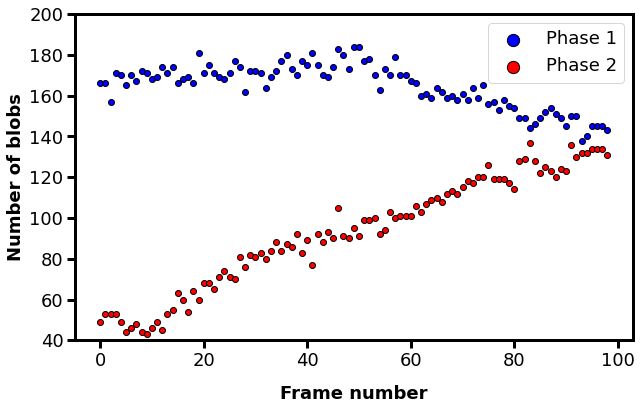

In [ ]:
plt.figure(figsize=(10,6))
ax = plt.gca()

ax.scatter(0, Num_blobs1_b[0], c='b', ec = 'k', label = 'Phase 1')
for b in range(1, len(Num_blobs1_b)):
  ax.scatter(b, Num_blobs1_b[b], c='b', ec = 'k')

ax.scatter(0, Num_blobs1_a[0], c='r', ec = 'k', label = 'Phase 2')
for a in range(1, len(Num_blobs1_a)):
  ax.scatter(a, Num_blobs1_a[a], c='r', ec = 'k')

leg = ax.legend(fontsize=18)
for line in leg.get_lines():
  line.set_linewidth(10)

ax.set_xlabel('Frame number', fontsize = 18, labelpad = 15, weight = 'bold')
ax.set_ylabel('Number of blobs', fontsize = 18, weight = 'bold')
ax.tick_params(labelsize = 18, length = 8, width = 3)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

for handle in leg.legendHandles:
    handle.set_sizes([150])

ax.set_ylim(40,200);

Movie 2

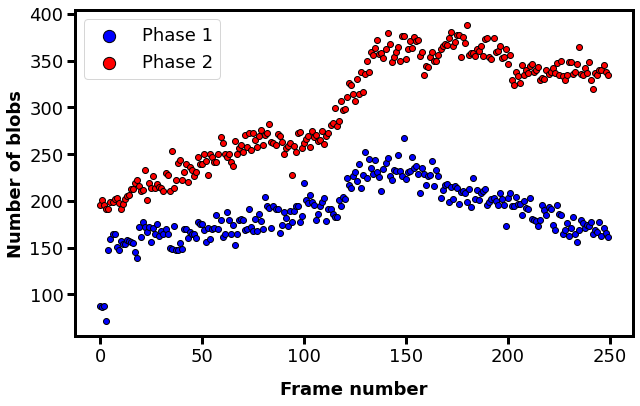

In [ ]:
plt.figure(figsize=(10,6))
ax = plt.gca()

ax.scatter(0, Num_blobs2_b[0], c='b', ec = 'k', label = 'Phase 1')
for b in range(1, len(Num_blobs2_b)):
  ax.scatter(b, Num_blobs2_b[b], c='b', ec = 'k')

ax.scatter(0, Num_blobs2_a[0], c='r', ec = 'k', label = 'Phase 2')
for a in range(1, len(Num_blobs2_a)):
  ax.scatter(a, Num_blobs2_a[a], c='r', ec = 'k')

leg = ax.legend(fontsize=18)
for line in leg.get_lines():
  line.set_linewidth(10)

ax.set_xlabel('Frame number', fontsize = 18, labelpad = 15, weight = 'bold')
ax.set_ylabel('Number of blobs', fontsize = 18, weight = 'bold')
ax.tick_params(labelsize = 18, length = 8, width = 3)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

for handle in leg.legendHandles:
    handle.set_sizes([150])

# ax.set_ylim(40,200);

# EELS mapping

In [ ]:
cd "/content"

/content


In [ ]:
!mkdir EELS

In [ ]:
cd "EELS"

/content/EELS


In [ ]:
%%capture
!wget https://www.dropbox.com/s/i4ln6tivf2u4jve/SI_set5.zip
!unzip SI_set5.zip
!rm SI_set5.zip

In [ ]:
!ls

SI_atomicres_01_HAADF.json  SI_niceedge3_HAADF.json
SI_atomicres_01_HAADF.npy   SI_niceedge3_HAADF.npy
SI_atomicres_01.json	    SI_niceedge3.json
SI_atomicres_01.npy	    SI_niceedge3.npy
SI_moire_01_HAADF.json	    SI_niceedge_coreloss_HAADF.json
SI_moire_01_HAADF.npy	    SI_niceedge_coreloss_HAADF.npy
SI_moire_01.json	    SI_niceedge_coreloss.json
SI_moire_01.npy		    SI_niceedge_coreloss.npy
SI_moire_02_HAADF.json	    SI_niceedge_HAADF.json
SI_moire_02_HAADF.npy	    SI_niceedge_HAADF.npy
SI_moire_02.json	    SI_niceedge.json
SI_moire_02.npy		    SI_niceedge.npy
SI_moire_03_HAADF.json	    SI_vibrational_01_image.json
SI_moire_03_HAADF.npy	    SI_vibrational_01_image.npy
SI_moire_03.json	    SI_vibrational_01.json
SI_moire_03.npy		    SI_vibrational_01.npy
SI_niceedge2_HAADF.json     SI_vibrational_02_image.json
SI_niceedge2_HAADF.npy	    SI_vibrational_02_image.npy
SI_niceedge2.json	    SI_vibrational_02.json
SI_niceedge2.npy	    SI_vibrational_02.npy


In [ ]:
SI_files = sorted(glob.glob('SI*.npy'))
Image_files1 = sorted(glob.glob('*image.npy'))
Image_files2 = sorted(glob.glob('*HAADF.npy'))
Image_files = sorted(Image_files1 + Image_files2)
print(Image_files)
for file in Image_files:
  SI_files.remove(file)
SI_files = sorted(SI_files)
print(SI_files)

['SI_atomicres_01_HAADF.npy', 'SI_moire_01_HAADF.npy', 'SI_moire_02_HAADF.npy', 'SI_moire_03_HAADF.npy', 'SI_niceedge2_HAADF.npy', 'SI_niceedge3_HAADF.npy', 'SI_niceedge_HAADF.npy', 'SI_niceedge_coreloss_HAADF.npy', 'SI_vibrational_01_image.npy', 'SI_vibrational_02_image.npy']
['SI_atomicres_01.npy', 'SI_moire_01.npy', 'SI_moire_02.npy', 'SI_moire_03.npy', 'SI_niceedge.npy', 'SI_niceedge2.npy', 'SI_niceedge3.npy', 'SI_niceedge_coreloss.npy', 'SI_vibrational_01.npy', 'SI_vibrational_02.npy']


In [ ]:
image,img_scales = [], []
for k in Image_files:
  image_,scale_ = LoadADF(k)
  image.append(image_), img_scales.append(scale_)

In [ ]:
## Check if SI has a ZLP or not (low loss or coreloss check --> could figure with the JSON file)\
# these three happen to all have a ZLP so we're ok!
# For now...

In [ ]:
num_spectral_px = 2000

E_list = []
SI_list = []
XY_list = []
SIflat_list = []

for ii in range(len(SI_files)):
  E, SI, XY, SIflat = organize_data(SI_files[ii], num_spectral_px, plot = False)
  E_list.append(E), SI_list.append(SI), XY_list.append(XY), SIflat_list.append(SIflat)
  
SI_files

['SI_atomicres_01.npy',
 'SI_moire_01.npy',
 'SI_moire_02.npy',
 'SI_moire_03.npy',
 'SI_niceedge.npy',
 'SI_niceedge2.npy',
 'SI_niceedge3.npy',
 'SI_niceedge_coreloss.npy',
 'SI_vibrational_01.npy',
 'SI_vibrational_02.npy']

In [ ]:
len(img_scales)

10

## Process the data

Survey the data

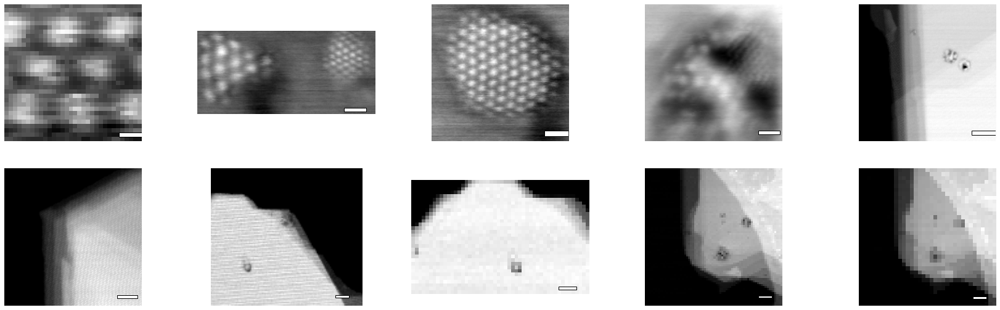

In [ ]:
scalebars = [0.1, 5, 5, 5, 50, 20, 20, 20, 50, 50] # nm
num_im = len(img_scales)

rows = int(np.ceil(float(num_im)/5))
cols = int(np.ceil(float(num_im)/rows))

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (6*cols, 3*(1+rows)))   
for kk in range(num_im):
    ax = fig.add_subplot(gs[kk])
    img,scale = image[kk], img_scales[kk]
    length = scalebars[kk]/scale  
    height = length/6 
    origin = 0.82*img.shape[1], 0.92*img.shape[0]
    ax.imshow(img, cmap = 'gray')
    ax.add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))
    ax.axis('off')

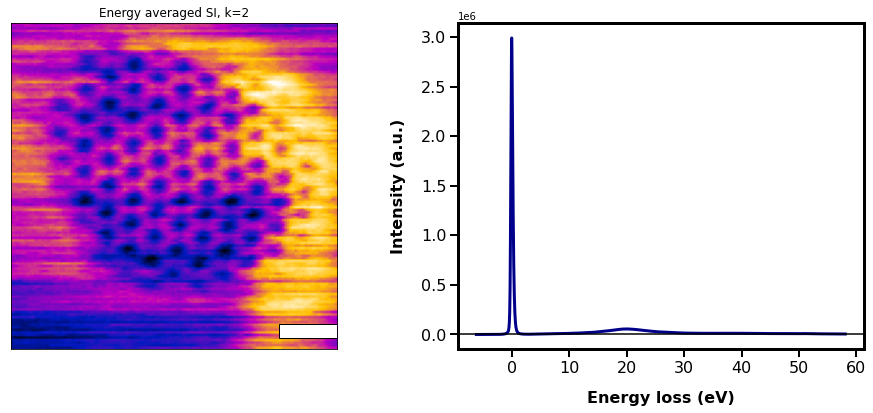

In [ ]:
k = 2

_,ax = plt.subplots(1,2,figsize=(16,6))

img, scale = image[k], img_scales[k]
length = scalebars[k]/scale  
height = length/6 
origin = 0.82*img.shape[1], 0.92*img.shape[0]

avgSI = np.mean(SI_list[k],axis=2)

ax[0].imshow(avgSI, cmap = Cmap_Blackbody)
ax[0].set_title("Energy averaged SI, k={}".format(k))
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))
plt.setp([ax[0]], xticks = [], yticks =[]);

avgSI_spec = np.mean(SI_list[k],axis=(0,1))
ax[1].plot(E_list[k], avgSI_spec, lw = 3, color = 'darkblue')

ax[1].set_xlabel("Energy loss (eV)", fontsize = 16, labelpad = 15, weight = 'bold')
ax[1].set_ylabel("Intensity (a.u.)", fontsize = 16, labelpad = 15, weight = 'bold')
ax[1].tick_params(labelsize = 16, length = 8, width = 2)

for axis in ['top','bottom','left','right']:
  ax[1].spines[axis].set_linewidth(3)

# ax[1].set_ylim(-500,5000)
ax[1].axhline(0,c='k')

In [ ]:
# 0-50 eV:          2,3,4,5,6
# 1 - 1200 eV:      0,7
# vibrational:      8,9

Remove any cosmic rays, if they were present

In [ ]:
kk = 9
gradSI=np.asarray(np.gradient(SI_list[kk],axis=(0,1)))


#If point blemishes detected add pixel coordinates here so that they are highlighted
#for removal. 

SI0_Rs = []
SI1_Rs = [] 
SI2_Rs = []


f,ax = plt.subplots(1,2,figsize=(15,7))
ax[0].imshow(np.amax(gradSI[1],axis=2))

# ax[1].plot(SI_list[kk][SI4_Rs[0][0], SI4_Rs[0][1]])
# ax[1].plot(SI_list[kk][SI4_Rs[0][1], SI4_Rs[0][0]]) # Reverse just to be sure..
# ax[1].set_ylim(-100,10000)
# for r in SI4_Rs: ax[0].add_patch(patches.Rectangle((r[1]-1-0.5,r[0]-0.5),1,1,fc='None',ec='r',lw=3)) # original?
# for r in SI1_Rs: ax[0].add_patch(patches.Rectangle((r[1]-0.5,r[0]-0.5),1,1,fc='None',ec='r',lw=3))


No cosmic rays, proceed to next step

All of these are LOW LOSS

In [ ]:
# 0-50 eV:          2,3,4,5,6
# 1 - 1200 eV:      0,7
# phonon:           8,9

In [ ]:
# test a random pixel or two in each spectrum image to check the fitting performance
ii = 8


count_threshold = 10000

#### 2,5,6
# r1a = 1.3
# r1b = 1.7
# r2a = 1.7
# r2b = 2.5

#### 3,
# r1a = 0.5
# r1b = 0.7
# r2a = 0.7
# r2b = 1.2

##### 4,
# r1a = 1.75
# r1b = 1.9
# r2a = 1.9
# r2b = 2.5

#### 8 WORK IN PROGRESS.....      < SKIPPING VIBRATIONAL ONES and 0,7 for now! (at least not fitting the 0,7)
r1a = 0.03
r1b = 0.035
r2a = 0.06
r2b = 0.07


# I,J = 115, 25
I,J=np.random.randint(SI_list[ii].shape[0]),np.random.randint(SI_list[ii].shape[1])
testE1,testS1=FitPowerlaw2R_THICK(E_list[ii],SI_list[ii][I,J],r1a,r1b,r2a,r2b, count_threshold)
I,J

In [ ]:
Vibrational_SI = [SI_list[8], SI_list[9]]
Vibrational_E = [E_list[8], E_list[9]]
Vibrational_Im = [image[8], image[9]]

SI_list2 = [SI_list[2], SI_list[5], SI_list[6], SI_list[3], SI_list[4]]
E_list2 = [E_list[2], E_list[5], E_list[6], E_list[3], E_list[4]]
image2 = [image[2], image[4], image[5], image[3], image[6]]

SI_core = [SI_list[0], SI_list[7]]
E_core = [E_list[0], E_list[7]]
image_core = [image[0], image[7]]

In [ ]:
SINB_list, ENB_list = [], []

count_threshold = 10000

r1a = 1.3
r1b = 1.7
r2a = 1.7
r2b = 2.5

for k in range(3):
  NBCalc=np.asarray([[RemoveBackgroundSI2R_THICK(E_list2[k],s,r1a,r1b,r2a,r2b, count_threshold) for s in row] for row in SI_list2[k]])
  SINB=NBCalc[:,:,1,:]
  ENB=NBCalc[0,0,0,:]
  SINB_list.append(SINB), ENB_list.append(ENB)

r1a = 0.5
r1b = 0.7
r2a = 0.7
r2b = 1.2

for k in range(3,4):
  NBCalc=np.asarray([[RemoveBackgroundSI2R_THICK(E_list2[k],s,r1a,r1b,r2a,r2b, count_threshold) for s in row] for row in SI_list2[k]])
  SINB=NBCalc[:,:,1,:]
  ENB=NBCalc[0,0,0,:]
  SINB_list.append(SINB), ENB_list.append(ENB)

r1a = 1.75
r1b = 1.9
r2a = 1.9
r2b = 2.5

for k in range(4,5):
  NBCalc=np.asarray([[RemoveBackgroundSI2R_THICK(E_list2[k],s,r1a,r1b,r2a,r2b, count_threshold) for s in row] for row in SI_list2[k]])
  SINB=NBCalc[:,:,1,:]
  ENB=NBCalc[0,0,0,:]
  SINB_list.append(SINB), ENB_list.append(ENB)

* We have:
`SINB_list`
and
`SI_core`
to inspect

In [ ]:
# # Cut energies below 0.2 eV... 
# truncate = 0.20

# SINB_list = []
# ENB_list = []
# for ii in range(len(SINB_list_)):
#   idx = (np.abs(ENB_list_[ii] - truncate)).argmin()
#   SINB_list.append(SINB_list_[ii][:,:,idx:])
#   ENB_list.append(ENB_list_[ii][idx:])


In [ ]:
# image2[ii].shape, SINB_list[ii].shape

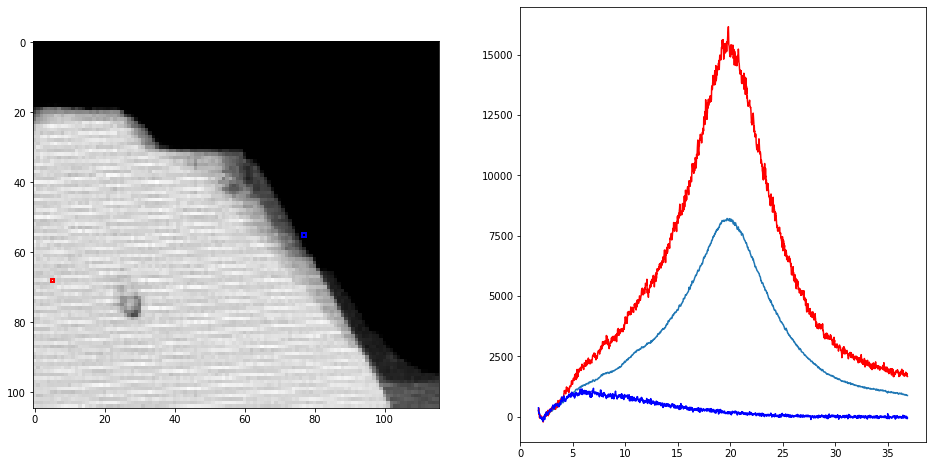

In [ ]:
# check one of the spectra and 2D projected image of an SI, now truncated

ii = 4
f,a = plt.subplots(1,2,figsize=(16,8))
a[0].imshow(image2[ii], cmap = 'gray')
a[1].plot(ENB_list[ii], np.mean(SINB_list[ii],axis=(0,1)))
# a[1].axvline(0.2, c='k', ls='--')
# a[1].set_ylim(-50,1000)

m,n = 5,68
a[1].plot(ENB_list[ii],SINB_list[ii][n,m,:], color = 'r')
a[0].add_patch(patches.Rectangle((m-0.5,n-0.5), 1, 1, ec = 'r', fill = False, lw = 2))

m,n = 77,55
a[1].plot(ENB_list[ii],SINB_list[ii][n,m,:], color = 'b')
a[0].add_patch(patches.Rectangle((m-0.5,n-0.5), 1, 1, ec = 'b', fill = False, lw = 2))

### SI0:

In [ ]:
ii = 0

SINBflat = np.reshape(SINB_list[ii], (SINB_list[ii].shape[0]*SINB_list[ii].shape[1],SINB_list[ii].shape[2]))
fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()

pca.fit(SINBflat[:,:])

explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

In [ ]:
N=30

SIdecon=np.copy(SINBflat)
SIdecon=np.copy(SINBflat[:,:])
SIdecon[np.where(SIdecon<0)]=0

XY = SINB_list[ii].shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm0=model.fit_transform(SIdecon[:,:])
NMFSpec0=model.components_
NMFIm0=NMFIm0.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[jj])
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[int(jj - len(colorlist)*rollover)])
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

In [ ]:
comps = [0, 1, 2, 3, 4]

In [ ]:
N=30

cutoff = 25 # eV
cut = np.abs(ENB_list[ii] - cutoff).argmin()

SIdecon=np.copy(SINBflat)
SIdecon=np.copy(SINBflat[:,:cut])
SIdecon[np.where(SIdecon<0)]=0

XY = SINB_list[ii].shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm0=model.fit_transform(SIdecon[:,:])
NMFSpec0=model.components_
NMFIm0=NMFIm0.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(ENB_list[ii][:cut],NMFSpec0[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(ENB_list[ii][:cut],NMFSpec0[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[jj])
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[int(jj - len(colorlist)*rollover)])
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

In [ ]:
comps2 = [0, 1, 2, 3, 5]

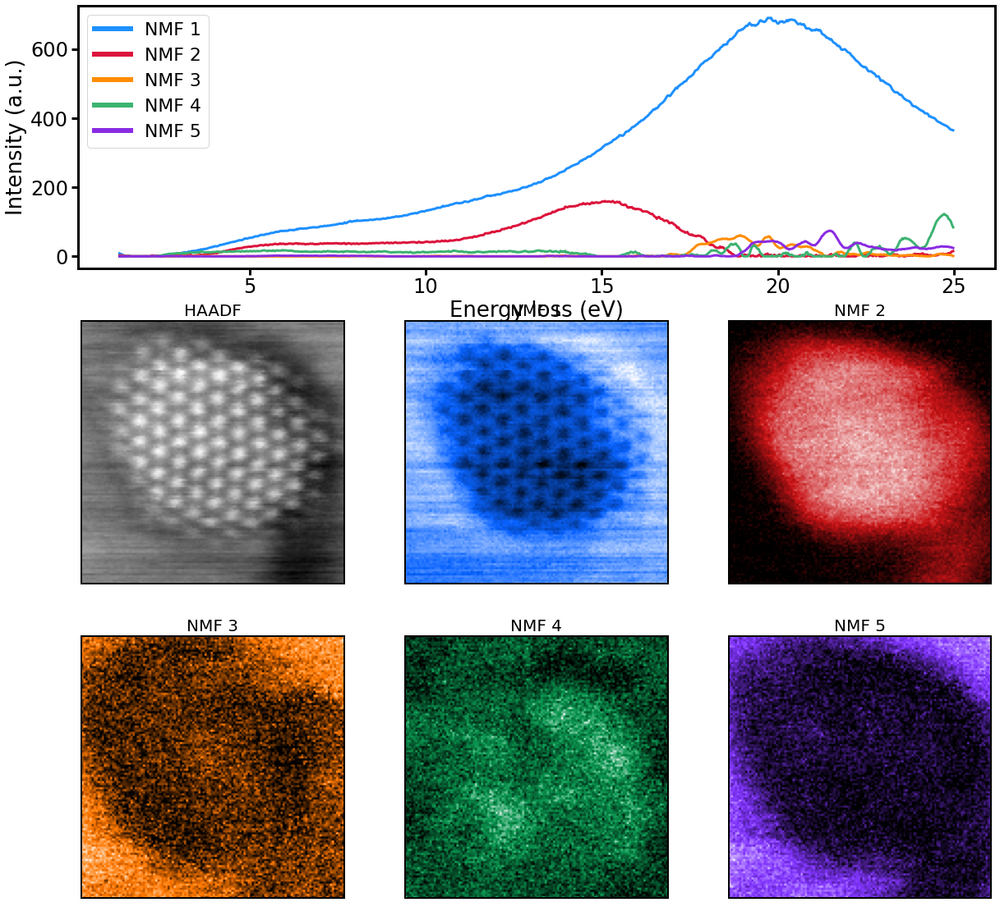

In [ ]:
fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(3,3)
ax00 = plt.subplot(gs[0,:])
ax10, ax11, ax12 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1]),plt.subplot(gs[1,2])
ax20, ax21, ax22 = plt.subplot(gs[2,0]), plt.subplot(gs[2,1]),plt.subplot(gs[2,2])



ax00.plot(ENB_list[0][:cut], NMFSpec0[comps2[0]], lw = 3, color = 'dodgerblue', label = 'NMF 1')
ax00.plot(ENB_list[0][:cut], NMFSpec0[comps2[1]], lw = 3, color = 'crimson', label = 'NMF 2')
ax00.plot(ENB_list[0][:cut], NMFSpec0[comps2[2]], lw = 3, color = 'darkorange', label = 'NMF 3')
ax00.plot(ENB_list[0][:cut], NMFSpec0[comps2[3]], lw = 3, color = 'mediumseagreen', label = 'NMF 4')
ax00.plot(ENB_list[0][:cut], NMFSpec0[comps2[4]], lw = 3, color = 'blueviolet', label = 'NMF 5')

leg=ax00.legend(fontsize = 22)
for line in leg.get_lines():
  line.set_linewidth(6)

ax10.imshow(image2[0], cmap = 'gray')
ax11.imshow(NMFIm0[comps2[0]], cmap = Cmap_Blue)
ax12.imshow(NMFIm0[comps2[1]], cmap = Cmap_Red)
ax20.imshow(NMFIm0[comps2[2]], cmap = Cmap_Orange)
ax21.imshow(NMFIm0[comps2[3]], cmap = Cmap_Green)
ax22.imshow(NMFIm0[comps2[4]], cmap = Cmap_Purple)

ax10.set_title('HAADF', fontsize = 20)
ax11.set_title('NMF 1', fontsize = 20)
ax12.set_title('NMF 2', fontsize = 20)
ax20.set_title('NMF 3', fontsize = 20)
ax21.set_title('NMF 4', fontsize = 20)
ax22.set_title('NMF 5', fontsize = 20)

img_axes = [ax10, ax11, ax12, ax20, ax21, ax22]
plt.setp(img_axes, xticks = [], yticks = [])

ax00.set_xlabel('Energy loss (eV)', fontsize = 26)
ax00.set_ylabel('Intensity (a.u.)', fontsize = 26)
ax00.tick_params(labelsize = 24, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax00.spines[axis].set_linewidth(3)
  for ax in img_axes:
    ax.spines[axis].set_linewidth(2)

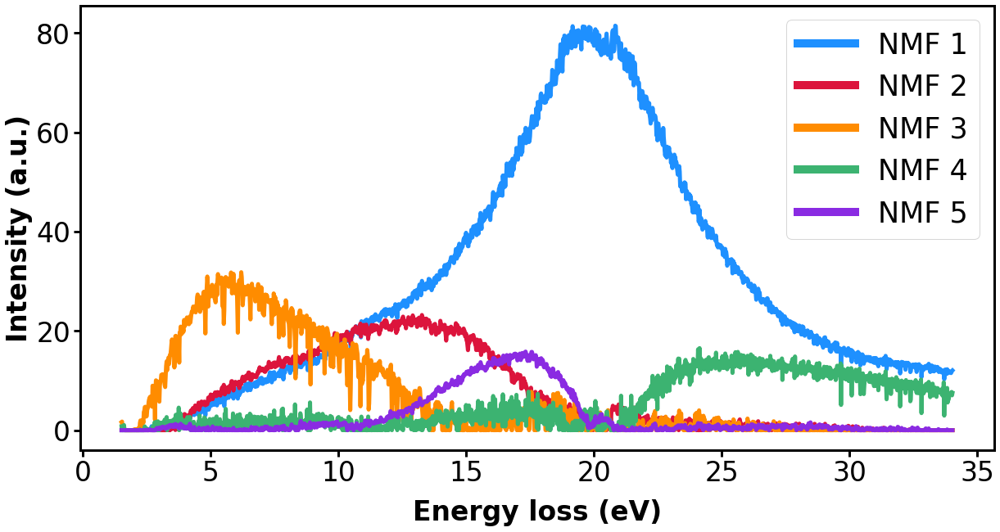

In [ ]:
fig,ax = plt.subplots(1,figsize=(20,10))

fsize = 40

ax.plot(ENB_list[0], NMFSpec0[comps[0]], lw = 5, color = 'dodgerblue', label = 'NMF 1')
ax.plot(ENB_list[0], NMFSpec0[comps[1]], lw = 5, color = 'crimson', label = 'NMF 2')
ax.plot(ENB_list[0], NMFSpec0[comps[2]], lw = 5, color = 'darkorange', label = 'NMF 3')
ax.plot(ENB_list[0], NMFSpec0[comps[3]], lw = 5, color = 'mediumseagreen', label = 'NMF 4')
ax.plot(ENB_list[0], NMFSpec0[comps[4]], lw = 5, color = 'blueviolet', label = 'NMF 5')

leg=ax.legend(fontsize = 35)
for line in leg.get_lines():
  line.set_linewidth(10)


ax.set_xlabel('Energy loss (eV)', fontsize = 33, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 33, weight = 'bold')
ax.tick_params(labelsize = 33, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

In [ ]:
fig = plt.figure(figsize=(20,13))
gs = gridspec.GridSpec(2,3)
# ax00 = plt.subplot(gs[0,:])
ax10, ax11, ax12 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]),plt.subplot(gs[0,2])
ax20, ax21, ax22 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1]),plt.subplot(gs[1,2])



# ax00.plot(ENB_list[0], NMFSpec0[comps[0]], lw = 3, color = 'dodgerblue', label = 'NMF 1')
# ax00.plot(ENB_list[0], NMFSpec0[comps[1]], lw = 3, color = 'crimson', label = 'NMF 2')
# ax00.plot(ENB_list[0], NMFSpec0[comps[2]], lw = 3, color = 'darkorange', label = 'NMF 3')
# ax00.plot(ENB_list[0], NMFSpec0[comps[3]], lw = 3, color = 'mediumseagreen', label = 'NMF 4')
# ax00.plot(ENB_list[0], NMFSpec0[comps[4]], lw = 3, color = 'blueviolet', label = 'NMF 5')

# leg=ax00.legend(fontsize = 22)
# for line in leg.get_lines():
#   line.set_linewidth(6)

ax10.imshow(image[0], cmap = 'gray')
ax11.imshow(NMFIm0[comps[0]], cmap = Cmap_Blue)
ax12.imshow(NMFIm0[comps[1]], cmap = Cmap_Red)
ax20.imshow(NMFIm0[comps[2]], cmap = Cmap_Orange)
ax21.imshow(NMFIm0[comps[3]], cmap = Cmap_Green)
ax22.imshow(NMFIm0[comps[4]], cmap = Cmap_Purple)

ax10.set_title('HAADF', fontsize = 30, weight = 'bold')
ax11.set_title('NMF 1', fontsize = 30, weight = 'bold')
ax12.set_title('NMF 2', fontsize = 30, weight = 'bold')
ax20.set_title('NMF 3', fontsize = 30, weight = 'bold')
ax21.set_title('NMF 4', fontsize = 30, weight = 'bold')
ax22.set_title('NMF 5', fontsize = 30, weight = 'bold')

img_axes = [ax10, ax11, ax12, ax20, ax21, ax22]
plt.setp(img_axes, xticks = [], yticks = [])

ax00.set_xlabel('Energy loss (eV)', fontsize = 26)
ax00.set_ylabel('Intensity (a.u.)', fontsize = 26)
ax00.tick_params(labelsize = 24, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax00.spines[axis].set_linewidth(3)
  for ax in img_axes:
    ax.spines[axis].set_linewidth(2)

### SI1:

In [ ]:
ii = 1

SINBflat = np.reshape(SINB_list[ii], (SINB_list[ii].shape[0]*SINB_list[ii].shape[1],SINB_list[ii].shape[2]))
fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()

pca.fit(SINBflat[:,:])

explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

1. Null any negatives (easiest to do)__

In [ ]:
plt.figure()
SIdecon=np.copy(SINBflat)
SIdecon=np.copy(SINBflat[:,:])
SIdecon[np.where(SIdecon<0)]=0
# plt.plot(np.mean(SIdecon[:,:],axis=(0)))
plt.plot(SIdecon[500,:])
plt.axhline(0,color='k',ls='--')

In [ ]:
# For SI

N=30

XY = SINB_list[ii].shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm0=model.fit_transform(SIdecon[:,:])
NMFSpec0=model.components_
NMFIm0=NMFIm0.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[jj])
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[int(jj - len(colorlist)*rollover)])
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

In [ ]:
# comps = [0, 4, 5, 8, 9, 39]
comps = [0, 1, 2, 6]

In [ ]:
k= 1

_,ax = plt.subplots(1,2,figsize=(16,6))
ax[0].imshow(NMFIm0[comps[k]], cmap = Cmap_Blackbody)
ax[1].plot(ENB_list[ii], NMFSpec0[comps[k]])

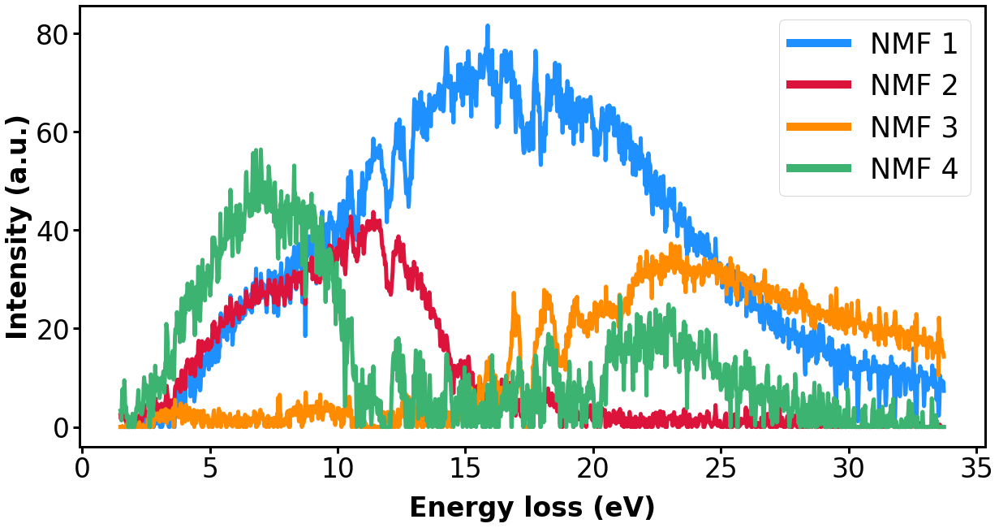

In [ ]:
fig,ax = plt.subplots(1,figsize=(20,10))

fsize = 40

ax.plot(ENB_list[ii], NMFSpec0[comps[0]], lw = 5, color = 'dodgerblue', label = 'NMF 1')
ax.plot(ENB_list[ii], NMFSpec0[comps[1]], lw = 5, color = 'crimson', label = 'NMF 2')
ax.plot(ENB_list[ii], NMFSpec0[comps[2]], lw = 5, color = 'darkorange', label = 'NMF 3')
ax.plot(ENB_list[ii], NMFSpec0[comps[3]], lw = 5, color = 'mediumseagreen', label = 'NMF 4')
# ax.plot(ENB_list[ii], NMFSpec0[comps[4]], lw = 5, color = 'blueviolet', label = 'NMF 5')

leg=ax.legend(fontsize = 35)
for line in leg.get_lines():
  line.set_linewidth(10)


ax.set_xlabel('Energy loss (eV)', fontsize = 33, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 33, weight = 'bold')
ax.tick_params(labelsize = 33, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

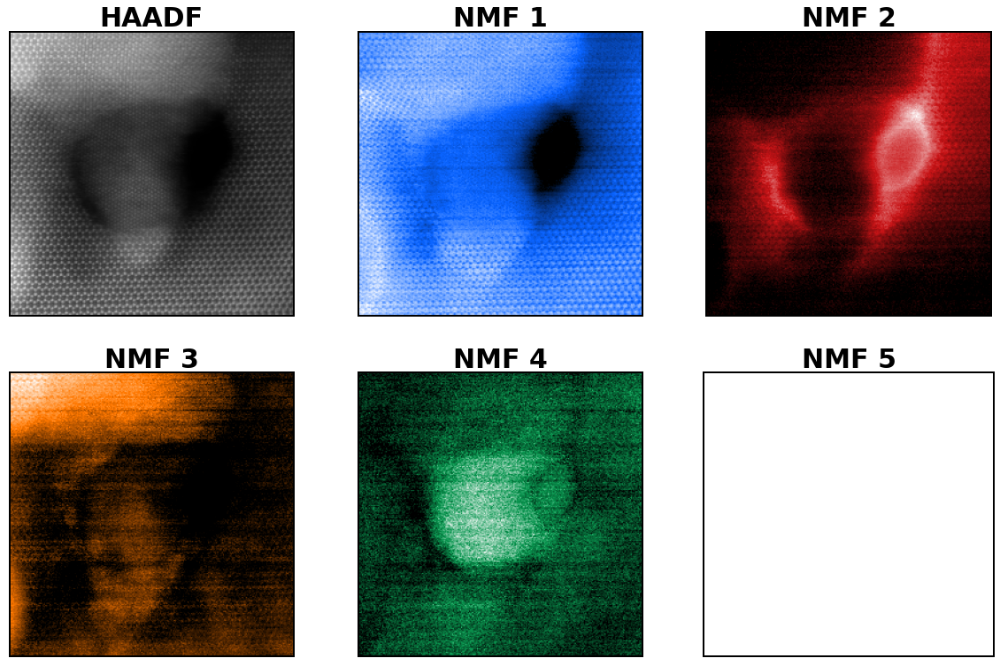

In [ ]:
fig = plt.figure(figsize=(20,13))
gs = gridspec.GridSpec(2,3)
# ax00 = plt.subplot(gs[0,:])
ax10, ax11, ax12 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]),plt.subplot(gs[0,2])
ax20, ax21, ax22 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1]),plt.subplot(gs[1,2])



# ax00.plot(ENB_list[0], NMFSpec0[comps[0]], lw = 3, color = 'dodgerblue', label = 'NMF 1')
# ax00.plot(ENB_list[0], NMFSpec0[comps[1]], lw = 3, color = 'crimson', label = 'NMF 2')
# ax00.plot(ENB_list[0], NMFSpec0[comps[2]], lw = 3, color = 'darkorange', label = 'NMF 3')
# ax00.plot(ENB_list[0], NMFSpec0[comps[3]], lw = 3, color = 'mediumseagreen', label = 'NMF 4')
# ax00.plot(ENB_list[0], NMFSpec0[comps[4]], lw = 3, color = 'blueviolet', label = 'NMF 5')

# leg=ax00.legend(fontsize = 22)
# for line in leg.get_lines():
#   line.set_linewidth(6)

ax10.imshow(image[ii], cmap = 'gray')
ax11.imshow(NMFIm0[comps[0]], cmap = Cmap_Blue)
ax12.imshow(NMFIm0[comps[1]], cmap = Cmap_Red)
ax20.imshow(NMFIm0[comps[2]], cmap = Cmap_Orange)
ax21.imshow(NMFIm0[comps[3]], cmap = Cmap_Green)
# ax22.imshow(NMFIm0[comps[4]], cmap = Cmap_Purple)

ax10.set_title('HAADF', fontsize = 30, weight = 'bold')
ax11.set_title('NMF 1', fontsize = 30, weight = 'bold')
ax12.set_title('NMF 2', fontsize = 30, weight = 'bold')
ax20.set_title('NMF 3', fontsize = 30, weight = 'bold')
ax21.set_title('NMF 4', fontsize = 30, weight = 'bold')
ax22.set_title('NMF 5', fontsize = 30, weight = 'bold')

img_axes = [ax10, ax11, ax12, ax20, ax21, ax22]
plt.setp(img_axes, xticks = [], yticks = [])

ax00.set_xlabel('Energy loss (eV)', fontsize = 26)
ax00.set_ylabel('Intensity (a.u.)', fontsize = 26)
ax00.tick_params(labelsize = 24, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax00.spines[axis].set_linewidth(3)
  for ax in img_axes:
    ax.spines[axis].set_linewidth(2)

### SI2:

In [ ]:
ii = 2

SINBflat = np.reshape(SINB_list[ii], (SINB_list[ii].shape[0]*SINB_list[ii].shape[1],SINB_list[ii].shape[2]))
fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()

pca.fit(SINBflat[:,:])

explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

1. Null any negatives (easiest to do)__

In [ ]:
plt.figure()
SIdecon=np.copy(SINBflat)
SIdecon=np.copy(SINBflat[:,:])
SIdecon[np.where(SIdecon<0)]=0
# plt.plot(np.mean(SIdecon[:,:],axis=(0)))
plt.plot(SIdecon[500,:])
plt.axhline(0,color='k',ls='--')

In [ ]:
# For SI

N=24

XY = SINB_list[ii].shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm0=model.fit_transform(SIdecon[:,:])
NMFSpec0=model.components_
NMFIm0=NMFIm0.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[jj])
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[int(jj - len(colorlist)*rollover)])
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

In [ ]:
# comps = [0, 4, 5, 8, 9, 39]
comps = [0, 1, 2, 4]

In [ ]:
len(comps)
NMFIm0[comps[0]]

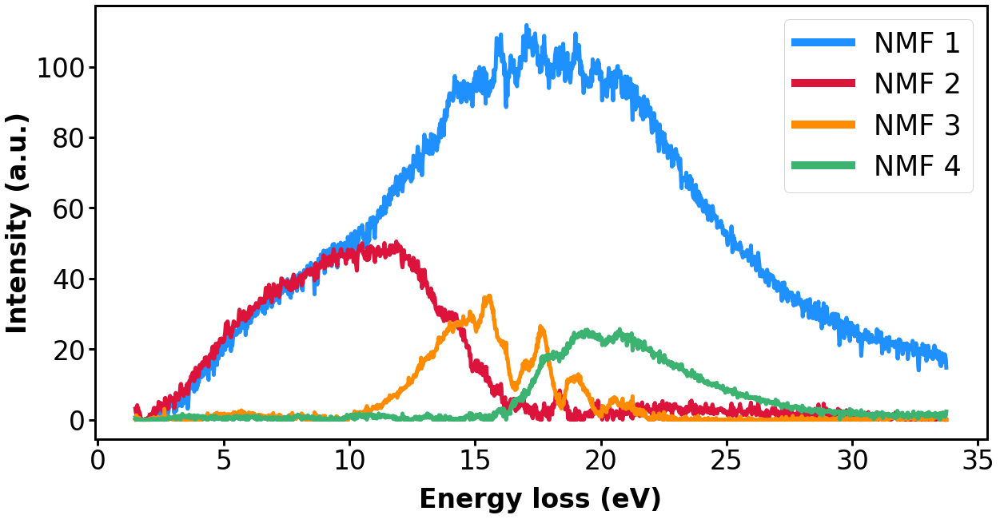

In [ ]:
fig,ax = plt.subplots(1,figsize=(20,10))

fsize = 40

ax.plot(ENB_list[ii], NMFSpec0[comps[0]], lw = 5, color = 'dodgerblue', label = 'NMF 1')
ax.plot(ENB_list[ii], NMFSpec0[comps[1]], lw = 5, color = 'crimson', label = 'NMF 2')
ax.plot(ENB_list[ii], NMFSpec0[comps[2]], lw = 5, color = 'darkorange', label = 'NMF 3')
ax.plot(ENB_list[ii], NMFSpec0[comps[3]], lw = 5, color = 'mediumseagreen', label = 'NMF 4')
# ax.plot(ENB_list[0], NMFSpec0[comps[4]], lw = 5, color = 'blueviolet', label = 'NMF 5')

leg=ax.legend(fontsize = 35)
for line in leg.get_lines():
  line.set_linewidth(10)


ax.set_xlabel('Energy loss (eV)', fontsize = 33, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 33, weight = 'bold')
ax.tick_params(labelsize = 33, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

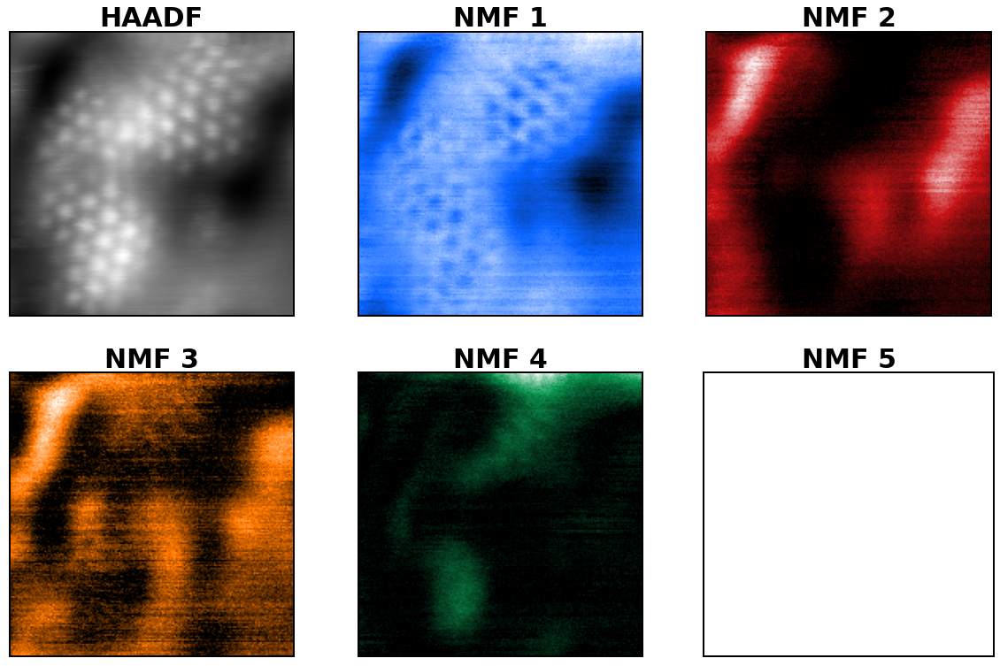

In [ ]:
fig = plt.figure(figsize=(20,13))
gs = gridspec.GridSpec(2,3)
# ax00 = plt.subplot(gs[0,:])
ax10, ax11, ax12 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]),plt.subplot(gs[0,2])
ax20, ax21, ax22 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1]),plt.subplot(gs[1,2])



# ax00.plot(ENB_list[0], NMFSpec0[comps[0]], lw = 3, color = 'dodgerblue', label = 'NMF 1')
# ax00.plot(ENB_list[0], NMFSpec0[comps[1]], lw = 3, color = 'crimson', label = 'NMF 2')
# ax00.plot(ENB_list[0], NMFSpec0[comps[2]], lw = 3, color = 'darkorange', label = 'NMF 3')
# ax00.plot(ENB_list[0], NMFSpec0[comps[3]], lw = 3, color = 'mediumseagreen', label = 'NMF 4')
# ax00.plot(ENB_list[0], NMFSpec0[comps[4]], lw = 3, color = 'blueviolet', label = 'NMF 5')

# leg=ax00.legend(fontsize = 22)
# for line in leg.get_lines():
#   line.set_linewidth(6)

ax10.imshow(image[ii], cmap = 'gray')
ax11.imshow(NMFIm0[comps[0]], cmap = Cmap_Blue)
ax12.imshow(NMFIm0[comps[1]], cmap = Cmap_Red)
ax20.imshow(NMFIm0[comps[2]], cmap = Cmap_Orange)
ax21.imshow(NMFIm0[comps[3]], cmap = Cmap_Green)
# ax22.imshow(NMFIm0[comps[4]], cmap = Cmap_Purple)

ax10.set_title('HAADF', fontsize = 30, weight = 'bold')
ax11.set_title('NMF 1', fontsize = 30, weight = 'bold')
ax12.set_title('NMF 2', fontsize = 30, weight = 'bold')
ax20.set_title('NMF 3', fontsize = 30, weight = 'bold')
ax21.set_title('NMF 4', fontsize = 30, weight = 'bold')
ax22.set_title('NMF 5', fontsize = 30, weight = 'bold')

img_axes = [ax10, ax11, ax12, ax20, ax21, ax22]
plt.setp(img_axes, xticks = [], yticks = [])

ax00.set_xlabel('Energy loss (eV)', fontsize = 26)
ax00.set_ylabel('Intensity (a.u.)', fontsize = 26)
ax00.tick_params(labelsize = 24, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax00.spines[axis].set_linewidth(3)
  for ax in img_axes:
    ax.spines[axis].set_linewidth(2)

### SI3:

In [ ]:
ii = 3

SINBflat = np.reshape(SINB_list[ii], (SINB_list[ii].shape[0]*SINB_list[ii].shape[1],SINB_list[ii].shape[2]))
fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()

pca.fit(SINBflat[:,:])

explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

1. Null any negatives (easiest to do)__

In [ ]:
plt.figure()
SIdecon=np.copy(SINBflat)
SIdecon=np.copy(SINBflat[:,:])
SIdecon[np.where(SIdecon<0)]=0
# plt.plot(np.mean(SIdecon[:,:],axis=(0)))
plt.plot(SIdecon[500,:])
plt.axhline(0,color='k',ls='--')

In [ ]:
# For SI

N=30

XY = SINB_list[ii].shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm0=model.fit_transform(SIdecon[:,:])
NMFSpec0=model.components_
NMFIm0=NMFIm0.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[jj])
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[int(jj - len(colorlist)*rollover)])
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

In [ ]:
# comps = [0, 4, 5, 8, 9, 39]
comps = [0, 1, 2, 3]
comps = [0,1,2,4]

In [ ]:
# len(comps)
# NMFIm0[comps[0]]

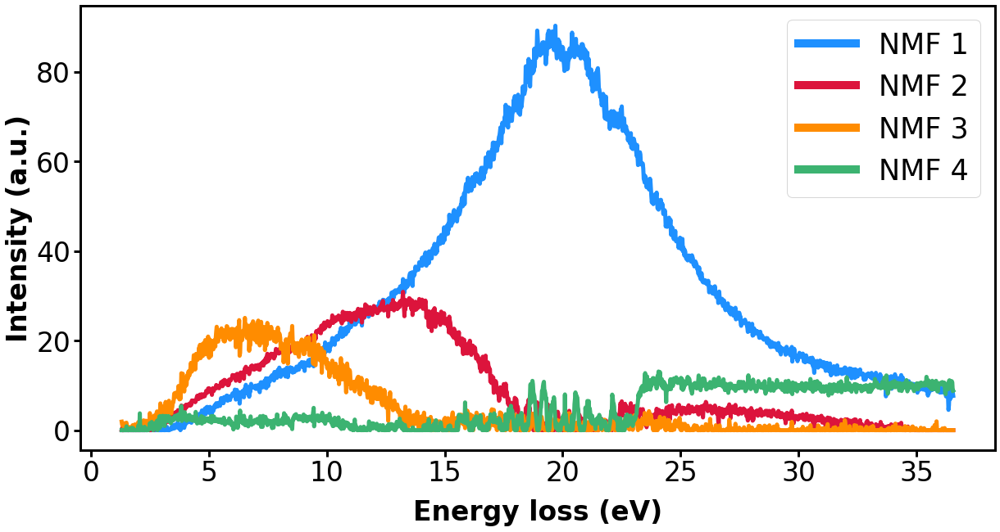

In [ ]:
fig,ax = plt.subplots(1,figsize=(20,10))

fsize = 40

ax.plot(ENB_list[ii], NMFSpec0[comps[0]], lw = 5, color = 'dodgerblue', label = 'NMF 1')
ax.plot(ENB_list[ii], NMFSpec0[comps[1]], lw = 5, color = 'crimson', label = 'NMF 2')
ax.plot(ENB_list[ii], NMFSpec0[comps[2]], lw = 5, color = 'darkorange', label = 'NMF 3')
ax.plot(ENB_list[ii], NMFSpec0[comps[3]], lw = 5, color = 'mediumseagreen', label = 'NMF 4')
# ax.plot(ENB_list[0], NMFSpec0[comps[4]], lw = 5, color = 'blueviolet', label = 'NMF 5')

leg=ax.legend(fontsize = 35)
for line in leg.get_lines():
  line.set_linewidth(10)


ax.set_xlabel('Energy loss (eV)', fontsize = 33, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 33, weight = 'bold')
ax.tick_params(labelsize = 33, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

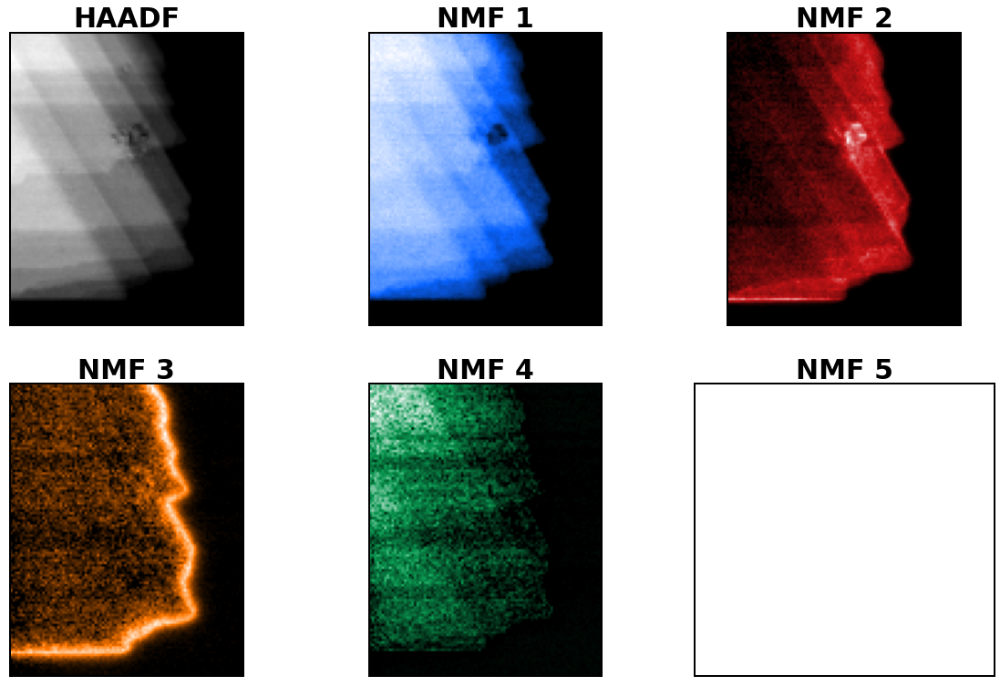

In [ ]:
fig = plt.figure(figsize=(20,13))
gs = gridspec.GridSpec(2,3)
# ax00 = plt.subplot(gs[0,:])
ax10, ax11, ax12 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]),plt.subplot(gs[0,2])
ax20, ax21, ax22 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1]),plt.subplot(gs[1,2])



# ax00.plot(ENB_list[0], NMFSpec0[comps[0]], lw = 3, color = 'dodgerblue', label = 'NMF 1')
# ax00.plot(ENB_list[0], NMFSpec0[comps[1]], lw = 3, color = 'crimson', label = 'NMF 2')
# ax00.plot(ENB_list[0], NMFSpec0[comps[2]], lw = 3, color = 'darkorange', label = 'NMF 3')
# ax00.plot(ENB_list[0], NMFSpec0[comps[3]], lw = 3, color = 'mediumseagreen', label = 'NMF 4')
# ax00.plot(ENB_list[0], NMFSpec0[comps[4]], lw = 3, color = 'blueviolet', label = 'NMF 5')

# leg=ax00.legend(fontsize = 22)
# for line in leg.get_lines():
#   line.set_linewidth(6)

ax10.imshow(image[ii], cmap = 'gray')
ax11.imshow(NMFIm0[comps[0]], cmap = Cmap_Blue)
ax12.imshow(NMFIm0[comps[1]], cmap = Cmap_Red)
ax20.imshow(NMFIm0[comps[2]], cmap = Cmap_Orange)
ax21.imshow(NMFIm0[comps[3]], cmap = Cmap_Green)
# ax22.imshow(NMFIm0[comps[4]], cmap = Cmap_Purple)

ax10.set_title('HAADF', fontsize = 30, weight = 'bold')
ax11.set_title('NMF 1', fontsize = 30, weight = 'bold')
ax12.set_title('NMF 2', fontsize = 30, weight = 'bold')
ax20.set_title('NMF 3', fontsize = 30, weight = 'bold')
ax21.set_title('NMF 4', fontsize = 30, weight = 'bold')
ax22.set_title('NMF 5', fontsize = 30, weight = 'bold')

img_axes = [ax10, ax11, ax12, ax20, ax21, ax22]
plt.setp(img_axes, xticks = [], yticks = [])

ax00.set_xlabel('Energy loss (eV)', fontsize = 26)
ax00.set_ylabel('Intensity (a.u.)', fontsize = 26)
ax00.tick_params(labelsize = 24, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax00.spines[axis].set_linewidth(3)
  for ax in img_axes:
    ax.spines[axis].set_linewidth(2)

In [ ]:
scalebar = 20
img = NMFIm0[comps[3]]

plt.figure(figsize=(7,7))
ax=plt.gca()
ax.imshow(NMFIm0[comps[2]], cmap = Cmap_Orange)

length = scalebar/img_scales[ii]
height = length/4

xx,yy = img.shape[1], img.shape[0]
xfrac, yfrac = 0.5, 0.9
p1,p2 = xfrac*xx, yfrac*yy
ax.add_patch(patches.Rectangle((p1,p2), length, height, color = 'white', ec='k', lw=1, fill = True))
ax.axis('off')

length


In [ ]:
scalebar = 20
img = NMFIm0[comps[3]]

fig,ax = plt.subplots(1,2,figsize=(12,7))

ax[0].imshow(image[ii], cmap = 'gray')
ax[1].imshow(NMFIm0[comps[2]], cmap = Cmap_Orange)

length = scalebar/img_scales[ii]
height = length/4

xx,yy = img.shape[1], img.shape[0]
xfrac, yfrac = 0.82, 0.93
p1,p2 = xfrac*xx, yfrac*yy

ax[0].add_patch(patches.Rectangle((p1,p2), length, height, color = 'white', ec='k', lw=1, fill = True))
ax[1].add_patch(patches.Rectangle((p1,p2), length, height, color = 'white', ec='k', lw=1, fill = True))
ax[0].axis('off')
ax[1].axis('off')


# length


In [ ]:
fig,ax = plt.subplots(1,figsize=(20,10))

fsize = 40


ax.plot(ENB_list[ii], NMFSpec0[comps[2]], lw = 5, color = 'darkorange', label = 'NMF 3')

# ax.plot(ENB_list[0], NMFSpec0[comps[4]], lw = 5, color = 'blueviolet', label = 'NMF 5')

leg=ax.legend(fontsize = 35)
for line in leg.get_lines():
  line.set_linewidth(10)


ax.set_xlabel('Energy loss (eV)', fontsize = 33, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 33, weight = 'bold')
ax.tick_params(labelsize = 33, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

### SI4:

In [ ]:
ii = 4

SINBflat = np.reshape(SINB_list[ii], (SINB_list[ii].shape[0]*SINB_list[ii].shape[1],SINB_list[ii].shape[2]))
fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()

pca.fit(SINBflat[:,:])

explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

1. Null any negatives (easiest to do)__

In [ ]:
plt.figure()
SIdecon=np.copy(SINBflat)
SIdecon=np.copy(SINBflat[:,:])
SIdecon[np.where(SIdecon<0)]=0
# plt.plot(np.mean(SIdecon[:,:],axis=(0)))
plt.plot(SIdecon[500,:])
plt.axhline(0,color='k',ls='--')

In [ ]:
# For SI

N=30

XY = SINB_list[ii].shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm0=model.fit_transform(SIdecon[:,:])
NMFSpec0=model.components_
NMFIm0=NMFIm0.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(ENB_list[ii][:],NMFSpec0[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[jj])
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[int(jj - len(colorlist)*rollover)])
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

In [ ]:
# comps = [0, 4, 5, 8, 9, 39]
comps = [0, 2, 3, 4, 5, 7, 10, 11]

In [ ]:
# len(comps)
# NMFIm0[comps[0]]

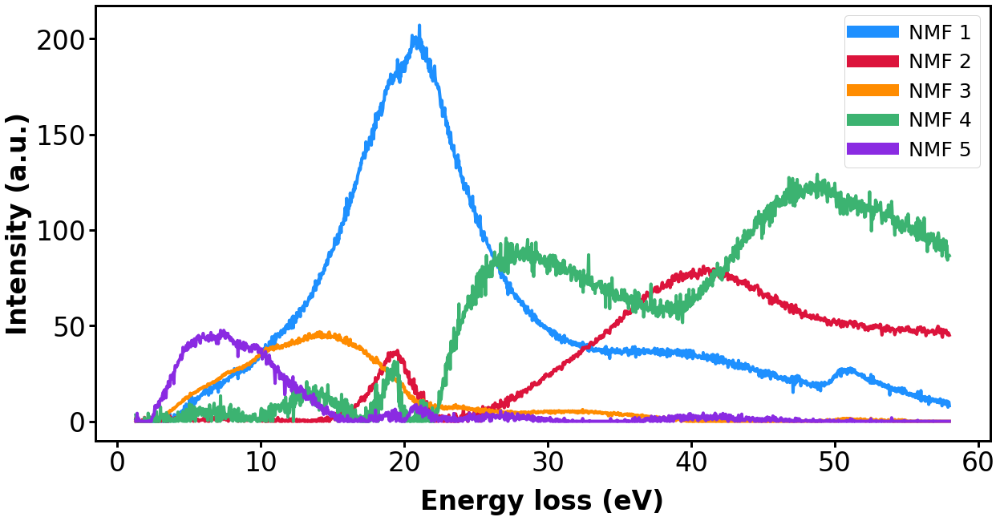

In [ ]:
fig,ax = plt.subplots(1,figsize=(20,10))

fsize = 40

ax.plot(ENB_list[ii], NMFSpec0[comps[0]], lw = 4, color = 'dodgerblue', label = 'NMF 1')
ax.plot(ENB_list[ii], NMFSpec0[comps[1]], lw = 4, color = 'crimson', label = 'NMF 2')
ax.plot(ENB_list[ii], NMFSpec0[comps[2]], lw = 4, color = 'darkorange', label = 'NMF 3')
ax.plot(ENB_list[ii], NMFSpec0[comps[3]], lw = 4, color = 'mediumseagreen', label = 'NMF 4')
ax.plot(ENB_list[ii], NMFSpec0[comps[4]], lw = 4, color = 'blueviolet', label = 'NMF 5')
# ax.plot(ENB_list[ii], NMFSpec0[comps[5]], lw = 4, color = 'gray', label = 'NMF 6')
# ax.plot(ENB_list[ii], NMFSpec0[comps[6]], lw = 4, color = 'gold', label = 'NMF 7')
# ax.plot(ENB_list[ii], NMFSpec0[comps[7]], lw = 4, color = 'darkblue', label = 'NMF 8')

leg=ax.legend(fontsize = 25)
for line in leg.get_lines():
  line.set_linewidth(15)


ax.set_xlabel('Energy loss (eV)', fontsize = 33, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 33, weight = 'bold')
ax.tick_params(labelsize = 33, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

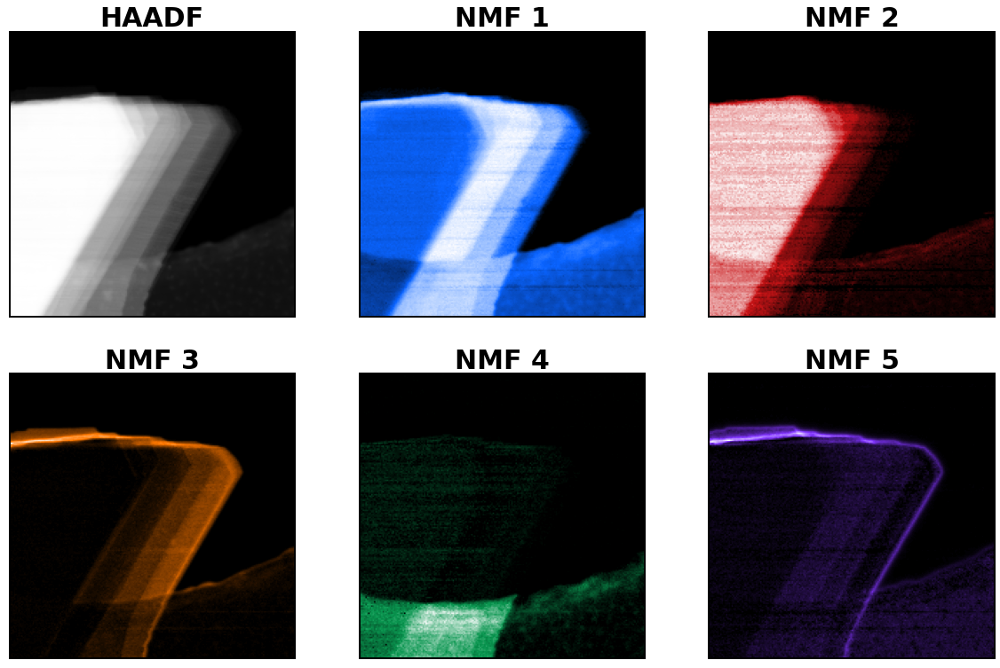

In [ ]:
fig = plt.figure(figsize=(20,13))
gs = gridspec.GridSpec(2,3)
# ax00 = plt.subplot(gs[0,:])
ax10, ax11, ax12 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]),plt.subplot(gs[0,2])
ax20, ax21, ax22 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1]),plt.subplot(gs[1,2])



# ax00.plot(ENB_list[0], NMFSpec0[comps[0]], lw = 3, color = 'dodgerblue', label = 'NMF 1')
# ax00.plot(ENB_list[0], NMFSpec0[comps[1]], lw = 3, color = 'crimson', label = 'NMF 2')
# ax00.plot(ENB_list[0], NMFSpec0[comps[2]], lw = 3, color = 'darkorange', label = 'NMF 3')
# ax00.plot(ENB_list[0], NMFSpec0[comps[3]], lw = 3, color = 'mediumseagreen', label = 'NMF 4')
# ax00.plot(ENB_list[0], NMFSpec0[comps[4]], lw = 3, color = 'blueviolet', label = 'NMF 5')

# leg=ax00.legend(fontsize = 22)
# for line in leg.get_lines():
#   line.set_linewidth(6)

ax10.imshow(image[ii], cmap = 'gray')
ax11.imshow(NMFIm0[comps[0]], cmap = Cmap_Blue)
ax12.imshow(NMFIm0[comps[1]], cmap = Cmap_Red)
ax20.imshow(NMFIm0[comps[2]], cmap = Cmap_Orange)
ax21.imshow(NMFIm0[comps[3]], cmap = Cmap_Green)
ax22.imshow(NMFIm0[comps[4]], cmap = Cmap_Purple)

ax10.set_title('HAADF', fontsize = 30, weight = 'bold')
ax11.set_title('NMF 1', fontsize = 30, weight = 'bold')
ax12.set_title('NMF 2', fontsize = 30, weight = 'bold')
ax20.set_title('NMF 3', fontsize = 30, weight = 'bold')
ax21.set_title('NMF 4', fontsize = 30, weight = 'bold')
ax22.set_title('NMF 5', fontsize = 30, weight = 'bold')

img_axes = [ax10, ax11, ax12, ax20, ax21, ax22]
plt.setp(img_axes, xticks = [], yticks = [])

ax00.set_xlabel('Energy loss (eV)', fontsize = 26)
ax00.set_ylabel('Intensity (a.u.)', fontsize = 26)
ax00.tick_params(labelsize = 24, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax00.spines[axis].set_linewidth(3)
  for ax in img_axes:
    ax.spines[axis].set_linewidth(2)

### 09.21.21 more SI's

In [ ]:
# Vibrational_SI
# SI_core

In [ ]:
len(Vibrational_SI)

2

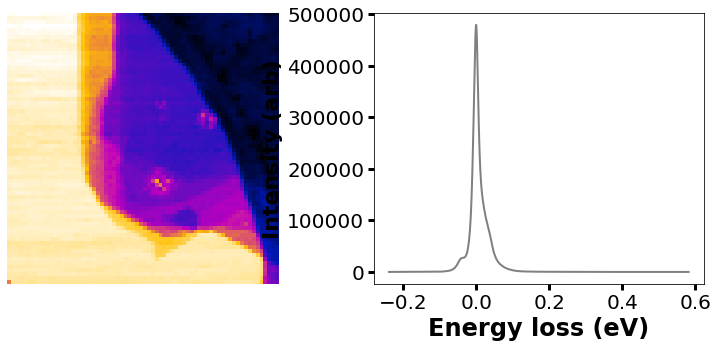

In [ ]:
ii = 0

fig,(ax1,ax2) = plt.subplots(1,2,figsize=(13,5))

ax1.imshow(np.mean(Vibrational_SI[ii],axis=2), cmap = Cmap_Blackbody)
ax1.axis('off')

ax2.plot(Vibrational_E[ii], np.mean(Vibrational_SI[ii],axis=(0,1)), lw=2, color='gray')
ax2.set_xlabel('Energy loss (eV)',fontsize = 24, weight = 'bold')
ax2.set_ylabel('Intensity (arb)', fontsize = 22, weight = 'bold')
ax2.tick_params(labelsize = 20, length = 6, width = 3)

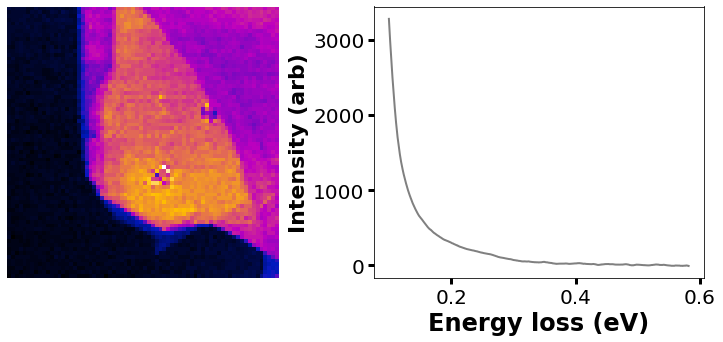

In [ ]:
truncate = 0.1
idx = np.abs(Vibrational_E[ii] - truncate).argmin()
E_cut, SI_cut = Vibrational_E[ii][idx:],Vibrational_SI[ii][:,:,idx:]

fig,(ax1,ax2) = plt.subplots(1,2,figsize=(13,5))

ax1.imshow(np.mean(SI_cut,axis=2), cmap = Cmap_Blackbody)
ax1.axis('off')

ax2.plot(E_cut, np.mean(SI_cut,axis=(0,1)), lw=2, color='gray')
ax2.set_xlabel('Energy loss (eV)',fontsize = 24, weight = 'bold')
ax2.set_ylabel('Intensity (arb)', fontsize = 22, weight = 'bold')
ax2.tick_params(labelsize = 20, length = 6, width = 3)

In [ ]:
SINBflat = np.reshape(SI_cut, (SI_cut.shape[0]*SI_cut.shape[1],SI_cut.shape[2]))
fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()

pca.fit(SINBflat[:,:])

explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

1. Null any negatives (easiest to do)__

In [ ]:
plt.figure()
SIdecon=np.copy(SINBflat)
SIdecon=np.copy(SINBflat[:,:])
SIdecon[np.where(SIdecon<0)]=0
# plt.plot(np.mean(SIdecon[:,:],axis=(0)))
plt.plot(SIdecon[500,:])
plt.axhline(0,color='k',ls='--')

In [ ]:
N=30

XY = SI_cut.shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm0=model.fit_transform(SIdecon[:,:])
NMFSpec0=model.components_
NMFIm0=NMFIm0.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(E_cut[:],NMFSpec0[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(E_cut[:],NMFSpec0[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[jj])
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[int(jj - len(colorlist)*rollover)])
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

In [ ]:
###########################
##### ANOTHER #############
###########################

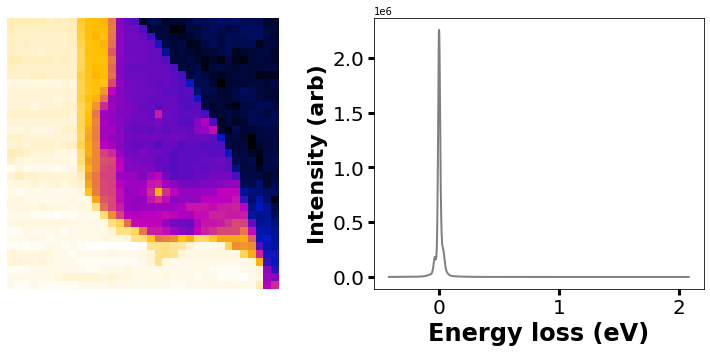

In [ ]:
ii = 1

fig,(ax1,ax2) = plt.subplots(1,2,figsize=(13,5))

ax1.imshow(np.mean(Vibrational_SI[ii],axis=2), cmap = Cmap_Blackbody)
ax1.axis('off')

ax2.plot(Vibrational_E[ii], np.mean(Vibrational_SI[ii],axis=(0,1)), lw=2, color='gray')
ax2.set_xlabel('Energy loss (eV)',fontsize = 24, weight = 'bold')
ax2.set_ylabel('Intensity (arb)', fontsize = 22, weight = 'bold')
ax2.tick_params(labelsize = 20, length = 6, width = 3)

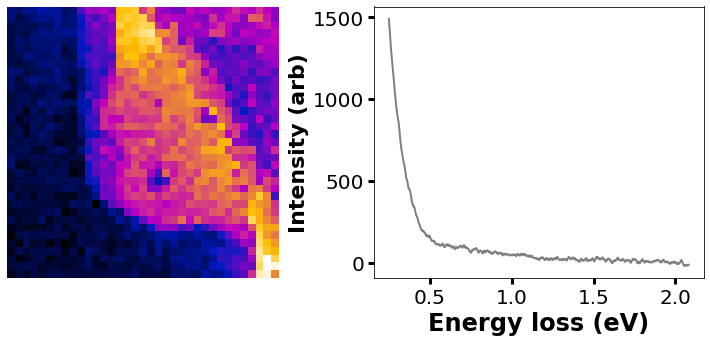

In [ ]:
truncate = 0.25
idx = np.abs(Vibrational_E[ii] - truncate).argmin()
E_cut2, SI_cut2 = Vibrational_E[ii][idx:],Vibrational_SI[ii][:,:,idx:]

fig,(ax1,ax2) = plt.subplots(1,2,figsize=(13,5))

ax1.imshow(np.mean(SI_cut2,axis=2), cmap = Cmap_Blackbody)
ax1.axis('off')

ax2.plot(E_cut2, np.mean(SI_cut2,axis=(0,1)), lw=2, color='gray')
ax2.set_xlabel('Energy loss (eV)',fontsize = 24, weight = 'bold')
ax2.set_ylabel('Intensity (arb)', fontsize = 22, weight = 'bold')
ax2.tick_params(labelsize = 20, length = 6, width = 3)

In [ ]:
SINBflat = np.reshape(SI_cut2, (SI_cut2.shape[0]*SI_cut2.shape[1],SI_cut2.shape[2]))
fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()

pca.fit(SINBflat[:,:])

explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

1. Null any negatives (easiest to do)__

In [ ]:
plt.figure()
SIdecon=np.copy(SINBflat)
SIdecon=np.copy(SINBflat[:,:])
SIdecon[np.where(SIdecon<0)]=0
# plt.plot(np.mean(SIdecon[:,:],axis=(0)))
plt.plot(SIdecon[500,:])
plt.axhline(0,color='k',ls='--')

In [ ]:
N=30

XY = SI_cut2.shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm0=model.fit_transform(SIdecon[:,:])
NMFSpec0=model.components_
NMFIm0=NMFIm0.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(E_cut2[:],NMFSpec0[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(E_cut2[:],NMFSpec0[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[jj])
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm0[jj],cmap = Cmap_list[int(jj - len(colorlist)*rollover)])
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

### Edges #1

In [ ]:
ii = 4
normed_img = normalize(image[ii])
plt.figure(figsize=(6,6))
plt.imshow(normed_img, cmap = 'gray')

scale = img_scales[ii]

In [ ]:
n_comps = 8

scalebar = 100 # nm

kmeans = KMeans(n_clusters = n_comps)
normed_img_s = normed_img.reshape(-1,1)
s = kmeans.fit(normed_img_s)
labels = kmeans.labels_
labels=list(labels)
centroid = kmeans.cluster_centers_
segmented_im = centroid[labels]
segmented_im = segmented_im.reshape(normed_img.shape)

fig,ax = plt.subplots(1,2,figsize=(14,7))
ax[0].imshow(segmented_im, cmap = 'gnuplot2')
# ax[0].imshow(segmented_im, cmap = Colors)
ax[1].imshow(normed_img, cmap = 'gray')

ax[0].set_title('Clustered based on intensity', fontsize = 24)
ax[1].set_title('HAADF-STEM', fontsize = 24)
plt.setp([ax[0],ax[1]], xticks=[], yticks =[]);

scale = img_scales[ii]
length = scalebar/scale  
height = length/6 
origin = 0.78*segmented_im.shape[1], 0.92*segmented_im.shape[0]

ax[1].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

* Now we segment the image and grab the pixels here.

In [ ]:
n_comps = 8
masked_imgs = np.zeros((n_comps,normed_img.shape[0],normed_img.shape[1]))
kmeans = KMeans(n_clusters = n_comps)
normed_img_s = normed_img.reshape(-1,1)
s = kmeans.fit(normed_img_s)
labels = kmeans.labels_
labels=list(labels)
centroid = kmeans.cluster_centers_
segmented_im = centroid[labels]
segmented_im = segmented_im.reshape(normed_img.shape)

num_im = len(centroid)

rows = int(np.ceil(float(num_im)/4))
cols = int(np.ceil(float(num_im)/rows))

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (6*cols, 4*(1+rows)))   
for cluster in range(num_im):
    ax = fig.add_subplot(gs[cluster])
    masked_image = np.copy(normed_img)
    for c in range(len(centroid)):
      if c == cluster:
        pass
      else:
        masked_image[np.asarray(np.reshape(labels, normed_img.shape)) == c] = 0
    masked_image = masked_image.reshape(normed_img.shape)
    masked_imgs[cluster] = normalize(masked_image)
    ax.imshow(masked_image, cmap = 'gnuplot2')
    ax.axis('off')

In [ ]:
# Colors_string = ['Purple','Orange','Blue','Red','Green','Yellow','Pink','Gold']
# Colors = [Purple,Orange,Blue,Red,Green,Yellow,Pink,Gold]

In [ ]:
Colors = [Green,Orange,Blue,Red,Gold,Yellow,Pink,Purple]
Colors_string = ['Green','Orange','Blue','Red','Gold','Yellow','Pink','Purple']

segmented_im_rgb = MakeCompositeImage(masked_imgs, Colors)

scalebar = 100 # nm

fig,ax = plt.subplots(1,2,figsize=(14,7))
ax[0].imshow(segmented_im_rgb)
ax[1].imshow(normed_img, cmap = 'gray')

ax[0].set_title('Clustered based on intensity', fontsize = 24)
ax[1].set_title('HAADF-STEM', fontsize = 24)
plt.setp([ax[0],ax[1]], xticks=[], yticks =[]);

scale = img_scales[ii]
length = scalebar/scale  
height = length/6 
origin = 0.78*segmented_im.shape[1], 0.92*segmented_im.shape[0]

ax[1].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

* Collect EELS from each of these and plot. We can remove others that we don't like later (like that substrate)

In [ ]:
# kk = 0
# thresh = 0.5
# binary = np.copy(masked_imgs[kk])
# binary[binary > thresh] == 1
# binary[binary <= thresh] == np.nan

# # binary = binary.astype(int)
# plt.imshow(binary)
# binary

In [ ]:
masked_imgs[0].min(), masked_imgs[0].max()

(0.0, 1.0)

In [ ]:
kk = 0
thresh = 0.0000001
binary = np.copy(masked_imgs[kk])
binary[np.where(binary < thresh)] = np.nan
binary[np.where(binary >= thresh)] = 1

# binary = np.expand_dims(binary,2)
# binary3d = np.broadcast_to(binary, SINB_list[ii].shape)
# binary.shape, binary3d.shape

binary3d = np.zeros_like(SINB_list[ii])
for m in range(binary3d.shape[2]):
  binary3d[:,:,m] = binary

plt.imshow(binary3d[:,:,10], cmap = 'RdBu')

In [ ]:
region_avg = np.nanmean(SINB_list[ii]*binary3d,axis=(0,1))
fig,ax =plt.subplots(1,2,figsize=(17,7))

ax[0].imshow(normed_img, cmap = 'gray')
ax[0].imshow(binary, cmap = 'RdBu', alpha = 0.9)
# ax[0].imshow(test, alpha = 0.8)
ax[0].set_title('Clustered based on intensity', fontsize = 24)
plt.setp([ax[0]], xticks=[], yticks =[]);
scale = img_scales[ii]
length = scalebar/scale  
height = length/6 
origin = 0.78*segmented_im.shape[1], 0.92*segmented_im.shape[0]
ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

ax[1].plot(ENB_list[ii], region_avg)
ax[1].set_xlabel('Energy loss (eV)',fontsize = 24, weight = 'bold')
ax[1].set_ylabel('Intensity (arb)', fontsize = 22, weight = 'bold')
ax[1].tick_params(labelsize = 20, length = 6, width = 3)

* Collect them ALL

In [ ]:
Colors = [Green,Orange,Blue,Red,Gold,Yellow,Pink,Purple]
Colors_string = ['Green','Orange','Blue','Red','Gold','Yellow','Pink','Purple']

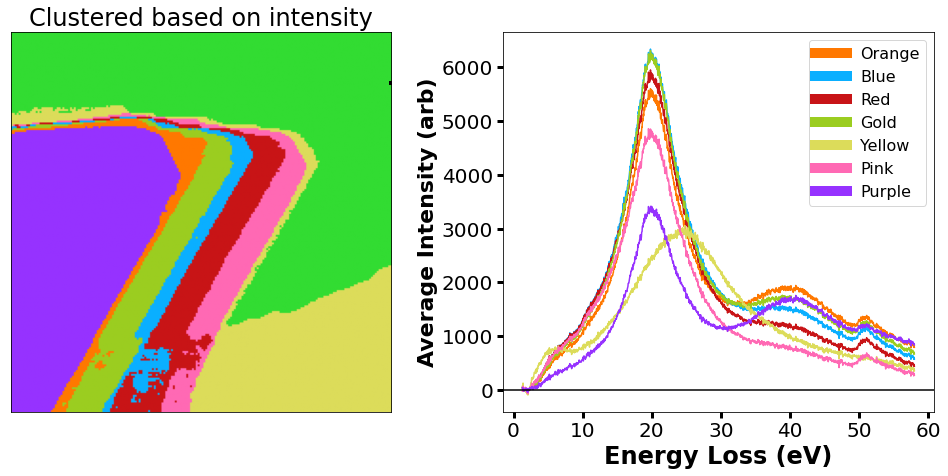

In [ ]:
thresh = 0.0000001

fig,ax = plt.subplots(1,2,figsize=(17,7))
ax[0].imshow(segmented_im_rgb)
ax[0].set_title('Clustered based on intensity', fontsize = 24)

for spec in range(1, len(masked_imgs)):

  binary = np.copy(masked_imgs[spec])
  binary[np.where(binary < thresh)] = np.nan
  binary[np.where(binary >= thresh)] = 1
  binary3d = np.zeros_like(SINB_list[ii])
  for m in range(binary3d.shape[2]):
    binary3d[:,:,m] = binary
  region_avg = np.nanmean(SINB_list[ii]*binary3d,axis=(0,1))
  ax[1].plot(ENB_list[ii], region_avg, color = Colors[spec], label = '{}'.format(Colors_string[spec]))

plt.setp(ax[0], xticks=[], yticks=[])
ax[1].set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax[1].set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax[1].tick_params(labelsize = 20, length = 6, width = 3)

leg = ax[1].legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax[1].axhline(0, color = 'k')

* Ignore yellow (includes most of the substrate!)

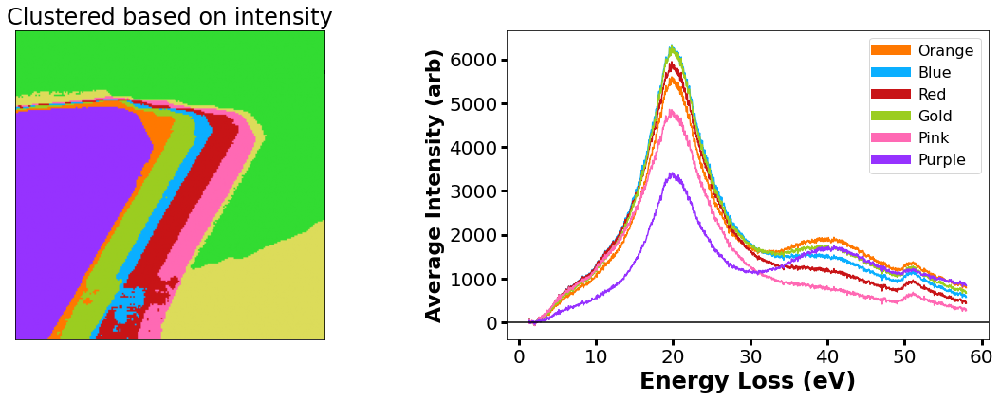

In [ ]:
thresh = 0.0000001

fig,ax = plt.subplots(1,2,figsize=(20,6))
ax[0].imshow(segmented_im_rgb)
ax[0].set_title('Clustered based on intensity', fontsize = 24)

for spec in range(1, len(masked_imgs)):
  if spec == 5:
    pass
  else:
    binary = np.copy(masked_imgs[spec])
    binary[np.where(binary < thresh)] = np.nan
    binary[np.where(binary >= thresh)] = 1
    binary3d = np.zeros_like(SINB_list[ii])
    for m in range(binary3d.shape[2]):
      binary3d[:,:,m] = binary
    region_avg = np.nanmean(SINB_list[ii]*binary3d,axis=(0,1))
    ax[1].plot(ENB_list[ii], region_avg, color = Colors[spec], label = '{}'.format(Colors_string[spec]))

plt.setp(ax[0], xticks=[], yticks=[])
ax[1].set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax[1].set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax[1].tick_params(labelsize = 20, length = 6, width = 3)

leg = ax[1].legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax[1].axhline(0, color = 'k')

### Edges #2

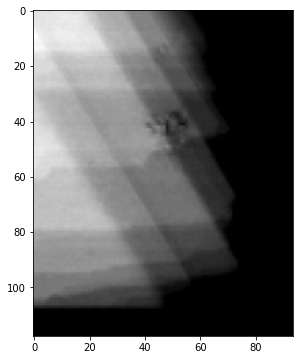

In [ ]:
ii = 3
normed_img = normalize(image[ii])
plt.figure(figsize=(6,6))
plt.imshow(normed_img, cmap = 'gray')

scale = img_scales[ii]

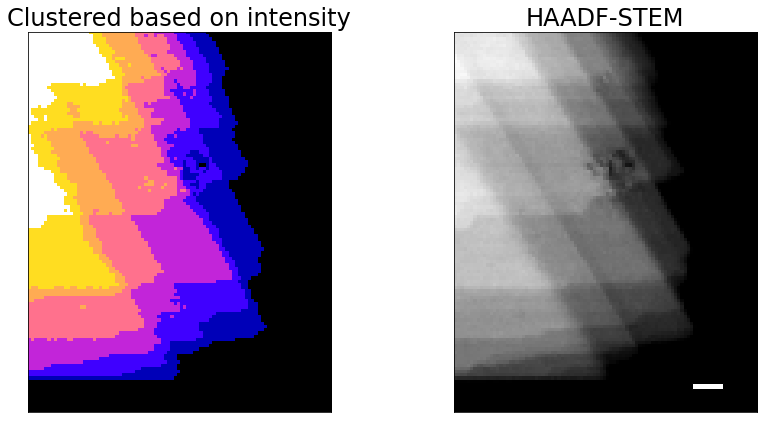

In [ ]:
n_comps = 8

scalebar = 20 # nm

kmeans = KMeans(n_clusters = n_comps)
normed_img_s = normed_img.reshape(-1,1)
s = kmeans.fit(normed_img_s)
labels = kmeans.labels_
labels=list(labels)
centroid = kmeans.cluster_centers_
segmented_im = centroid[labels]
segmented_im = segmented_im.reshape(normed_img.shape)

fig,ax = plt.subplots(1,2,figsize=(14,7))
ax[0].imshow(segmented_im, cmap = 'gnuplot2')
# ax[0].imshow(segmented_im, cmap = Colors)
ax[1].imshow(normed_img, cmap = 'gray')

ax[0].set_title('Clustered based on intensity', fontsize = 24)
ax[1].set_title('HAADF-STEM', fontsize = 24)
plt.setp([ax[0],ax[1]], xticks=[], yticks =[]);

scale = img_scales[ii]
length = scalebar/scale  
height = length/6 
origin = 0.78*segmented_im.shape[1], 0.92*segmented_im.shape[0]

ax[1].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

In [ ]:
int(np.round(8/4))

2

In [ ]:
9.20)

* Now we actually segment the image and grab the pixels here.

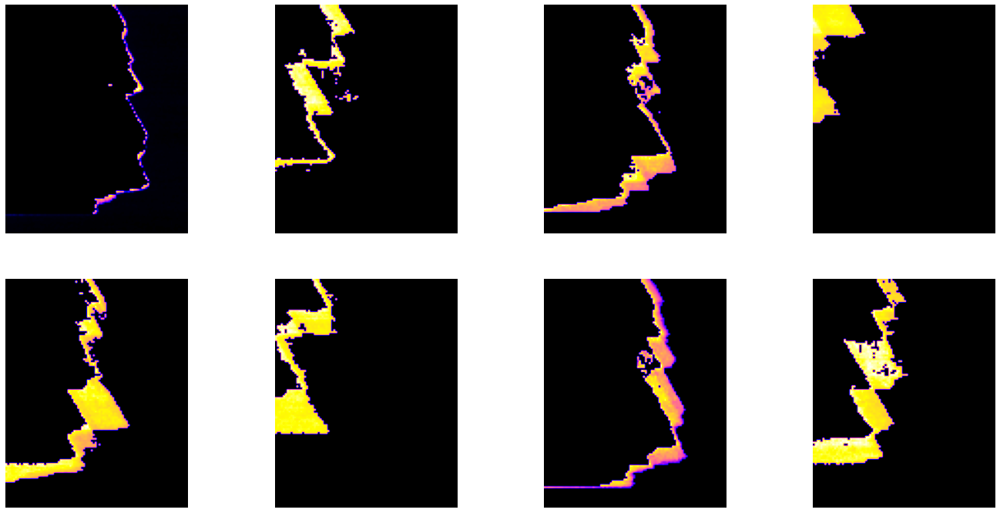

In [ ]:
n_comps = 8
masked_imgs = np.zeros((n_comps,normed_img.shape[0],normed_img.shape[1]))
kmeans = KMeans(n_clusters = n_comps, random_state = 42)
normed_img_s = normed_img.reshape(-1,1)
s = kmeans.fit(normed_img_s)
labels = kmeans.labels_
labels=list(labels)
centroid = kmeans.cluster_centers_
segmented_im = centroid[labels]
segmented_im = segmented_im.reshape(normed_img.shape)

num_im = len(centroid)

# rows = int(np.ceil(float(num_im)/4))
# cols = int(np.ceil(float(num_im)/rows))
rows, cols = 2,4

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (6*cols, 4*(1+rows)))   
for cluster in range(num_im):
    ax = fig.add_subplot(gs[cluster])
    masked_image = np.copy(normed_img)
    for c in range(len(centroid)):
      if c == cluster:
        pass
      else:
        masked_image[np.asarray(np.reshape(labels, normed_img.shape)) == c] = 0
    masked_image = masked_image.reshape(normed_img.shape)
    masked_imgs[cluster] = normalize(masked_image)
    ax.imshow(masked_image, cmap = 'gnuplot2')
    ax.axis('off')

In [ ]:
# Colors_string = ['Purple','Orange','Blue','Red','Green','Yellow','Pink','Gold']
# Colors = [Purple,Orange,Blue,Red,Green,Yellow,Pink,Gold]

(8, 118, 94)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:598: RuntimeWarning: invalid value encountered in true_divide


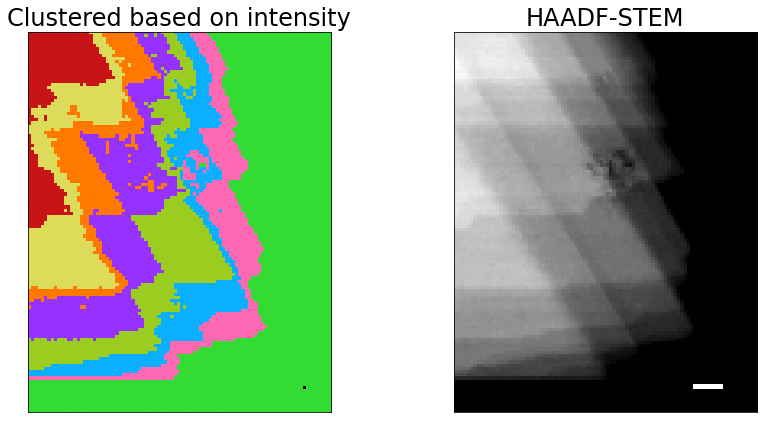

In [ ]:
Colors = [Green,Orange,Blue,Red,Gold,Yellow,Pink,Purple]
Colors_string = ['Green','Orange','Blue','Red','Gold','Yellow','Pink','Purple']

segmented_im_rgb = MakeCompositeImage(masked_imgs, Colors)

scalebar = 20 # nm

fig,ax = plt.subplots(1,2,figsize=(14,7))
ax[0].imshow(segmented_im_rgb)
ax[1].imshow(normed_img, cmap = 'gray')

ax[0].set_title('Clustered based on intensity', fontsize = 24)
ax[1].set_title('HAADF-STEM', fontsize = 24)
plt.setp([ax[0],ax[1]], xticks=[], yticks =[]);

scale = img_scales[ii]
length = scalebar/scale  
height = length/6 
origin = 0.78*segmented_im.shape[1], 0.92*segmented_im.shape[0]

ax[1].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

* Collect EELS from each of these and plot. We can remove others that we don't like later (like that substrate)

* Collect them ALL

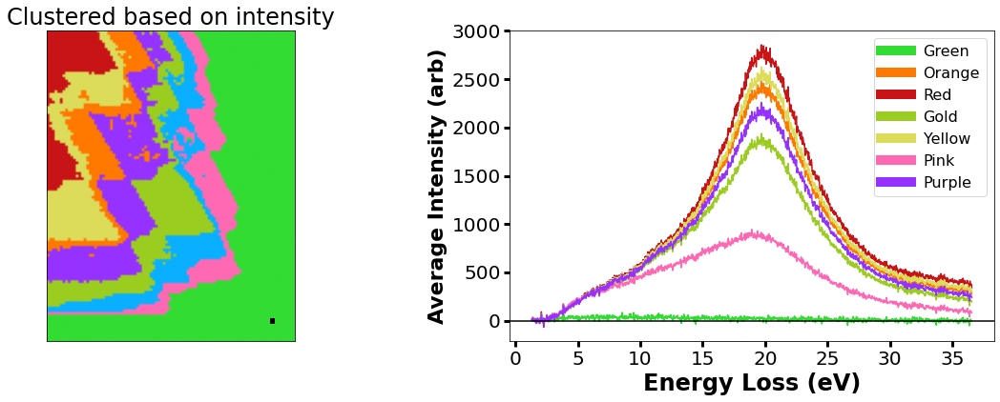

In [ ]:
thresh = 0.0000001
region_avg_array = np.zeros((n_comps, SINB_list[ii].shape[2]))

fig,ax = plt.subplots(1,2,figsize=(20,6))
ax[0].imshow(segmented_im_rgb)
ax[0].set_title('Clustered based on intensity', fontsize = 24)

for spec in range(0, len(masked_imgs)):
  if spec == 2:
    pass
  else:
    binary = np.copy(masked_imgs[spec])
    binary[np.where(binary < thresh)] = np.nan
    binary[np.where(binary >= thresh)] = 1
    binary3d = np.zeros_like(SINB_list[ii])
    for m in range(binary3d.shape[2]):
      binary3d[:,:,m] = binary
    region_avg = np.nanmean(SINB_list[ii]*binary3d,axis=(0,1))
    region_avg_array[spec] = region_avg
    ax[1].plot(ENB_list[ii], region_avg, color = Colors[spec], label = '{}'.format(Colors_string[spec]))

plt.setp(ax[0], xticks=[], yticks=[])
ax[1].set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax[1].set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax[1].tick_params(labelsize = 20, length = 6, width = 3)

leg = ax[1].legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax[1].axhline(0, color = 'k')

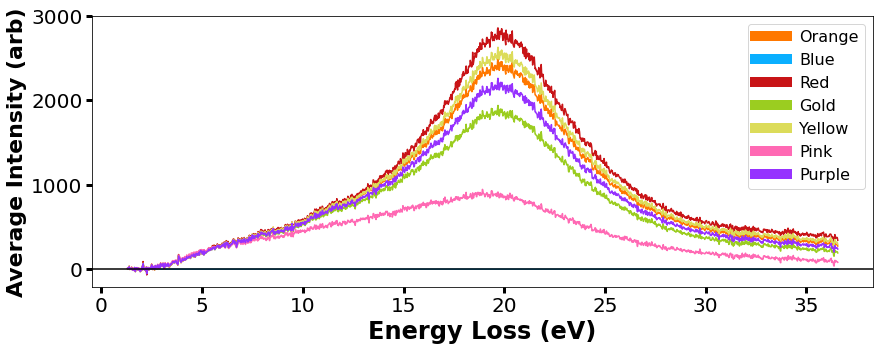

In [ ]:
plt.figure(figsize=(14,5))
ax = plt.gca()

for s in range(n_comps):
  if s != 0:
    ax.plot(ENB_list[ii], region_avg_array[s], color = Colors[s], label = '{}'.format(Colors_string[s]))
ax.set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax.set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax.tick_params(labelsize = 20, length = 6, width = 3)

leg = ax.legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax.axhline(0, color = 'k')

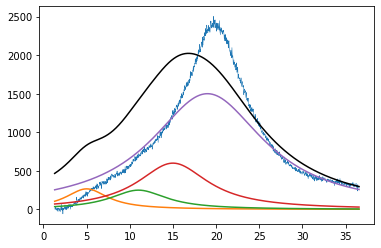

In [ ]:
spec = 1

def lorz(x,a,x0,g):
    return a*g/((x-x0)**2+g**2)
def lorz2(x,a1,a2,x01,x02,g1,g2):
    return lorz(x,a1,x01,g1)+lorz(x,a2,x02,g2)
def lorz3(x,a1,a2,a3,x01,x02,x03,g1,g2,g3):
    return lorz(x,a1,x01,g1)+lorz(x,a2,x02,g2)+lorz(x,a3,x03,g3)
def lorz4(x,a1,a2,a3,a4,x01,x02,x03,x04,g1,g2,g3,g4):
    return lorz(x,a1,x01,g1)+lorz(x,a2,x02,g2)+lorz(x,a3,x03,g3)+lorz(x,a4,x04,g4)
def lorz5(x,a1,a2,a3,a4,a5,x01,x02,x03,x04,x05,g1,g2,g3,g4,g5):
    return lorz(x,a1,x01,g1)+lorz(x,a2,x02,g2)+lorz(x,a3,x03,g3)+lorz(x,a4,x04,g4)+lorz(x,a5,x05,g5)


LorzDict={1:lorz,2:lorz2,3:lorz3,4:lorz4,5:lorz5}

plt.figure()


A=[800,1000,3000,12000]
X0=[5, 11, 15, 19]
G=[3 ,4,5, 8]


# A=[800,1000,5000,8000]
# X0=[6, 10, 15, 18]
# G=[3 ,4, 7,  8]

# A=[800,12000]
# X0=[6, 18]
# G=[3,  8]


N=len(A)
guess=np.array([A,X0,G]).reshape(N*3)
plt.plot(ENB_list[ii],region_avg_array[spec],lw=0.5)
for a,x0,g in zip(A,X0,G): 
    plt.plot(ENB_list[ii],lorz(ENB_list[ii],a,x0,g))
plt.plot(ENB_list[ii],LorzDict[N](ENB_list[ii],*guess),color='k')

In [ ]:
from scipy.optimize import curve_fit

[-5.38315486e+02  1.17136772e+03  1.61618408e+05  9.68073126e+03
  2.35320606e+00  1.24472804e+01  8.30375294e+01  1.99224469e+01
  2.37575772e+00  5.48671202e+00  2.08807261e+00  4.33795824e+00]


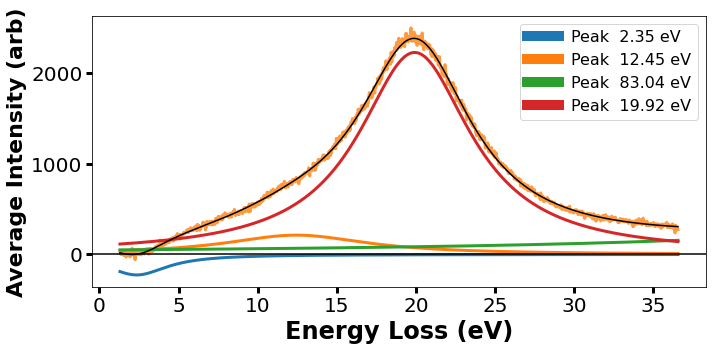

In [ ]:
# spec = 1

f,ax=plt.subplots(1,figsize=(11,5))
# ax[0].plot(ENB_list[ii],region_avg_array[spec],lw=0.5)
# for a,x0,g in zip(A,X0,G): 
    # ax[0].plot(ENB_list[ii],lorz(ENB_list[ii],a,x0,g))
# ax[0].plot(ENB_list[ii],LorzDict[N](ENB_list[ii],*guess),color='k')
# ax[0].set_ylim(-500,2000)
fprops=curve_fit(LorzDict[N],ENB_list[ii],region_avg_array[spec],guess, maxfev = 200000)[0]
ax.plot(ENB_list[ii],region_avg_array[spec],lw=3, alpha = 0.75, color = Colors[spec])
for i in range(N):
    ax.plot(ENB_list[ii],lorz(ENB_list[ii],fprops[i],fprops[i+N],fprops[i+2*N]), label = 'Peak  {0:0.2f} eV'.format(fprops[i+N]), lw = 3)
ax.plot(ENB_list[ii],LorzDict[N](ENB_list[ii],*fprops),color='k')

ax.set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax.set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax.tick_params(labelsize = 20, length = 6, width = 3)

leg = ax.legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax.axhline(0, color = 'k')

print(fprops)

* Forced Bounds

In [ ]:
specshift = 3

bounds=([*np.zeros(N),*(np.asarray(X0) - specshift),*(1*np.ones(N))],          # lower limits for all variables
        [*(np.inf*np.ones(N)),*(np.asarray(X0) + specshift),*(10*np.ones(N))])   # upper limits for all variables

bounds

([0.0, 0.0, 0.0, 0.0, 2, 8, 12, 16, 1.0, 1.0, 1.0, 1.0],
 [inf, inf, inf, inf, 8, 14, 18, 22, 10.0, 10.0, 10.0, 10.0])

[1.96762930e+02 3.94574650e+02 5.43743047e+02 4.47962664e+03
 7.14879116e+00 1.06723049e+01 1.44033957e+01 1.95528706e+01
 1.45704946e+00 2.07196456e+00 2.79702053e+00 5.44817926e+00]


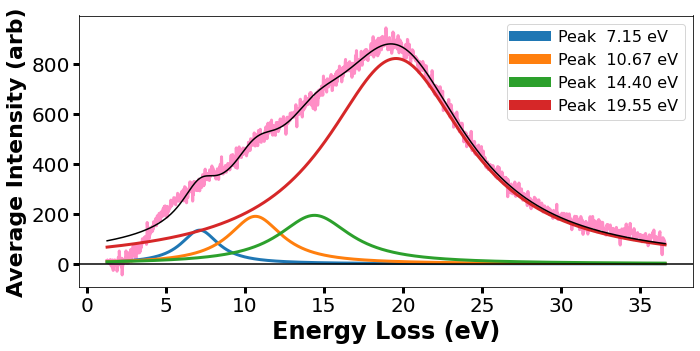

In [ ]:
spec = 6

f,ax=plt.subplots(1,figsize=(11,5))
# ax[0].plot(ENB_list[ii],region_avg_array[spec],lw=0.5)
# for a,x0,g in zip(A,X0,G): 
    # ax[0].plot(ENB_list[ii],lorz(ENB_list[ii],a,x0,g))
# ax[0].plot(ENB_list[ii],LorzDict[N](ENB_list[ii],*guess),color='k')
# ax[0].set_ylim(-500,2000)
fprops=curve_fit(LorzDict[N],ENB_list[ii],region_avg_array[spec],guess,bounds=bounds, maxfev = 200000)[0]
ax.plot(ENB_list[ii],region_avg_array[spec],lw=3, alpha = 0.75, color = Colors[spec])
for i in range(N):
    ax.plot(ENB_list[ii],lorz(ENB_list[ii],fprops[i],fprops[i+N],fprops[i+2*N]), label = 'Peak  {0:0.2f} eV'.format(fprops[i+N]), lw = 3)
ax.plot(ENB_list[ii],LorzDict[N](ENB_list[ii],*fprops),color='k')

ax.set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax.set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax.tick_params(labelsize = 20, length = 6, width = 3)

leg = ax.legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax.axhline(0, color = 'k')

print(fprops)

In [ ]:
peak_data = find_peaks(region_avg_array[7], width = 50)
pos, peakint = peak_data[0][0], peak_data[1]['prominences'][0]
pos,peakint

# peak_data = find_peaks(targets[k], width=100)
# peak_pos, peak_int = peak_data[0][0], peak_data[1]['prominences'][0]
# plt.plot(targets[k], zorder=0)
# print(peak_pos, peak_int)
# plt.scatter(peak_pos, peak_int, marker='x', s=50, c='k', zorder=1)

(908, 2058.466528784964)

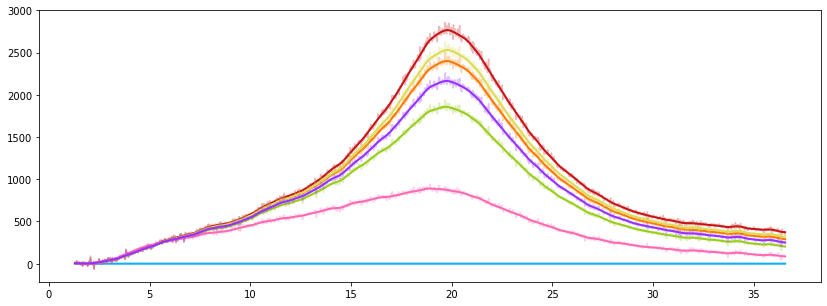

In [ ]:
plt.figure(figsize=(14,5))
ax = plt.gca()
Peak_list = []
for s in range(n_comps):
  if s !=0:
    spectrum = region_avg_array[s]
    spectrum_blur = ndimage.gaussian_filter(region_avg_array[s], sigma = 10)
    ax.plot(ENB_list[ii], spectrum_blur, color = Colors[s], label = '{}'.format(Colors_string[s]), lw = 2)
    ax.plot(ENB_list[ii], spectrum, color = Colors[s], alpha = 0.3)

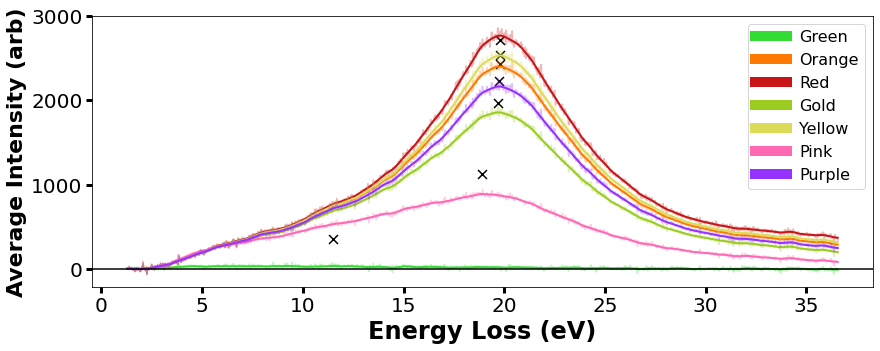

In [ ]:
plt.figure(figsize=(14,5))
ax = plt.gca()
Peak_list = []
for s in range(n_comps):
  if  s != 2:
    spectrum = region_avg_array[s]
    spectrum_blur = ndimage.gaussian_filter(region_avg_array[s], sigma = 10)
    ax.plot(ENB_list[ii], spectrum_blur, color = Colors[s], label = '{}'.format(Colors_string[s]), lw = 2)
    ax.plot(ENB_list[ii], spectrum, color = Colors[s], alpha = 0.3)
    peak_data = find_peaks(spectrum_blur, width = 300)
    peak_pos, peak_int = peak_data[0][0], peak_data[1]['prominences'][0]
    Peak_list.append(ENB_list[ii][peak_pos])
    ax.scatter(ENB_list[ii][peak_pos], peak_int+320, marker='x', s=80, c='k')
ax.set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax.set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax.tick_params(labelsize = 20, length = 6, width = 3)

leg = ax.legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax.axhline(0, color = 'k')

Text(0, 0.5, 'Energy (eV)')

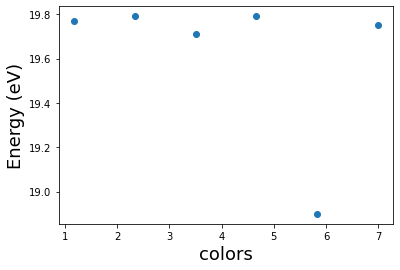

In [ ]:
temp_xaxis = np.linspace(0,len(Peak_list),len(Peak_list))
plt.scatter(temp_xaxis[1:],Peak_list[1:])
plt.xlabel('colors', fontsize = 18)
plt.ylabel("Energy (eV)", fontsize = 18)

In [ ]:
Peak_list

[19.68936205852925,
 19.68936205852925,
 19.68936205852925,
 19.68936205852925,
 19.68936205852925,
 18.919660747873923,
 19.68936205852925]

* Ignore yellow (includes most of the substrate!)

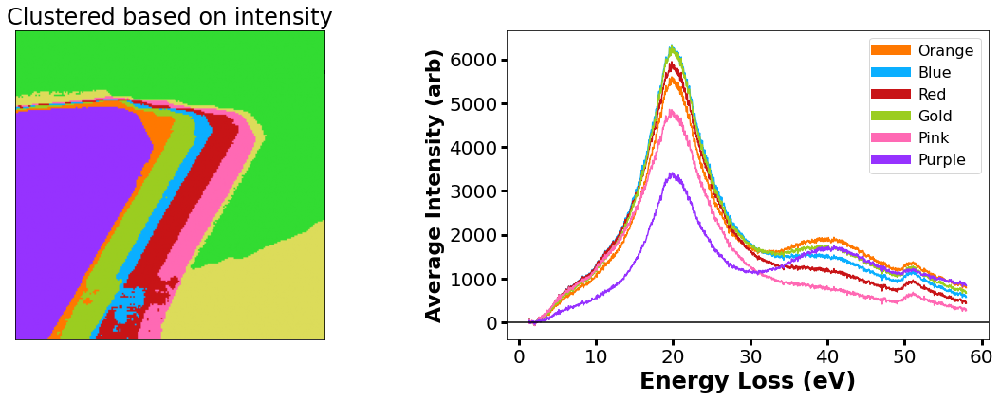

In [ ]:
thresh = 0.0000001

fig,ax = plt.subplots(1,2,figsize=(20,6))
ax[0].imshow(segmented_im_rgb)
ax[0].set_title('Clustered based on intensity', fontsize = 24)

for spec in range(1, len(masked_imgs)):
  if spec == 5:
    pass
  else:
    binary = np.copy(masked_imgs[spec])
    binary[np.where(binary < thresh)] = np.nan
    binary[np.where(binary >= thresh)] = 1
    binary3d = np.zeros_like(SINB_list[ii])
    for m in range(binary3d.shape[2]):
      binary3d[:,:,m] = binary
    region_avg = np.nanmean(SINB_list[ii]*binary3d,axis=(0,1))
    ax[1].plot(ENB_list[ii], region_avg, color = Colors[spec], label = '{}'.format(Colors_string[spec]))

plt.setp(ax[0], xticks=[], yticks=[])
ax[1].set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax[1].set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax[1].tick_params(labelsize = 20, length = 6, width = 3)

leg = ax[1].legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax[1].axhline(0, color = 'k')

In [ ]:
# napari.view_surface(SINB_list[4])

### Moire #1

In [ ]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.linear_model import LinearRegression
from sklearn.mixture import GaussianMixture

(-0.5, 179.5, 179.5, -0.5)

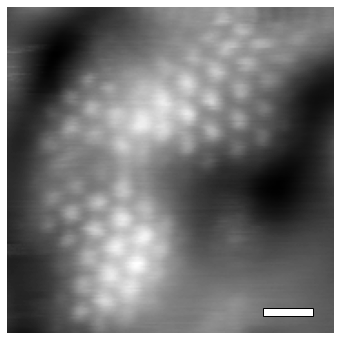

In [ ]:
ii = 2
scalebar = 5

normed_img = normalize(image[ii])
plt.figure(figsize=(6,6))
ax= plt.gca()
ax.imshow(normed_img, cmap = 'gray')

scale = img_scales[ii]

length = scalebar/scale  
height = length/6 
origin = 0.78*normed_img.shape[1], 0.92*normed_img.shape[0]

ax.add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))
ax.axis('off')

* bring out the moire patterns more:

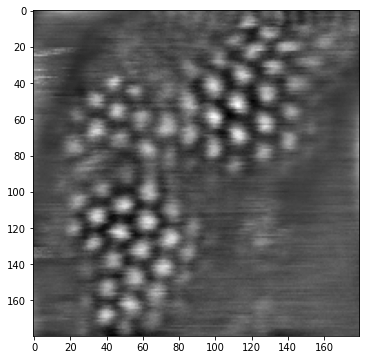

In [ ]:
blurred = ndimage.gaussian_filter(normed_img, 5)
normed_img = normalize(normed_img - blurred)

plt.figure(figsize=(6,6))
plt.imshow(normed_img, cmap = 'gray')

In [ ]:
# from 

In [ ]:
n_comps = 2

scalebar =5 # nm

kmeans = KMeans(n_clusters = n_comps)
normed_img_s = normed_img.reshape(-1,1)
s = kmeans.fit(normed_img_s)
labels = kmeans.labels_
labels=list(labels)
centroid = kmeans.cluster_centers_
segmented_im = centroid[labels]
segmented_im = segmented_im.reshape(normed_img.shape)

fig,ax = plt.subplots(1,2,figsize=(14,7))
ax[0].imshow(segmented_im, cmap = 'gnuplot2')
# ax[0].imshow(segmented_im, cmap = Colors)
ax[1].imshow(normed_img, cmap = 'gray')

ax[0].set_title('Clustered based on intensity', fontsize = 24)
ax[1].set_title('HAADF-STEM', fontsize = 24)
plt.setp([ax[0],ax[1]], xticks=[], yticks =[]);

scale = img_scales[ii]
length = scalebar/scale  
height = length/6 
origin = 0.78*segmented_im.shape[1], 0.92*segmented_im.shape[0]

ax[1].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

In [ ]:
rows

2

* Now we actually segment the image and grab the pixels here.

In [ ]:
# n_comps = 8
masked_imgs = np.zeros((n_comps,normed_img.shape[0],normed_img.shape[1]))
kmeans = KMeans(n_clusters = n_comps)
normed_img_s = normed_img.reshape(-1,1)
s = kmeans.fit(normed_img_s)
labels = kmeans.labels_
labels=list(labels)
centroid = kmeans.cluster_centers_
segmented_im = centroid[labels]
segmented_im = segmented_im.reshape(normed_img.shape)

num_im = len(centroid)
try:
  rows = int(np.ceil(float(num_im)/4))
except TypeError:
  rows = 1
try:
  cols = int(np.ceil(float(num_im)/rows))
except TypeError:
  cols = num_im

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (6*cols, 4*(1+rows)))   
for cluster in range(num_im):
    ax = fig.add_subplot(gs[cluster])
    masked_image = np.copy(normed_img)
    for c in range(len(centroid)):
      if c == cluster:
        pass
      else:
        masked_image[np.asarray(np.reshape(labels, normed_img.shape)) == c] = 0
    masked_image = masked_image.reshape(normed_img.shape)
    masked_imgs[cluster] = normalize(masked_image)
    ax.imshow(masked_image, cmap = 'gnuplot2')
    ax.axis('off')

In [ ]:
# Colors_string = ['Purple','Orange','Blue','Red','Green','Yellow','Pink','Gold']
# Colors = [Purple,Orange,Blue,Red,Green,Yellow,Pink,Gold]

In [ ]:
Colors = [Green,Purple,Orange,Blue,Red,Gold,Yellow,Pink,Purple]
Colors_string = ['Green','Purple','Orange','Blue','Red','Gold','Yellow','Pink','Purple']

segmented_im_rgb = MakeCompositeImage(masked_imgs, Colors)

scalebar = 5 # nm

fig,ax = plt.subplots(1,2,figsize=(14,7))
ax[1].imshow(segmented_im_rgb)
ax[0].imshow(normed_img, cmap = 'gray')

ax[1].set_title('Clustered based on intensity', fontsize = 24)
ax[0].set_title('HAADF-STEM', fontsize = 24)
plt.setp([ax[0],ax[1]], xticks=[], yticks =[]);

scale = img_scales[ii]
length = scalebar/scale  
height = length/6 
origin = 0.78*segmented_im.shape[1], 0.92*segmented_im.shape[0]

ax[0].add_patch(patches.Rectangle((origin), length, height, fill = True, ec = 'k', color = 'w'))

* Collect EELS from each of these and plot. We can remove others that we don't like later (like that substrate)

* Collect them ALL

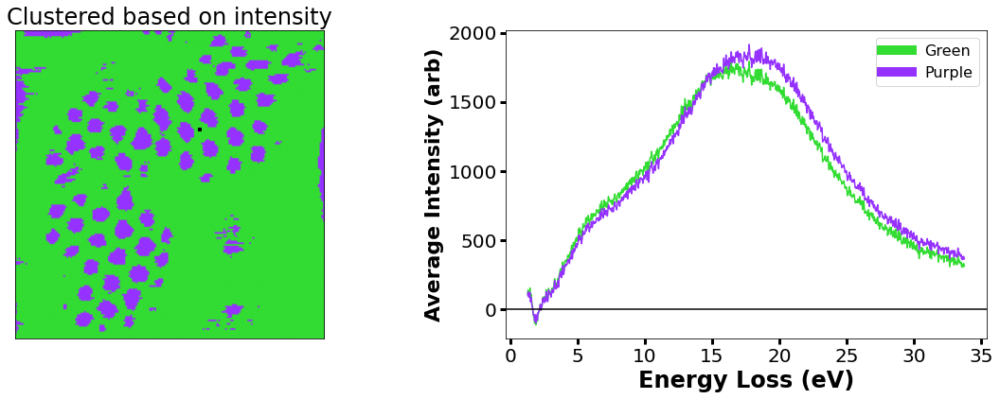

In [ ]:
thresh = 0.0000001
region_avg_array = np.zeros((n_comps, SINB_list[ii].shape[2]))

fig,ax = plt.subplots(1,2,figsize=(20,6))
ax[0].imshow(segmented_im_rgb)
ax[0].set_title('Clustered based on intensity', fontsize = 24)

for spec in range(0, len(masked_imgs)):
  if spec == 2:
    pass
  else:
    binary = np.copy(masked_imgs[spec])
    binary[np.where(binary < thresh)] = np.nan
    binary[np.where(binary >= thresh)] = 1
    binary3d = np.zeros_like(SINB_list[ii])
    for m in range(binary3d.shape[2]):
      binary3d[:,:,m] = binary
    region_avg = np.nanmean(SINB_list[ii]*binary3d,axis=(0,1))
    region_avg_array[spec] = region_avg
    ax[1].plot(ENB_list[ii], region_avg, color = Colors[spec], label = '{}'.format(Colors_string[spec]))

plt.setp(ax[0], xticks=[], yticks=[])
ax[1].set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax[1].set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax[1].tick_params(labelsize = 20, length = 6, width = 3)

leg = ax[1].legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax[1].axhline(0, color = 'k')

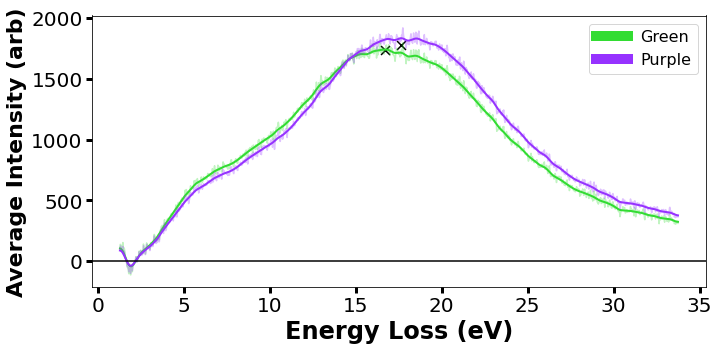

In [ ]:
plt.figure(figsize=(11,5))
ax = plt.gca()
Peak_list = []
for s in range(n_comps):
    spectrum = region_avg_array[s]
    spectrum_blur = ndimage.gaussian_filter(region_avg_array[s], sigma = 10)
    ax.plot(ENB_list[ii], spectrum_blur, color = Colors[s], label = '{}'.format(Colors_string[s]), lw = 2)
    ax.plot(ENB_list[ii], spectrum, color = Colors[s], alpha = 0.3)
    peak_data = find_peaks(spectrum_blur, width = 100)
    peak_pos, peak_int = peak_data[0][0], peak_data[1]['prominences'][0]
    Peak_list.append(ENB_list[ii][peak_pos])
    ax.scatter(ENB_list[ii][peak_pos], peak_int+320, marker='x', s=80, c='k')
ax.set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax.set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax.tick_params(labelsize = 20, length = 6, width = 3)

leg = ax.legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax.axhline(0, color = 'k')

In [ ]:
temp_xaxis = np.linspace(0,len(Peak_list),len(Peak_list))
plt.scatter(temp_xaxis,Peak_list)
plt.xlabel('colors', fontsize = 18)
plt.ylabel("Energy (eV)", fontsize = 18)
Peak_list

In [ ]:
Peak_list

* Ignore yellow (includes most of the substrate!)

* PEAK FIT

In [ ]:
region_avg_array.shape

(2, 1717)

In [ ]:
spec = 0

def lorz(x,a,x0,g):
    return a*g/((x-x0)**2+g**2)
def lorz2(x,a1,a2,x01,x02,g1,g2):
    return lorz(x,a1,x01,g1)+lorz(x,a2,x02,g2)
def lorz3(x,a1,a2,a3,x01,x02,x03,g1,g2,g3):
    return lorz(x,a1,x01,g1)+lorz(x,a2,x02,g2)+lorz(x,a3,x03,g3)
def lorz4(x,a1,a2,a3,a4,x01,x02,x03,x04,g1,g2,g3,g4):
    return lorz(x,a1,x01,g1)+lorz(x,a2,x02,g2)+lorz(x,a3,x03,g3)+lorz(x,a4,x04,g4)
def lorz5(x,a1,a2,a3,a4,a5,x01,x02,x03,x04,x05,g1,g2,g3,g4,g5):
    return lorz(x,a1,x01,g1)+lorz(x,a2,x02,g2)+lorz(x,a3,x03,g3)+lorz(x,a4,x04,g4)+lorz(x,a5,x05,g5)


LorzDict={1:lorz,2:lorz2,3:lorz3,4:lorz4,5:lorz5}

plt.figure()


A=[800,1000,12000]
X0=[6, 10, 18]
G=[3 ,4, 8]


# A=[800,1000,5000,8000]
# X0=[6, 10, 15, 18]
# G=[3 ,4, 7,  8]

# A=[800,12000]
# X0=[6, 18]
# G=[3,  8]


N=len(A)
guess=np.array([A,X0,G]).reshape(N*3)
plt.plot(ENB_list[ii],region_avg_array[spec],lw=0.5)
for a,x0,g in zip(A,X0,G): 
    plt.plot(ENB_list[ii],lorz(ENB_list[ii],a,x0,g))
plt.plot(ENB_list[ii],LorzDict[N](ENB_list[ii],*guess),color='k')

In [ ]:
from scipy.optimize import curve_fit

[5.43242485e+02 2.86277724e+03 9.82139323e+03 8.35674366e+00
 1.46374941e+01 1.97766608e+01 2.06420729e+00 3.93922320e+00
 6.66649068e+00]


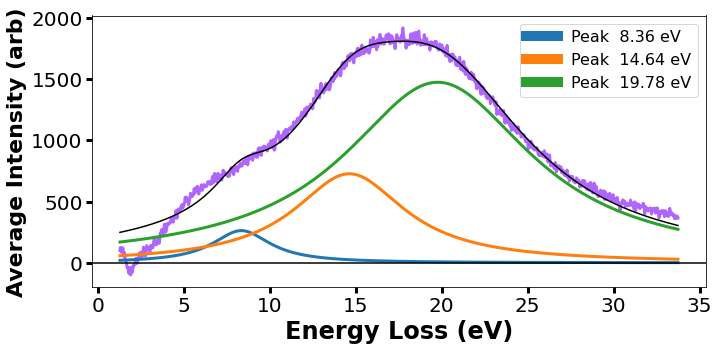

In [ ]:
spec = 1

f,ax=plt.subplots(1,figsize=(11,5))
# ax[0].plot(ENB_list[ii],region_avg_array[spec],lw=0.5)
# for a,x0,g in zip(A,X0,G): 
    # ax[0].plot(ENB_list[ii],lorz(ENB_list[ii],a,x0,g))
# ax[0].plot(ENB_list[ii],LorzDict[N](ENB_list[ii],*guess),color='k')
# ax[0].set_ylim(-500,2000)
fprops=curve_fit(LorzDict[N],ENB_list[ii],region_avg_array[spec],guess, maxfev = 200000)[0]
ax.plot(ENB_list[ii],region_avg_array[spec],lw=3, alpha = 0.75, color = Colors[spec])
for i in range(N):
    ax.plot(ENB_list[ii],lorz(ENB_list[ii],fprops[i],fprops[i+N],fprops[i+2*N]), label = 'Peak  {0:0.2f} eV'.format(fprops[i+N]), lw = 3)
ax.plot(ENB_list[ii],LorzDict[N](ENB_list[ii],*fprops),color='k')

ax.set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax.set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax.tick_params(labelsize = 20, length = 6, width = 3)

leg = ax.legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax.axhline(0, color = 'k')

print(fprops)

* Forced Bounds

In [ ]:
specshift = 2

bounds=([*np.zeros(N),*(np.asarray(X0) - specshift),*(1*np.ones(N))],          # lower limits for all variables
        [*(np.inf*np.ones(N)),*(np.asarray(X0) + specshift),*(10*np.ones(N))])   # upper limits for all variables

In [ ]:
# bounds = [0, 0, 0, 0, 0.47, 0.665, 0.835, 1.075, 0.01, 0.01, 0.01, 0.01], [np.inf, np.inf, np.inf, np.inf, 0.62, 0.715, 0.885, 1.125, 0.2, 0.2, 0.2, 0.2]

In [ ]:
bounds

([0.0, 0.0, 0.0, 4, 8, 16, 1.0, 1.0, 1.0],
 [inf, inf, inf, 8, 12, 20, 10.0, 10.0, 10.0])

[2.16076256e+02 1.44495916e+03 1.12926878e+04 6.97536234e+00
 1.20000000e+01 1.82303820e+01 1.04359223e+00 3.35581226e+00
 6.84367782e+00]


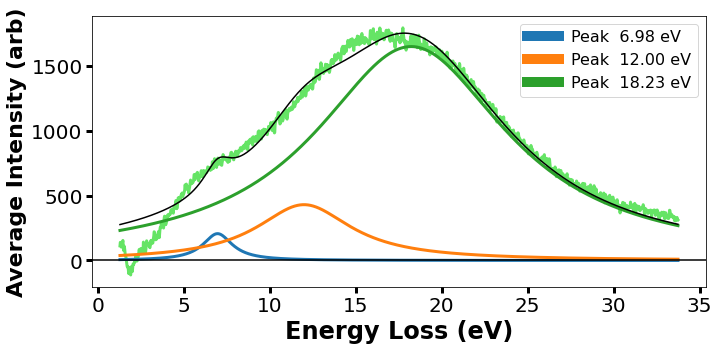

In [ ]:
spec = 0

f,ax=plt.subplots(1,figsize=(11,5))
# ax[0].plot(ENB_list[ii],region_avg_array[spec],lw=0.5)

fprops=curve_fit(LorzDict[N],ENB_list[ii],region_avg_array[spec],guess, bounds = bounds, maxfev = 200000)[0]
ax.plot(ENB_list[ii],region_avg_array[spec],lw=3, alpha = 0.75, color = Colors[spec])
for i in range(N):
    ax.plot(ENB_list[ii],lorz(ENB_list[ii],fprops[i],fprops[i+N],fprops[i+2*N]), label = 'Peak  {0:0.2f} eV'.format(fprops[i+N]), lw = 3)
ax.plot(ENB_list[ii],LorzDict[N](ENB_list[ii],*fprops),color='k')

ax.set_xlabel('Energy Loss (eV)', fontsize = 24, weight = 'bold')
ax.set_ylabel('Average Intensity (arb)', fontsize = 22, weight = 'bold')
ax.tick_params(labelsize = 20, length = 6, width = 3)

leg = ax.legend(fontsize=16)
for line in leg.get_lines():
  line.set_linewidth(10)
ax.axhline(0, color = 'k')

print(fprops)

# Calculations (electronic structure & dielectric properties)

In [ ]:
!wget https://www.dropbox.com/s/q1dpwqic2521pak/eps-plot.txt
epsdata = np.loadtxt("eps-plot.txt")

--2021-09-29 04:03:14--  https://www.dropbox.com/s/q1dpwqic2521pak/eps-plot.txt
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6021:18::a27d:4112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/q1dpwqic2521pak/eps-plot.txt [following]
--2021-09-29 04:03:15--  https://www.dropbox.com/s/raw/q1dpwqic2521pak/eps-plot.txt
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc5d6e561529e56e908c318d7b50.dl.dropboxusercontent.com/cd/0/inline/BXALcyncibtBtaYn1OMKvRpCr8Ibn4mHwyMv3UO6icUbIIU4HHpZANjnmTF7y0Sngg6TpJTuWYLodIJFMh9Tko8a6sF8_SCWC3UOwJo597puwbAM2o28uEJsH5zhK3-HpSsFw-y-4VK_qjKb8e6hmGYE/file# [following]
--2021-09-29 04:03:15--  https://uc5d6e561529e56e908c318d7b50.dl.dropboxusercontent.com/cd/0/inline/BXALcyncibtBtaYn1OMKvRpCr8Ibn4mHwyMv3UO6icUbIIU4HHpZANjnmTF7y0Sngg6TpJTuWYLodIJFMh9Tko8

In [ ]:
energy = epsdata[:,0]

eps100 ={}
eps100['e1_p'] = epsdata[:,1]
eps100['e2_p'] = epsdata[:,2]
eps100['e1'] = epsdata[:,3]
eps100['e2'] = epsdata[:,4]

eps010 ={}
eps010['e1_p'] = epsdata[:,5]
eps010['e2_p'] = epsdata[:,6]
eps010['e1'] = epsdata[:,7]
eps010['e2'] = epsdata[:,8]

eps001 ={}
eps001['e1_p'] = epsdata[:,9]
eps001['e2_p'] = epsdata[:,10]
eps001['e1'] = epsdata[:,11]
eps001['e2'] = epsdata[:,12]

eps555 ={}
eps555['e1_p'] = epsdata[:,13]
eps555['e2_p'] = epsdata[:,14]
eps555['e1'] = epsdata[:,15]
eps555['e2'] = epsdata[:,16]

In [ ]:
from matplotlib.ticker import MaxNLocator

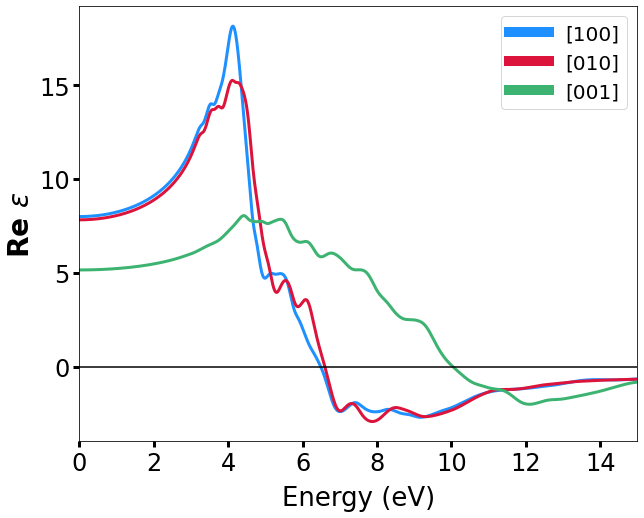

In [ ]:
plt.figure(figsize=(10,8))
ax= plt.gca()

ax.plot(energy,eps100['e1'], label = '[100]', lw = 3, color = 'dodgerblue')
ax.plot(energy,eps010['e1'], label = '[010]', lw = 3, color = 'crimson')
ax.plot(energy,eps001['e1'], label = '[001]', lw = 3, color = 'mediumseagreen')


ax.set_xlabel('Energy (eV)', fontsize = 26, labelpad = 10)
ax.set_ylabel("Re "+r'$\epsilon$', fontsize = 28, weight = 'bold', rotation = 90)
ax.tick_params(labelsize = 24, length = 6, width = 3)
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

leg = ax.legend(fontsize=20)
for line in leg.get_lines():
  line.set_linewidth(10)
ax.axhline(0, color = 'k')

ax.set_xlim(0,15)
# plt.plot(energy,eps555['e2'])
ylims = ax.get_ylim()

[]

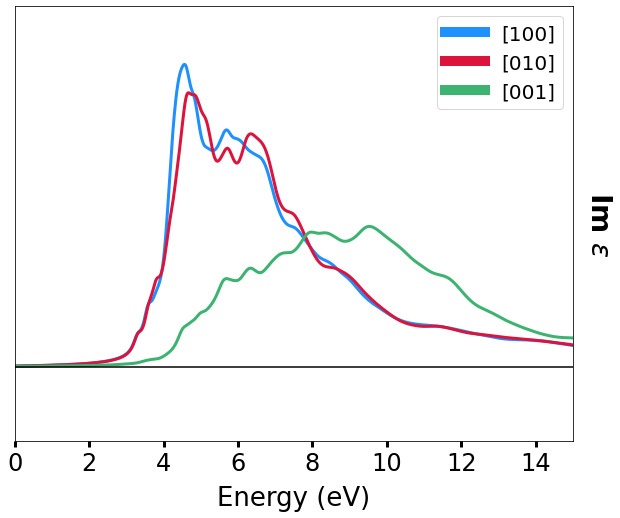

In [ ]:
plt.figure(figsize=(10,8))
ax= plt.gca()

ax.plot(energy,eps100['e2'], label = '[100]', lw = 3, color = 'dodgerblue')
ax.plot(energy,eps010['e2'], label = '[010]', lw = 3, color = 'crimson')
ax.plot(energy,eps001['e2'], label = '[001]', lw = 3, color = 'mediumseagreen')


ax.set_xlabel('Energy (eV)', fontsize = 26, labelpad = 10)
ax.set_ylabel("Im "+r'$\epsilon$', fontsize = 28, weight = 'bold', rotation = 270, labelpad = 40)
ax.tick_params(labelsize = 24, length = 6, width = 3)
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

leg = ax.legend(fontsize=20)
for line in leg.get_lines():
  line.set_linewidth(10)
ax.axhline(0, color = 'k')

ax.set_xlim(0,15)
ax.set_ylim(ylims)

ax.yaxis.set_label_position("right")
plt.setp([ax], yticks=[])


# plt.plot(energy,eps555['e2'])